In [1]:
from mlagents.torch_utils import torch, default_device
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import art3d
import numpy as np

from dataset import MotionData
from autoencoder import StaticEncoder, AutoEncoder
from discriminator import Discriminator
from mlagents.plugins.bvh_utils import lafan_utils
from mlagents.plugins.bvh_utils import BVH_mod as BVH

%config Completer.use_jedi = False

In [2]:
def skeleton_plot(points, edges, color):

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    # order is x,z,y
    xzy = [0,2,1]
    points[:,2] = -points[:,2]
    ax.scatter(points[:,0],points[:,2],points[:,1] ,c=color, marker='o')

    lines = np.zeros((len(edges), 2, 3))

    for i, e in enumerate(edges):
        point1 = points[e[0],:]
        point2 = points[e[1],:]
        lines[i,0,:] = point1[xzy]
        lines[i,1,:] = point2[xzy]

        # print(x,y,z)
        # ax.plot(x,y,z)
    lc = art3d.Line3DCollection(lines, linewidths=2)
    ax.add_collection(lc)
    ax.set_zlim(-20,100)
    ax.set_xlim(-50,50)
    ax.set_ylim(-40,40)

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')

    plt.show()

In [3]:
# setup cuda devices
if torch.cuda.is_available():
    device = 'cuda:0'
else:
    device = 'cpu'
    
torch.device(device)

device(type='cuda', index=0)

In [10]:
# training parameters ...
epochs = 200
learning_rate = 0.0002
betas=(0.9, 0.999)
batch_size = 8

mult_ee  = 2
mult_adv = 0
mult_velo= 0

real_label = 1
fake_label = 0

isNormalize = False

In [11]:
train_path = './data/Aj'
test_path = './data/Test'

dataset = MotionData(train_path,recalculate_mean_var=False, normalize_data = isNormalize,device=device)
test_dataset = MotionData(test_path,recalculate_mean_var=False, normalize_data = isNormalize, device=device)

test_dataset.mean_var = dataset.mean_var

train_Motion_Data = torch.utils.data.DataLoader(dataset, shuffle=True, batch_size=batch_size, num_workers=0)
test_Motion_Data = torch.utils.data.DataLoader(test_dataset, shuffle=True, batch_size=batch_size, num_workers=0)

[DATASET] input motion shape:  torch.Size([1671, 92])
[DATASET] load mean var
[DATASET] mean var shape:  torch.Size([2, 92])
[DATASET] input motion reshape:  torch.Size([835, 2, 92])
[DATASET] input motion shape:  torch.Size([180, 92])
[DATASET] load mean var
[DATASET] mean var shape:  torch.Size([2, 92])
[DATASET] input motion reshape:  torch.Size([90, 2, 92])


In [12]:
# skeleton information : topology and offsets 
file_path = "./data/Aj/walking.bvh"
anim, names, frametime = BVH.load(file_path, need_quater = False)

num_joints = len(anim.parents)
edges = torch.zeros((num_joints-1, 2), dtype=int, requires_grad=False)

# generate edge list
count = 0
for i, parent in enumerate(anim.parents):
    # check if parent is existent
    if parent != -1:
        edges[count, 0] = parent 
        edges[count, 1] = i
        count += 1
        
# extract end effectors for autoencoder loss
# TODO: make the loss tolerant to different shapes and sizes 
ee_id, j_count = torch.unique(edges.reshape(-1), return_counts = True)
ee_id = ee_id[j_count==1]

# generate skeleton offsets, shape [1,J,3]       
offsets = torch.tensor(np.tile(anim.offsets[np.newaxis, :,:],(batch_size*2, 1, 1)), device=default_device()).float()

In [13]:
auto_encoder = AutoEncoder(edges).to(device)
static_encoder = StaticEncoder(edges).to(device)
discriminator = Discriminator(edges).to(device)

In [14]:
real_label = 1.0
fake_label = 0.0

# this might be the only loss we can use since we don't 
# have a direct reference to a motion
# criterion_gan = torch.nn.MSELoss()
criterion_gan = torch.nn.MSELoss()
criterion_ee = torch.nn.MSELoss()
criterion_velo = torch.nn.MSELoss()

# Optimizers
# concatenate parameters used for pose generation
gen_parameters = list(auto_encoder.parameters()) + list(static_encoder.parameters())

gen_optimizer = torch.optim.Adam(gen_parameters, lr=learning_rate, betas=(0.9, 0.999))
discrim_optimizer = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.9, 0.999))


Epoch :  0
Batch : 0, Discriminator loss: 0.5032588243484497, Generator loss : 1844.644775390625
Batch : 25, Discriminator loss: 0.48760443925857544, Generator loss : 1609.5928955078125
Batch : 50, Discriminator loss: 0.4754515290260315, Generator loss : 1399.413818359375
Batch : 75, Discriminator loss: 0.45889967679977417, Generator loss : 1138.0484619140625
Batch : 100, Discriminator loss: 0.43483829498291016, Generator loss : 1042.7618408203125
Epoch 0 complete, cumulated Discriminator loss : 49.761661529541016, cumulated Generator loss : 146160.921875


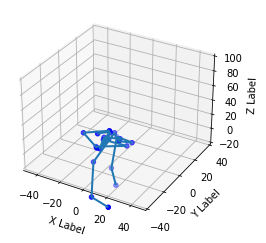

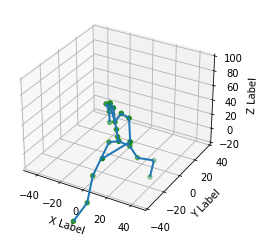

Epoch :  1
Batch : 0, Discriminator loss: 0.4414452612400055, Generator loss : 1089.0015869140625
Batch : 25, Discriminator loss: 0.4182313084602356, Generator loss : 878.1331176757812
Batch : 50, Discriminator loss: 0.3935057520866394, Generator loss : 637.2991943359375
Batch : 75, Discriminator loss: 0.39603137969970703, Generator loss : 502.4912414550781
Batch : 100, Discriminator loss: 0.34815579652786255, Generator loss : 505.78887939453125
Epoch 1 complete, cumulated Discriminator loss : 42.770408630371094, cumulated Generator loss : 69053.171875


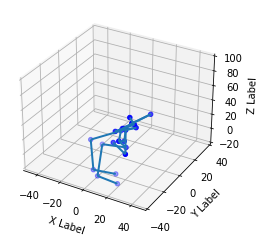

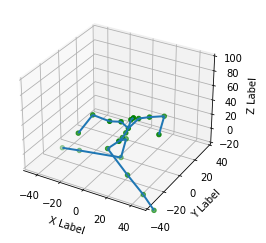

Epoch :  2
Batch : 0, Discriminator loss: 0.36663466691970825, Generator loss : 341.186767578125
Batch : 25, Discriminator loss: 0.3242264986038208, Generator loss : 373.8578186035156
Batch : 50, Discriminator loss: 0.2142815738916397, Generator loss : 420.18695068359375
Batch : 75, Discriminator loss: 0.28288084268569946, Generator loss : 382.02130126953125
Batch : 100, Discriminator loss: 0.1491793692111969, Generator loss : 305.3724670410156
Epoch 2 complete, cumulated Discriminator loss : 27.142494201660156, cumulated Generator loss : 43086.921875


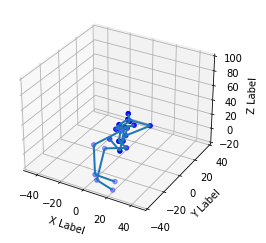

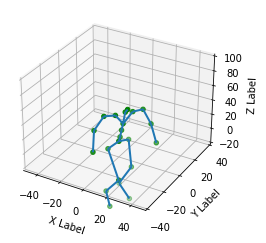

Epoch :  3
Batch : 0, Discriminator loss: 0.14854562282562256, Generator loss : 428.0879821777344
Batch : 25, Discriminator loss: 0.1350935697555542, Generator loss : 395.6316833496094
Batch : 50, Discriminator loss: 0.17833104729652405, Generator loss : 347.1839599609375
Batch : 75, Discriminator loss: 0.1089453250169754, Generator loss : 326.7456359863281
Batch : 100, Discriminator loss: 0.06108729913830757, Generator loss : 339.4200134277344
Epoch 3 complete, cumulated Discriminator loss : 10.82480525970459, cumulated Generator loss : 36576.5703125


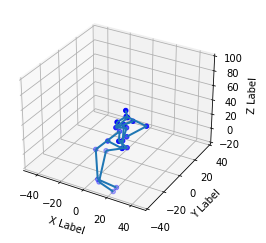

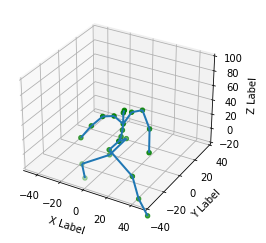

Epoch :  4
Batch : 0, Discriminator loss: 0.041616082191467285, Generator loss : 306.6029052734375
Batch : 25, Discriminator loss: 0.04585259407758713, Generator loss : 454.7716979980469
Batch : 50, Discriminator loss: 0.051811255514621735, Generator loss : 337.627685546875
Batch : 75, Discriminator loss: 0.06102847307920456, Generator loss : 479.85150146484375
Batch : 100, Discriminator loss: 0.048632923513650894, Generator loss : 198.0201873779297
Epoch 4 complete, cumulated Discriminator loss : 5.068803787231445, cumulated Generator loss : 34417.82421875


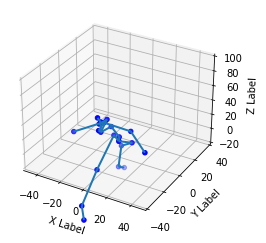

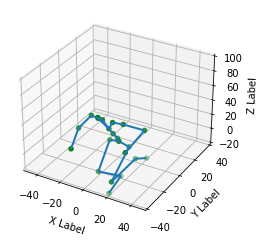

Epoch :  5
Batch : 0, Discriminator loss: 0.049509502947330475, Generator loss : 319.15240478515625
Batch : 25, Discriminator loss: 0.0227971114218235, Generator loss : 244.96804809570312
Batch : 50, Discriminator loss: 0.02655615098774433, Generator loss : 213.91763305664062
Batch : 75, Discriminator loss: 0.03207746148109436, Generator loss : 293.9064636230469
Batch : 100, Discriminator loss: 0.012892762199044228, Generator loss : 291.3804931640625
Epoch 5 complete, cumulated Discriminator loss : 2.8766326904296875, cumulated Generator loss : 33559.26171875


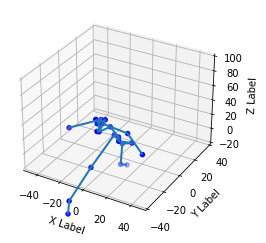

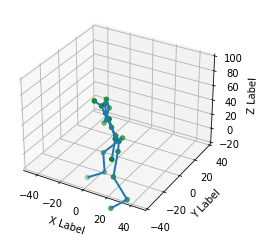

Epoch :  6
Batch : 0, Discriminator loss: 0.0072244442999362946, Generator loss : 273.596435546875
Batch : 25, Discriminator loss: 0.014612901024520397, Generator loss : 293.98712158203125
Batch : 50, Discriminator loss: 0.00938244815915823, Generator loss : 346.03912353515625
Batch : 75, Discriminator loss: 0.04810338467359543, Generator loss : 414.1812744140625
Batch : 100, Discriminator loss: 0.02360309474170208, Generator loss : 191.36387634277344
Epoch 6 complete, cumulated Discriminator loss : 1.9221153259277344, cumulated Generator loss : 32967.49609375


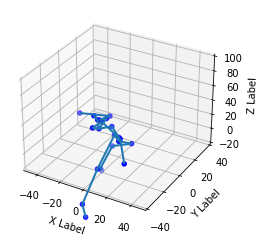

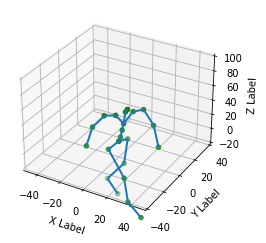

Epoch :  7
Batch : 0, Discriminator loss: 0.02002781629562378, Generator loss : 200.4872283935547
Batch : 25, Discriminator loss: 0.012533232569694519, Generator loss : 289.9356994628906
Batch : 50, Discriminator loss: 0.00847085751593113, Generator loss : 223.99728393554688
Batch : 75, Discriminator loss: 0.030879132449626923, Generator loss : 224.9391326904297
Batch : 100, Discriminator loss: 0.004185652360320091, Generator loss : 451.32183837890625
Epoch 7 complete, cumulated Discriminator loss : 1.2865444421768188, cumulated Generator loss : 32228.732421875


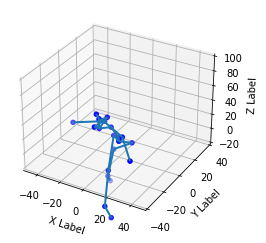

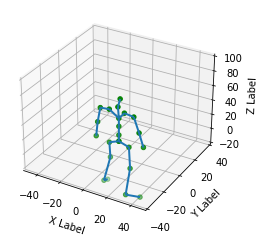

Epoch :  8
Batch : 0, Discriminator loss: 0.016477810218930244, Generator loss : 195.6342315673828
Batch : 25, Discriminator loss: 0.02064766362309456, Generator loss : 459.57073974609375
Batch : 50, Discriminator loss: 0.004848566371947527, Generator loss : 286.921630859375
Batch : 75, Discriminator loss: 0.004955417476594448, Generator loss : 272.65667724609375
Batch : 100, Discriminator loss: 0.002080941339954734, Generator loss : 324.88360595703125
Epoch 8 complete, cumulated Discriminator loss : 0.9191339015960693, cumulated Generator loss : 30899.060546875


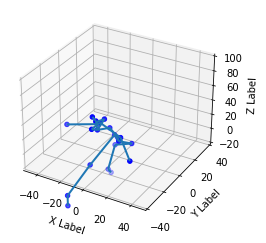

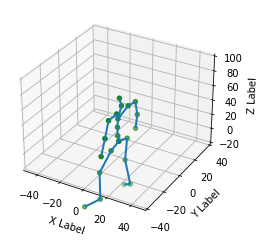

Epoch :  9
Batch : 0, Discriminator loss: 0.00443436112254858, Generator loss : 356.0396423339844
Batch : 25, Discriminator loss: 0.004545506089925766, Generator loss : 331.6598815917969
Batch : 50, Discriminator loss: 0.007300007157027721, Generator loss : 223.94796752929688
Batch : 75, Discriminator loss: 0.002928448375314474, Generator loss : 390.6683044433594
Batch : 100, Discriminator loss: 0.002472569467499852, Generator loss : 370.3838195800781
Epoch 9 complete, cumulated Discriminator loss : 0.9675871729850769, cumulated Generator loss : 30192.7734375


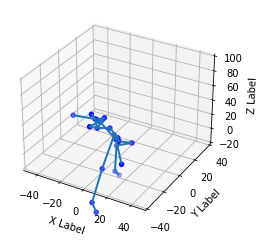

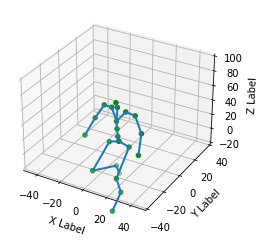

Epoch :  10
Batch : 0, Discriminator loss: 0.0037931599654257298, Generator loss : 371.72784423828125
Batch : 25, Discriminator loss: 0.11004239320755005, Generator loss : 205.7425079345703
Batch : 50, Discriminator loss: 0.0402352511882782, Generator loss : 301.8169860839844
Batch : 75, Discriminator loss: 0.0012726515997201204, Generator loss : 209.76136779785156
Batch : 100, Discriminator loss: 0.012619176879525185, Generator loss : 319.282958984375
Epoch 10 complete, cumulated Discriminator loss : 0.9668554663658142, cumulated Generator loss : 29026.33984375


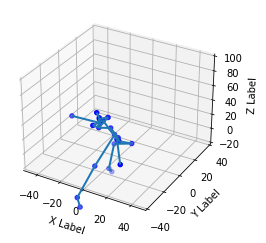

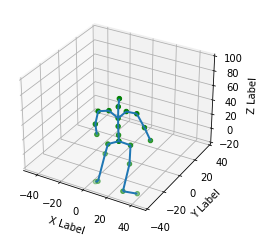

Epoch :  11
Batch : 0, Discriminator loss: 0.001726207323372364, Generator loss : 275.5003356933594
Batch : 25, Discriminator loss: 0.0007525831460952759, Generator loss : 365.75341796875
Batch : 50, Discriminator loss: 0.0027675179298967123, Generator loss : 200.06036376953125
Batch : 75, Discriminator loss: 0.008657952770590782, Generator loss : 312.39447021484375
Batch : 100, Discriminator loss: 0.003996085375547409, Generator loss : 261.4613037109375
Epoch 11 complete, cumulated Discriminator loss : 0.7040427923202515, cumulated Generator loss : 27965.986328125


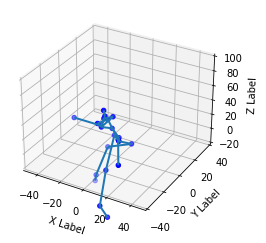

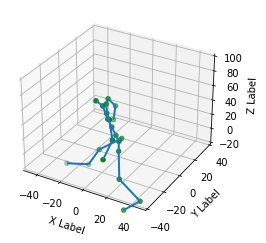

Epoch :  12
Batch : 0, Discriminator loss: 0.0007300244178622961, Generator loss : 297.4797058105469
Batch : 25, Discriminator loss: 0.003127224277704954, Generator loss : 312.0877685546875
Batch : 50, Discriminator loss: 0.006005504168570042, Generator loss : 519.1862182617188
Batch : 75, Discriminator loss: 0.0038442499935626984, Generator loss : 149.18809509277344
Batch : 100, Discriminator loss: 0.006141961552202702, Generator loss : 227.4145050048828
Epoch 12 complete, cumulated Discriminator loss : 1.4408442974090576, cumulated Generator loss : 27005.033203125


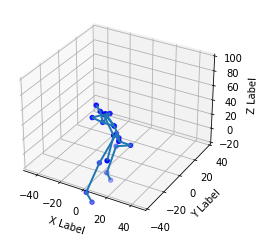

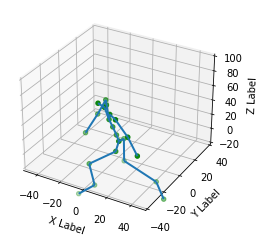

Epoch :  13
Batch : 0, Discriminator loss: 0.0038750593084841967, Generator loss : 168.22409057617188
Batch : 25, Discriminator loss: 0.02290591411292553, Generator loss : 337.947265625
Batch : 50, Discriminator loss: 0.02189699187874794, Generator loss : 368.2974853515625
Batch : 75, Discriminator loss: 0.006780571769922972, Generator loss : 193.7188262939453
Batch : 100, Discriminator loss: 0.0030220914632081985, Generator loss : 338.1359558105469
Epoch 13 complete, cumulated Discriminator loss : 1.379936933517456, cumulated Generator loss : 25802.31640625


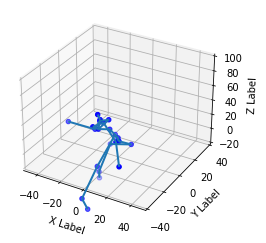

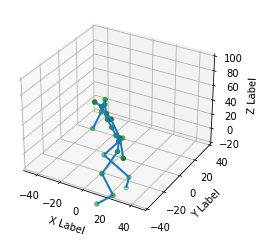

Epoch :  14
Batch : 0, Discriminator loss: 0.0030132532119750977, Generator loss : 222.67947387695312
Batch : 25, Discriminator loss: 0.0013435983564704657, Generator loss : 165.80368041992188
Batch : 50, Discriminator loss: 0.0010471601272001863, Generator loss : 266.0086975097656
Batch : 75, Discriminator loss: 0.0023344869259744883, Generator loss : 244.67002868652344
Batch : 100, Discriminator loss: 0.0015561238396912813, Generator loss : 163.3397216796875
Epoch 14 complete, cumulated Discriminator loss : 0.7439911961555481, cumulated Generator loss : 24701.646484375


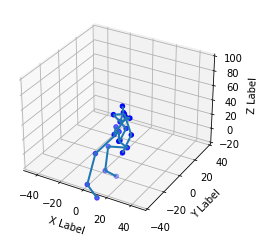

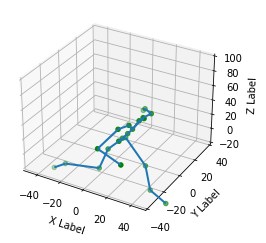

Epoch :  15
Batch : 0, Discriminator loss: 0.001378716784529388, Generator loss : 317.40167236328125
Batch : 25, Discriminator loss: 0.0013432336272671819, Generator loss : 255.62689208984375
Batch : 50, Discriminator loss: 0.0031579043716192245, Generator loss : 251.37168884277344
Batch : 75, Discriminator loss: 0.0004967018030583858, Generator loss : 290.1590881347656
Batch : 100, Discriminator loss: 0.004474296234548092, Generator loss : 151.4991912841797
Epoch 15 complete, cumulated Discriminator loss : 0.9133811593055725, cumulated Generator loss : 23371.94921875


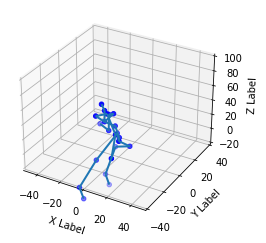

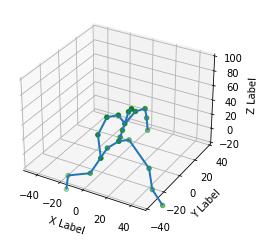

Epoch :  16
Batch : 0, Discriminator loss: 0.014842572622001171, Generator loss : 154.65872192382812
Batch : 25, Discriminator loss: 0.006020144559442997, Generator loss : 247.7202606201172
Batch : 50, Discriminator loss: 0.0013533435994759202, Generator loss : 311.7371826171875
Batch : 75, Discriminator loss: 0.0016539841890335083, Generator loss : 206.5196533203125
Batch : 100, Discriminator loss: 0.007562292739748955, Generator loss : 161.7598419189453
Epoch 16 complete, cumulated Discriminator loss : 0.7933863401412964, cumulated Generator loss : 21970.66015625


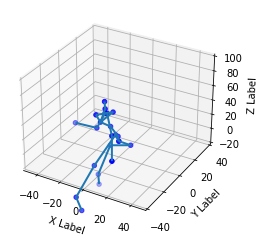

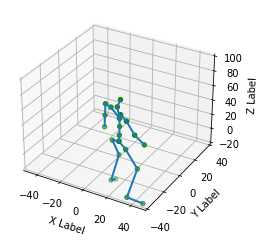

Epoch :  17
Batch : 0, Discriminator loss: 0.009913647547364235, Generator loss : 272.19976806640625
Batch : 25, Discriminator loss: 0.0004683256847783923, Generator loss : 182.95030212402344
Batch : 50, Discriminator loss: 0.0025633666664361954, Generator loss : 164.1337127685547
Batch : 75, Discriminator loss: 0.00037380363210104406, Generator loss : 284.54119873046875
Batch : 100, Discriminator loss: 0.00999387726187706, Generator loss : 118.80062103271484
Epoch 17 complete, cumulated Discriminator loss : 0.9749314188957214, cumulated Generator loss : 21185.296875


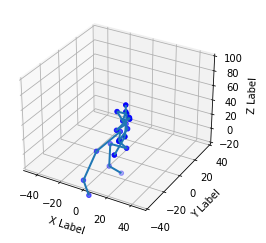

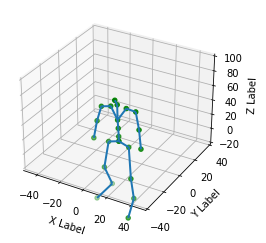

Epoch :  18
Batch : 0, Discriminator loss: 0.0019501283532008529, Generator loss : 136.81114196777344
Batch : 25, Discriminator loss: 0.011098675429821014, Generator loss : 245.55726623535156
Batch : 50, Discriminator loss: 0.007127320393919945, Generator loss : 128.018310546875
Batch : 75, Discriminator loss: 0.0008658141014166176, Generator loss : 209.15750122070312
Batch : 100, Discriminator loss: 0.0002949488698504865, Generator loss : 140.19383239746094
Epoch 18 complete, cumulated Discriminator loss : 0.6686360239982605, cumulated Generator loss : 19884.376953125


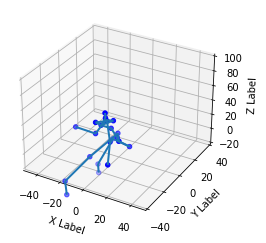

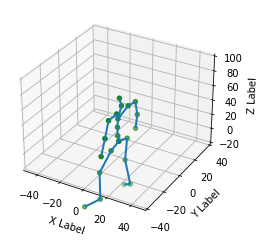

Epoch :  19
Batch : 0, Discriminator loss: 0.005107005592435598, Generator loss : 352.62274169921875
Batch : 25, Discriminator loss: 0.017210647463798523, Generator loss : 271.4910583496094
Batch : 50, Discriminator loss: 0.0008624402107670903, Generator loss : 191.7809295654297
Batch : 75, Discriminator loss: 0.001353082712739706, Generator loss : 74.38831329345703
Batch : 100, Discriminator loss: 0.0007459604530595243, Generator loss : 100.67896270751953
Epoch 19 complete, cumulated Discriminator loss : 0.3464057147502899, cumulated Generator loss : 18415.791015625


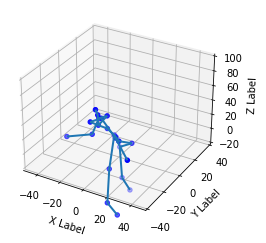

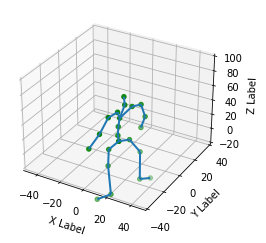

Epoch :  20
Batch : 0, Discriminator loss: 0.014398668892681599, Generator loss : 95.09176635742188
Batch : 25, Discriminator loss: 0.0002206663048127666, Generator loss : 111.26377868652344
Batch : 50, Discriminator loss: 0.006629671901464462, Generator loss : 165.7754669189453
Batch : 75, Discriminator loss: 0.0015101958997547626, Generator loss : 172.49505615234375
Batch : 100, Discriminator loss: 0.0021038600243628025, Generator loss : 334.2901916503906
Epoch 20 complete, cumulated Discriminator loss : 0.4859083890914917, cumulated Generator loss : 17284.21484375


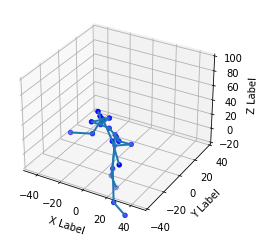

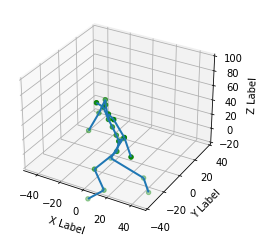

Epoch :  21
Batch : 0, Discriminator loss: 8.527638419764116e-05, Generator loss : 178.8487091064453
Batch : 25, Discriminator loss: 0.01669204607605934, Generator loss : 274.0403137207031
Batch : 50, Discriminator loss: 0.0025395420379936695, Generator loss : 230.93968200683594
Batch : 75, Discriminator loss: 0.0008289844263345003, Generator loss : 192.2632293701172
Batch : 100, Discriminator loss: 0.021599180996418, Generator loss : 86.61720275878906
Epoch 21 complete, cumulated Discriminator loss : 0.961143970489502, cumulated Generator loss : 15459.181640625


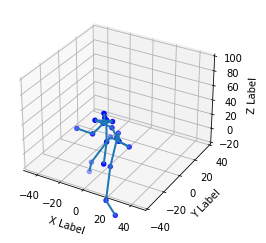

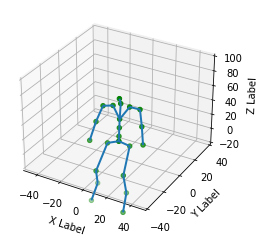

Epoch :  22
Batch : 0, Discriminator loss: 0.0013324525207281113, Generator loss : 70.13307189941406
Batch : 25, Discriminator loss: 0.0008830945589579642, Generator loss : 83.04785919189453
Batch : 50, Discriminator loss: 0.00044559279922395945, Generator loss : 151.6503448486328
Batch : 75, Discriminator loss: 0.0001235892268596217, Generator loss : 133.53317260742188
Batch : 100, Discriminator loss: 0.0034702480770647526, Generator loss : 81.26251983642578
Epoch 22 complete, cumulated Discriminator loss : 0.4182235300540924, cumulated Generator loss : 14333.0048828125


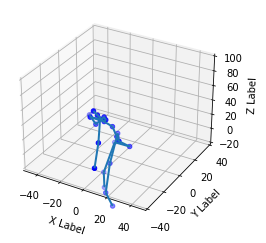

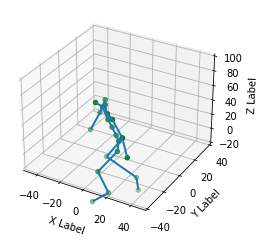

Epoch :  23
Batch : 0, Discriminator loss: 5.493089702213183e-05, Generator loss : 77.19428253173828
Batch : 25, Discriminator loss: 0.002216755412518978, Generator loss : 100.32254791259766
Batch : 50, Discriminator loss: 0.0010347268544137478, Generator loss : 170.4305419921875
Batch : 75, Discriminator loss: 0.0036131341475993395, Generator loss : 142.3606414794922
Batch : 100, Discriminator loss: 0.00630914093926549, Generator loss : 112.01358032226562
Epoch 23 complete, cumulated Discriminator loss : 0.9657598733901978, cumulated Generator loss : 12944.5908203125


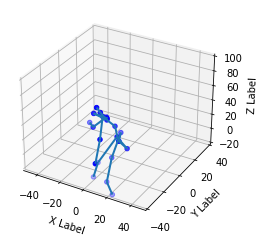

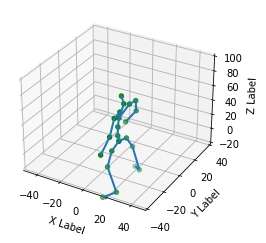

Epoch :  24
Batch : 0, Discriminator loss: 0.0004523473617155105, Generator loss : 88.25176239013672
Batch : 25, Discriminator loss: 0.00036804957198910415, Generator loss : 125.22352600097656
Batch : 50, Discriminator loss: 0.00018510174413677305, Generator loss : 71.42202758789062
Batch : 75, Discriminator loss: 0.003108945908024907, Generator loss : 140.7788543701172
Batch : 100, Discriminator loss: 0.00041487079579383135, Generator loss : 97.96192169189453
Epoch 24 complete, cumulated Discriminator loss : 1.0257309675216675, cumulated Generator loss : 10716.9228515625


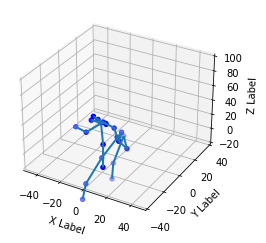

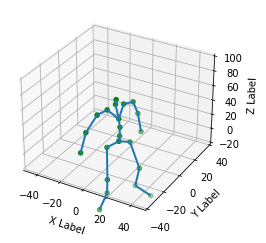

Epoch :  25
Batch : 0, Discriminator loss: 0.0012549054808914661, Generator loss : 78.82626342773438
Batch : 25, Discriminator loss: 0.0002966330212075263, Generator loss : 46.24748992919922
Batch : 50, Discriminator loss: 5.3859545005252585e-05, Generator loss : 84.81459045410156
Batch : 75, Discriminator loss: 0.0015857703983783722, Generator loss : 118.28404235839844
Batch : 100, Discriminator loss: 0.000267078576143831, Generator loss : 60.31301498413086
Epoch 25 complete, cumulated Discriminator loss : 0.7611259818077087, cumulated Generator loss : 9387.9189453125


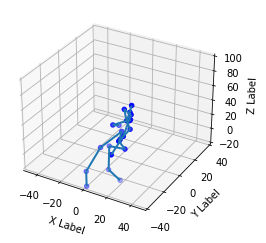

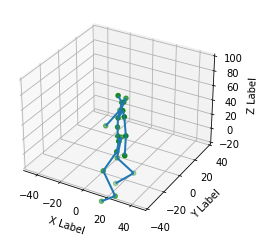

Epoch :  26
Batch : 0, Discriminator loss: 0.01871301233768463, Generator loss : 76.84674835205078
Batch : 25, Discriminator loss: 0.000501781702041626, Generator loss : 77.67256164550781
Batch : 50, Discriminator loss: 0.00100305350497365, Generator loss : 56.534027099609375
Batch : 75, Discriminator loss: 0.00019976936164312065, Generator loss : 72.6964340209961
Batch : 100, Discriminator loss: 7.944661774672568e-05, Generator loss : 57.45989227294922
Epoch 26 complete, cumulated Discriminator loss : 0.4750121831893921, cumulated Generator loss : 8304.9365234375


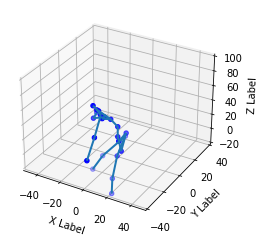

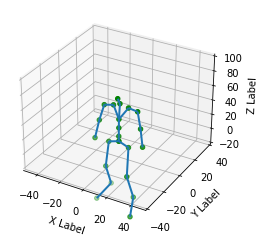

Epoch :  27
Batch : 0, Discriminator loss: 0.0006948530790396035, Generator loss : 54.43570327758789
Batch : 25, Discriminator loss: 0.0012883773306384683, Generator loss : 59.99240493774414
Batch : 50, Discriminator loss: 0.0012453272938728333, Generator loss : 64.33527374267578
Batch : 75, Discriminator loss: 0.0001498990022810176, Generator loss : 61.91787338256836
Batch : 100, Discriminator loss: 0.0001697423285804689, Generator loss : 55.464324951171875
Epoch 27 complete, cumulated Discriminator loss : 0.7233648300170898, cumulated Generator loss : 7420.224609375


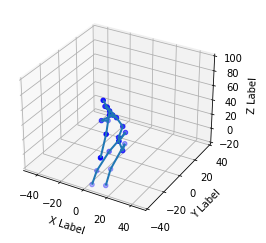

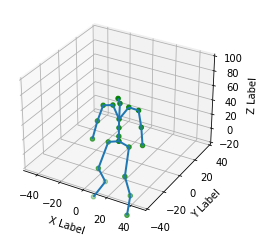

Epoch :  28
Batch : 0, Discriminator loss: 0.00027072179364040494, Generator loss : 45.46556854248047
Batch : 25, Discriminator loss: 6.304196722339839e-05, Generator loss : 68.43062591552734
Batch : 50, Discriminator loss: 0.0001365319185424596, Generator loss : 87.94120025634766
Batch : 75, Discriminator loss: 3.556215960998088e-05, Generator loss : 65.07591247558594
Batch : 100, Discriminator loss: 0.005127990618348122, Generator loss : 71.35223388671875
Epoch 28 complete, cumulated Discriminator loss : 0.352394700050354, cumulated Generator loss : 6788.4638671875


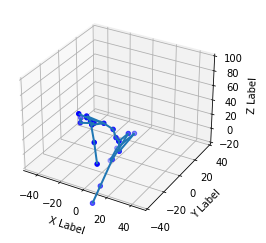

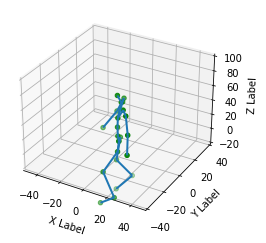

Epoch :  29
Batch : 0, Discriminator loss: 0.00013834783749189228, Generator loss : 51.26934051513672
Batch : 25, Discriminator loss: 0.00043325533624738455, Generator loss : 48.87980270385742
Batch : 50, Discriminator loss: 8.88414797373116e-05, Generator loss : 35.799537658691406
Batch : 75, Discriminator loss: 0.032818399369716644, Generator loss : 109.69023132324219
Batch : 100, Discriminator loss: 0.0006901683518663049, Generator loss : 58.529788970947266
Epoch 29 complete, cumulated Discriminator loss : 0.326123982667923, cumulated Generator loss : 6349.3603515625


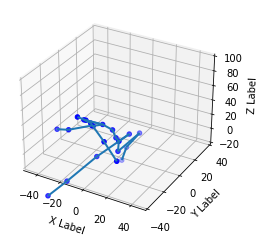

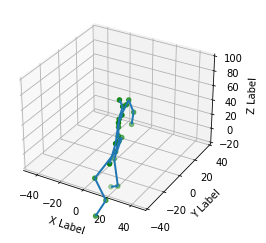

Epoch :  30
Batch : 0, Discriminator loss: 0.0036927741020917892, Generator loss : 55.90084457397461
Batch : 25, Discriminator loss: 0.0004543178074527532, Generator loss : 69.19670104980469
Batch : 50, Discriminator loss: 0.0043236007913947105, Generator loss : 59.918697357177734
Batch : 75, Discriminator loss: 0.025998027995228767, Generator loss : 60.99151611328125
Batch : 100, Discriminator loss: 0.0014566433383151889, Generator loss : 72.4631576538086
Epoch 30 complete, cumulated Discriminator loss : 0.6959000825881958, cumulated Generator loss : 6120.45263671875


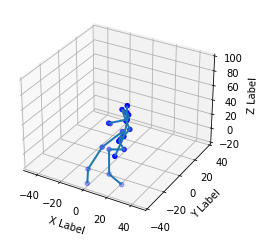

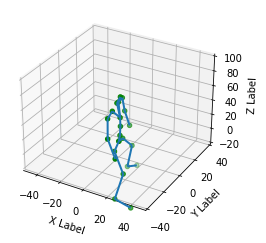

Epoch :  31
Batch : 0, Discriminator loss: 0.01001807302236557, Generator loss : 90.71987915039062
Batch : 25, Discriminator loss: 0.00013905938249081373, Generator loss : 56.9602165222168
Batch : 50, Discriminator loss: 6.165247759781778e-05, Generator loss : 30.973434448242188
Batch : 75, Discriminator loss: 0.0007590769091621041, Generator loss : 59.84711837768555
Batch : 100, Discriminator loss: 0.00010910595301538706, Generator loss : 41.501220703125
Epoch 31 complete, cumulated Discriminator loss : 0.48754826188087463, cumulated Generator loss : 5639.65625


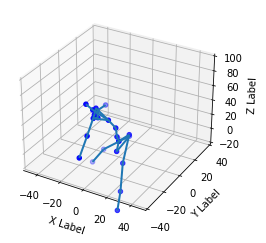

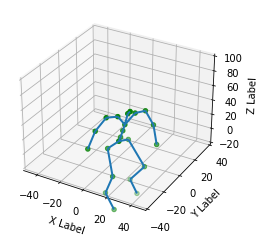

Epoch :  32
Batch : 0, Discriminator loss: 8.723323117010295e-05, Generator loss : 42.40306854248047
Batch : 25, Discriminator loss: 0.00025633597397245467, Generator loss : 58.48554992675781
Batch : 50, Discriminator loss: 0.001637691049836576, Generator loss : 52.043704986572266
Batch : 75, Discriminator loss: 0.00013131106970831752, Generator loss : 45.19655990600586
Batch : 100, Discriminator loss: 1.767929643392563e-05, Generator loss : 47.95088577270508
Epoch 32 complete, cumulated Discriminator loss : 0.3276362419128418, cumulated Generator loss : 5362.77197265625


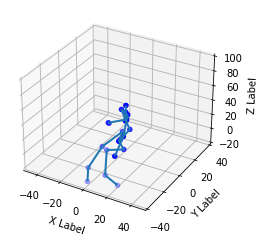

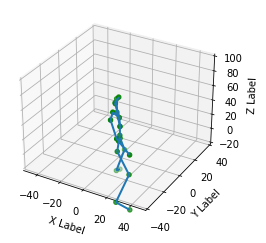

Epoch :  33
Batch : 0, Discriminator loss: 0.028519494459033012, Generator loss : 70.23526000976562
Batch : 25, Discriminator loss: 0.0002149263018509373, Generator loss : 37.46682357788086
Batch : 50, Discriminator loss: 0.000922667677514255, Generator loss : 44.77000427246094
Batch : 75, Discriminator loss: 0.00021756446221843362, Generator loss : 39.94887161254883
Batch : 100, Discriminator loss: 0.025833340361714363, Generator loss : 44.27774429321289
Epoch 33 complete, cumulated Discriminator loss : 0.20670531690120697, cumulated Generator loss : 5061.5517578125


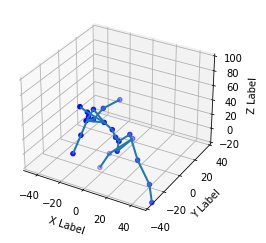

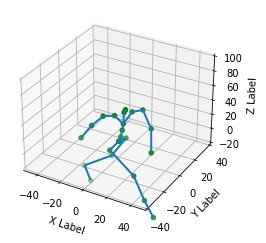

Epoch :  34
Batch : 0, Discriminator loss: 1.729727409838233e-05, Generator loss : 32.576148986816406
Batch : 25, Discriminator loss: 0.0015081892488524318, Generator loss : 43.37039566040039
Batch : 50, Discriminator loss: 0.00014662815374322236, Generator loss : 46.8093376159668
Batch : 75, Discriminator loss: 8.43572779558599e-05, Generator loss : 51.72377395629883
Batch : 100, Discriminator loss: 6.84542756062001e-05, Generator loss : 66.7314682006836
Epoch 34 complete, cumulated Discriminator loss : 0.356823205947876, cumulated Generator loss : 4966.06201171875


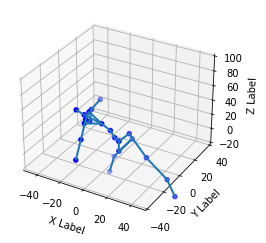

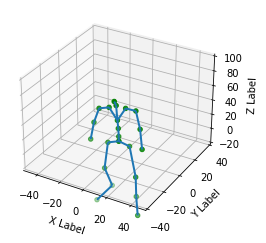

Epoch :  35
Batch : 0, Discriminator loss: 6.845421012258157e-05, Generator loss : 33.31867218017578
Batch : 25, Discriminator loss: 0.0007918202900327742, Generator loss : 29.831247329711914
Batch : 50, Discriminator loss: 0.005129668861627579, Generator loss : 41.93659210205078
Batch : 75, Discriminator loss: 0.00018791953334584832, Generator loss : 33.069053649902344
Batch : 100, Discriminator loss: 0.00046449131332337856, Generator loss : 62.81630325317383
Epoch 35 complete, cumulated Discriminator loss : 0.20432926714420319, cumulated Generator loss : 4677.17236328125


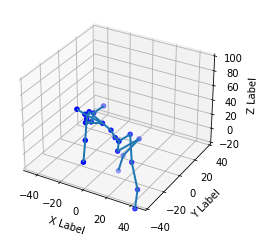

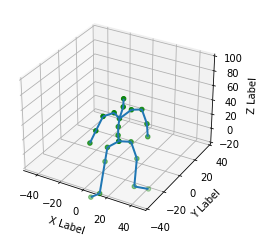

Epoch :  36
Batch : 0, Discriminator loss: 6.497190042864531e-05, Generator loss : 41.63209533691406
Batch : 25, Discriminator loss: 0.000475979846669361, Generator loss : 53.38422393798828
Batch : 50, Discriminator loss: 5.311150016495958e-05, Generator loss : 35.51939010620117
Batch : 75, Discriminator loss: 0.0007547319401055574, Generator loss : 46.71910095214844
Batch : 100, Discriminator loss: 0.0165932048112154, Generator loss : 47.170860290527344
Epoch 36 complete, cumulated Discriminator loss : 0.26264962553977966, cumulated Generator loss : 4672.14990234375


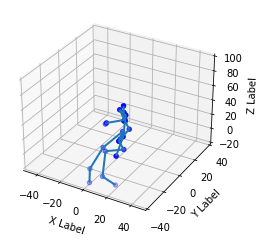

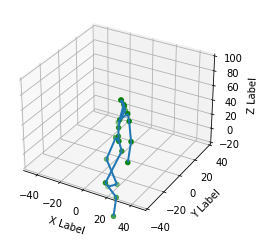

Epoch :  37
Batch : 0, Discriminator loss: 0.0005185786867514253, Generator loss : 50.51319885253906
Batch : 25, Discriminator loss: 0.00017978540563490242, Generator loss : 32.8800163269043
Batch : 50, Discriminator loss: 0.00022822339087724686, Generator loss : 45.83501052856445
Batch : 75, Discriminator loss: 0.024079039692878723, Generator loss : 51.20946502685547
Batch : 100, Discriminator loss: 0.021478042006492615, Generator loss : 41.46446228027344
Epoch 37 complete, cumulated Discriminator loss : 0.30174481868743896, cumulated Generator loss : 4216.61083984375


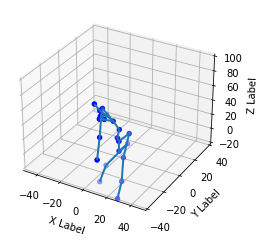

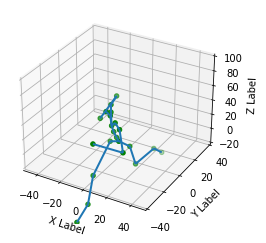

Epoch :  38
Batch : 0, Discriminator loss: 0.0036540792789310217, Generator loss : 33.98289108276367
Batch : 25, Discriminator loss: 1.131624958361499e-05, Generator loss : 38.47018051147461
Batch : 50, Discriminator loss: 0.0006276691565290093, Generator loss : 27.300426483154297
Batch : 75, Discriminator loss: 1.2256929039722309e-05, Generator loss : 37.45366287231445
Batch : 100, Discriminator loss: 0.0011893316404893994, Generator loss : 31.24223518371582
Epoch 38 complete, cumulated Discriminator loss : 0.12675741314888, cumulated Generator loss : 4049.134765625


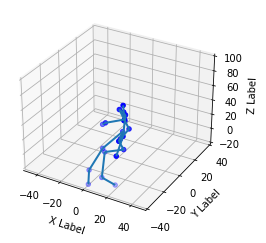

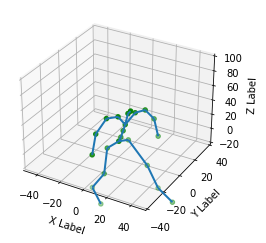

Epoch :  39
Batch : 0, Discriminator loss: 0.00014121286221779883, Generator loss : 35.05632781982422
Batch : 25, Discriminator loss: 0.0001187294619739987, Generator loss : 34.80035400390625
Batch : 50, Discriminator loss: 0.0007596676587127149, Generator loss : 64.03961181640625
Batch : 75, Discriminator loss: 0.0012012893566861749, Generator loss : 30.678674697875977
Batch : 100, Discriminator loss: 2.9379649276961572e-05, Generator loss : 36.006446838378906
Epoch 39 complete, cumulated Discriminator loss : 0.2166665941476822, cumulated Generator loss : 3897.991943359375


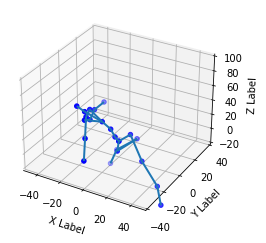

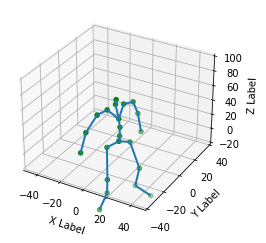

Epoch :  40
Batch : 0, Discriminator loss: 0.00014713020937051624, Generator loss : 27.475574493408203
Batch : 25, Discriminator loss: 0.0003574738511815667, Generator loss : 33.154075622558594
Batch : 50, Discriminator loss: 2.45171831920743e-05, Generator loss : 31.45473861694336
Batch : 75, Discriminator loss: 2.8839789592893794e-05, Generator loss : 27.57838249206543
Batch : 100, Discriminator loss: 5.367764970287681e-06, Generator loss : 40.21389389038086
Epoch 40 complete, cumulated Discriminator loss : 0.11478221416473389, cumulated Generator loss : 3830.357421875


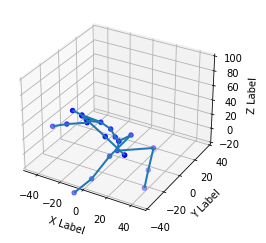

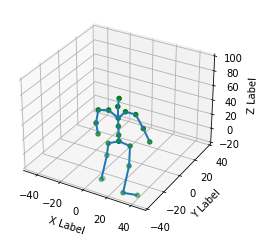

Epoch :  41
Batch : 0, Discriminator loss: 0.0005040549440309405, Generator loss : 45.338348388671875
Batch : 25, Discriminator loss: 0.00036805510171689093, Generator loss : 32.805397033691406
Batch : 50, Discriminator loss: 1.905561293824576e-05, Generator loss : 20.00457191467285
Batch : 75, Discriminator loss: 0.00011447594442870468, Generator loss : 38.38301467895508
Batch : 100, Discriminator loss: 7.17271541361697e-05, Generator loss : 31.5142822265625
Epoch 41 complete, cumulated Discriminator loss : 0.059258896857500076, cumulated Generator loss : 3730.093505859375


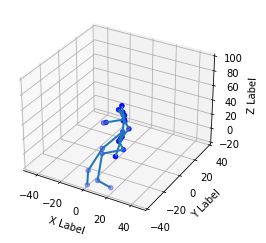

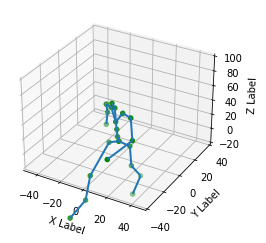

Epoch :  42
Batch : 0, Discriminator loss: 3.804429798037745e-05, Generator loss : 41.916717529296875
Batch : 25, Discriminator loss: 0.0005175065016373992, Generator loss : 35.9549560546875
Batch : 50, Discriminator loss: 0.0014110779156908393, Generator loss : 42.56901931762695
Batch : 75, Discriminator loss: 0.00348618533462286, Generator loss : 33.60759353637695
Batch : 100, Discriminator loss: 0.0005244131898507476, Generator loss : 43.0644645690918
Epoch 42 complete, cumulated Discriminator loss : 0.2885921895503998, cumulated Generator loss : 3674.300048828125


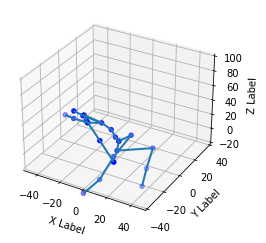

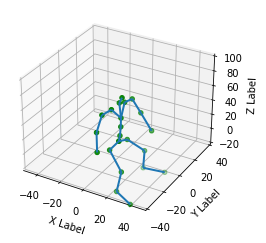

Epoch :  43
Batch : 0, Discriminator loss: 7.831944458303042e-06, Generator loss : 19.90160369873047
Batch : 25, Discriminator loss: 0.0001620798429939896, Generator loss : 33.1373405456543
Batch : 50, Discriminator loss: 3.2644577004248276e-05, Generator loss : 17.3831787109375
Batch : 75, Discriminator loss: 1.4299765098257922e-05, Generator loss : 18.326021194458008
Batch : 100, Discriminator loss: 0.00012041215813951567, Generator loss : 34.68403625488281
Epoch 43 complete, cumulated Discriminator loss : 0.1976027488708496, cumulated Generator loss : 3463.126953125


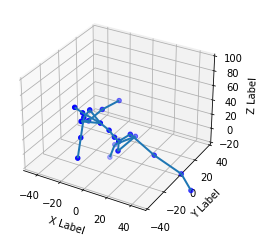

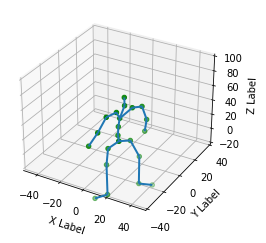

Epoch :  44
Batch : 0, Discriminator loss: 0.0009670461295172572, Generator loss : 26.872228622436523
Batch : 25, Discriminator loss: 0.002263893373310566, Generator loss : 25.20897102355957
Batch : 50, Discriminator loss: 8.335141319548711e-05, Generator loss : 36.5975227355957
Batch : 75, Discriminator loss: 0.0015251372242346406, Generator loss : 26.691709518432617
Batch : 100, Discriminator loss: 0.00263794232159853, Generator loss : 40.106571197509766
Epoch 44 complete, cumulated Discriminator loss : 0.03783305361866951, cumulated Generator loss : 3383.144775390625


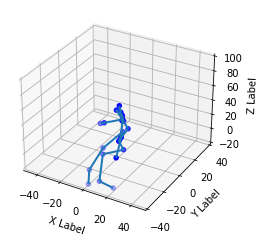

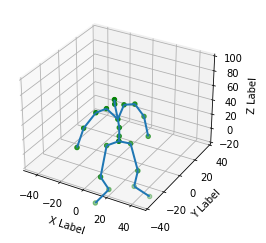

Epoch :  45
Batch : 0, Discriminator loss: 5.150432116352022e-06, Generator loss : 31.63007354736328
Batch : 25, Discriminator loss: 0.0026152487844228745, Generator loss : 45.59215545654297
Batch : 50, Discriminator loss: 1.982336470973678e-06, Generator loss : 44.93595886230469
Batch : 75, Discriminator loss: 5.393721380642091e-07, Generator loss : 31.63922119140625
Batch : 100, Discriminator loss: 6.578564352821559e-05, Generator loss : 43.027565002441406
Epoch 45 complete, cumulated Discriminator loss : 0.11481166630983353, cumulated Generator loss : 3311.58837890625


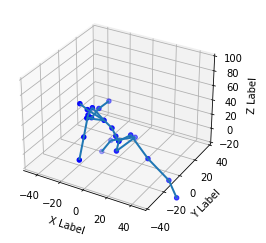

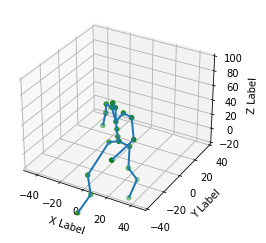

Epoch :  46
Batch : 0, Discriminator loss: 9.79679825832136e-05, Generator loss : 30.40579605102539
Batch : 25, Discriminator loss: 4.579099186230451e-05, Generator loss : 31.073591232299805
Batch : 50, Discriminator loss: 2.4526034394511953e-05, Generator loss : 26.616153717041016
Batch : 75, Discriminator loss: 7.513444143114612e-05, Generator loss : 21.59526824951172
Batch : 100, Discriminator loss: 0.0013029302936047316, Generator loss : 28.283193588256836
Epoch 46 complete, cumulated Discriminator loss : 0.09674371033906937, cumulated Generator loss : 3145.330322265625


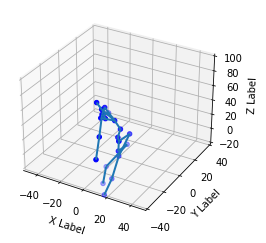

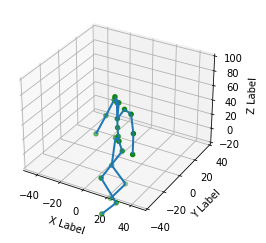

Epoch :  47
Batch : 0, Discriminator loss: 3.179069244652055e-05, Generator loss : 46.21100616455078
Batch : 25, Discriminator loss: 8.806324331089854e-06, Generator loss : 22.65046501159668
Batch : 50, Discriminator loss: 9.92785226117121e-06, Generator loss : 22.47989273071289
Batch : 75, Discriminator loss: 2.128876258211676e-05, Generator loss : 31.613121032714844
Batch : 100, Discriminator loss: 2.1585165086435154e-06, Generator loss : 25.29267120361328
Epoch 47 complete, cumulated Discriminator loss : 0.12439309060573578, cumulated Generator loss : 3140.232421875


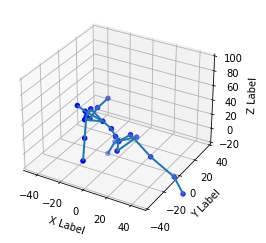

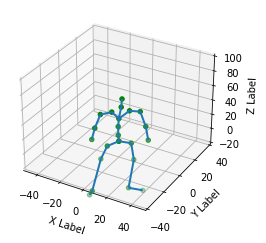

Epoch :  48
Batch : 0, Discriminator loss: 3.918919537682086e-05, Generator loss : 18.362794876098633
Batch : 25, Discriminator loss: 6.240392394829541e-05, Generator loss : 21.908098220825195
Batch : 50, Discriminator loss: 4.521780283539556e-06, Generator loss : 27.8385066986084
Batch : 75, Discriminator loss: 1.807199623726774e-05, Generator loss : 19.14853286743164
Batch : 100, Discriminator loss: 1.6229452057814342e-06, Generator loss : 22.521455764770508
Epoch 48 complete, cumulated Discriminator loss : 0.10178612917661667, cumulated Generator loss : 3033.235107421875


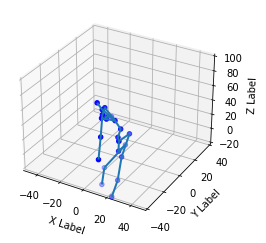

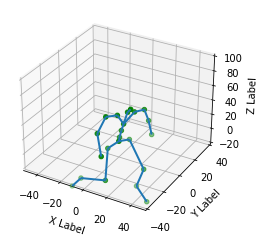

Epoch :  49
Batch : 0, Discriminator loss: 0.017783887684345245, Generator loss : 43.59772491455078
Batch : 25, Discriminator loss: 1.1289715985185467e-05, Generator loss : 18.86618423461914
Batch : 50, Discriminator loss: 0.0013158147921785712, Generator loss : 19.28905487060547
Batch : 75, Discriminator loss: 8.71314769028686e-05, Generator loss : 22.584144592285156
Batch : 100, Discriminator loss: 0.00019352872914168984, Generator loss : 19.99286651611328
Epoch 49 complete, cumulated Discriminator loss : 0.17840439081192017, cumulated Generator loss : 2937.092529296875


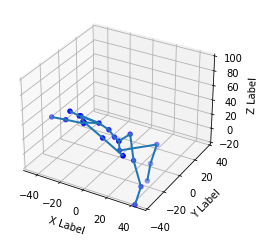

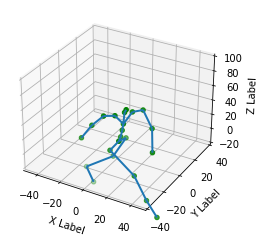

Epoch :  50
Batch : 0, Discriminator loss: 1.6035095541155897e-05, Generator loss : 18.66210174560547
Batch : 25, Discriminator loss: 0.0007774072582833469, Generator loss : 18.317663192749023
Batch : 50, Discriminator loss: 9.928879080689512e-06, Generator loss : 16.394128799438477
Batch : 75, Discriminator loss: 0.00021295147598721087, Generator loss : 31.445796966552734
Batch : 100, Discriminator loss: 9.127979865297675e-05, Generator loss : 42.55445861816406
Epoch 50 complete, cumulated Discriminator loss : 0.11704970896244049, cumulated Generator loss : 2912.34130859375


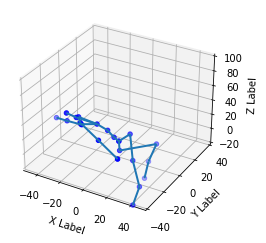

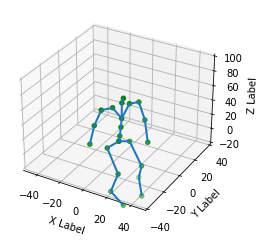

Epoch :  51
Batch : 0, Discriminator loss: 3.175483288941905e-05, Generator loss : 33.38678741455078
Batch : 25, Discriminator loss: 0.0012221994111314416, Generator loss : 20.951433181762695
Batch : 50, Discriminator loss: 0.01278865896165371, Generator loss : 25.62507438659668
Batch : 75, Discriminator loss: 0.0004999486845918, Generator loss : 29.184247970581055
Batch : 100, Discriminator loss: 8.241602699854411e-06, Generator loss : 15.818954467773438
Epoch 51 complete, cumulated Discriminator loss : 0.1414739340543747, cumulated Generator loss : 2847.76708984375


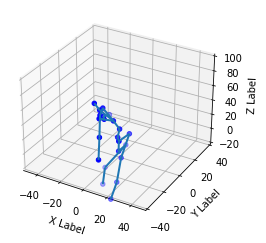

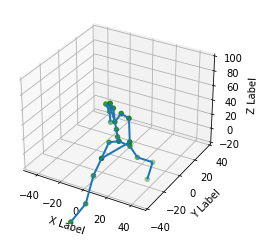

Epoch :  52
Batch : 0, Discriminator loss: 1.1660381460387725e-05, Generator loss : 25.13260841369629
Batch : 25, Discriminator loss: 0.0004132493631914258, Generator loss : 26.818151473999023
Batch : 50, Discriminator loss: 8.234939014073461e-05, Generator loss : 38.93739700317383
Batch : 75, Discriminator loss: 5.209403752814978e-06, Generator loss : 32.955162048339844
Batch : 100, Discriminator loss: 0.009456856176257133, Generator loss : 16.29833984375
Epoch 52 complete, cumulated Discriminator loss : 0.4844481348991394, cumulated Generator loss : 2771.273193359375


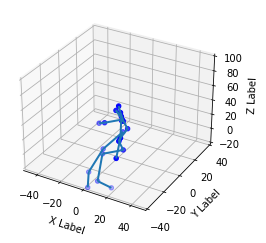

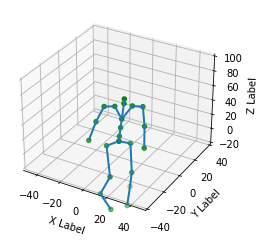

Epoch :  53
Batch : 0, Discriminator loss: 7.236528745124815e-06, Generator loss : 29.429231643676758
Batch : 25, Discriminator loss: 6.808886246290058e-05, Generator loss : 35.23794937133789
Batch : 50, Discriminator loss: 0.00022222664847504348, Generator loss : 33.159698486328125
Batch : 75, Discriminator loss: 9.107479854719713e-06, Generator loss : 28.469436645507812
Batch : 100, Discriminator loss: 1.723973582556937e-05, Generator loss : 24.992124557495117
Epoch 53 complete, cumulated Discriminator loss : 0.17571480572223663, cumulated Generator loss : 2704.81494140625


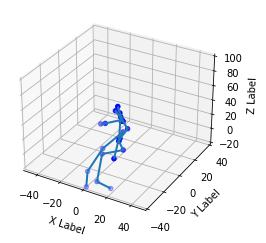

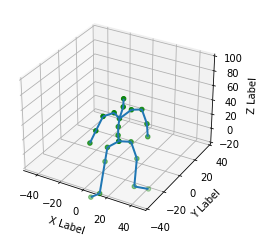

Epoch :  54
Batch : 0, Discriminator loss: 1.2142303603468463e-05, Generator loss : 20.005107879638672
Batch : 25, Discriminator loss: 1.8319660739507526e-05, Generator loss : 26.049360275268555
Batch : 50, Discriminator loss: 0.00017475665663369, Generator loss : 14.968779563903809
Batch : 75, Discriminator loss: 3.032788981727208e-06, Generator loss : 29.325210571289062
Batch : 100, Discriminator loss: 7.987335993675515e-05, Generator loss : 22.587936401367188
Epoch 54 complete, cumulated Discriminator loss : 0.08502637594938278, cumulated Generator loss : 2679.28369140625


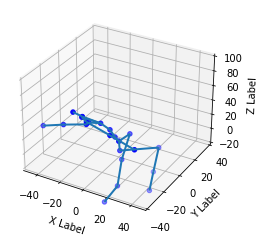

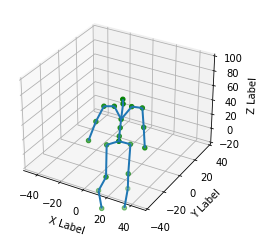

Epoch :  55
Batch : 0, Discriminator loss: 5.695720119547332e-06, Generator loss : 28.33980941772461
Batch : 25, Discriminator loss: 4.6544490032829344e-05, Generator loss : 19.472599029541016
Batch : 50, Discriminator loss: 7.88535107858479e-05, Generator loss : 13.874558448791504
Batch : 75, Discriminator loss: 6.184063749969937e-06, Generator loss : 18.11693572998047
Batch : 100, Discriminator loss: 0.002111870562657714, Generator loss : 23.118623733520508
Epoch 55 complete, cumulated Discriminator loss : 0.046141233295202255, cumulated Generator loss : 2614.57373046875


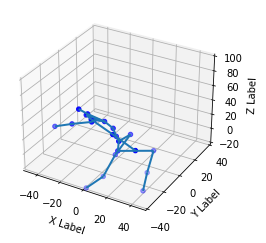

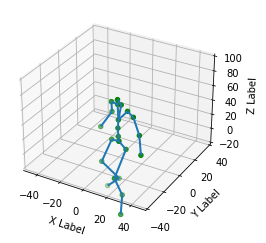

Epoch :  56
Batch : 0, Discriminator loss: 4.3208474380662665e-06, Generator loss : 24.73956871032715
Batch : 25, Discriminator loss: 2.1535384803428315e-05, Generator loss : 24.87603759765625
Batch : 50, Discriminator loss: 4.781547318088997e-07, Generator loss : 28.42043685913086
Batch : 75, Discriminator loss: 5.937138485023752e-05, Generator loss : 16.566919326782227
Batch : 100, Discriminator loss: 3.848674168693833e-06, Generator loss : 24.447711944580078
Epoch 56 complete, cumulated Discriminator loss : 0.047513581812381744, cumulated Generator loss : 2565.196533203125


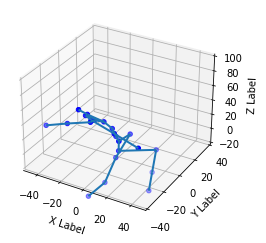

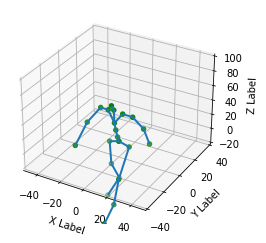

Epoch :  57
Batch : 0, Discriminator loss: 3.0117549613351002e-05, Generator loss : 15.575240135192871
Batch : 25, Discriminator loss: 9.645219506637659e-06, Generator loss : 18.31599998474121
Batch : 50, Discriminator loss: 0.002216803375631571, Generator loss : 33.46189498901367
Batch : 75, Discriminator loss: 1.4910598338246928e-06, Generator loss : 15.664610862731934
Batch : 100, Discriminator loss: 5.35055619366176e-07, Generator loss : 20.34952163696289
Epoch 57 complete, cumulated Discriminator loss : 0.03936797380447388, cumulated Generator loss : 2512.957763671875


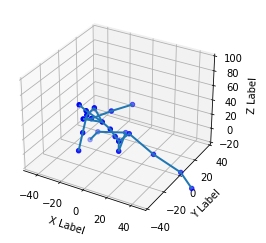

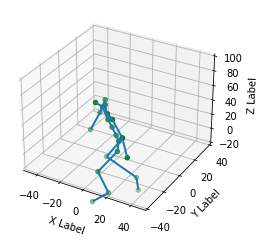

Epoch :  58
Batch : 0, Discriminator loss: 0.0007306857733055949, Generator loss : 25.895572662353516
Batch : 25, Discriminator loss: 2.379326724621933e-05, Generator loss : 25.97755241394043
Batch : 50, Discriminator loss: 0.001824740320444107, Generator loss : 47.360286712646484
Batch : 75, Discriminator loss: 1.2750446330755949e-05, Generator loss : 20.535255432128906
Batch : 100, Discriminator loss: 0.0003385020245332271, Generator loss : 31.615692138671875
Epoch 58 complete, cumulated Discriminator loss : 0.06392934173345566, cumulated Generator loss : 2466.2294921875


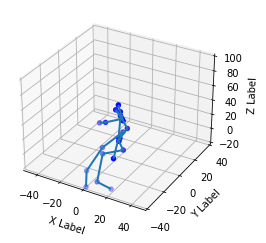

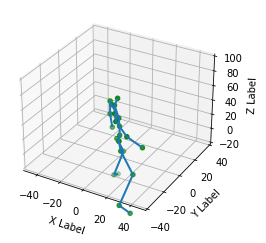

Epoch :  59
Batch : 0, Discriminator loss: 3.07529899146175e-06, Generator loss : 19.283809661865234
Batch : 25, Discriminator loss: 4.3336716771591455e-05, Generator loss : 37.10979080200195
Batch : 50, Discriminator loss: 4.955390977556817e-06, Generator loss : 16.567169189453125
Batch : 75, Discriminator loss: 2.5984968488046434e-06, Generator loss : 17.332801818847656
Batch : 100, Discriminator loss: 4.884718237008201e-06, Generator loss : 22.81120491027832
Epoch 59 complete, cumulated Discriminator loss : 0.18717919290065765, cumulated Generator loss : 2333.107666015625


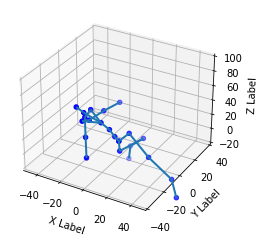

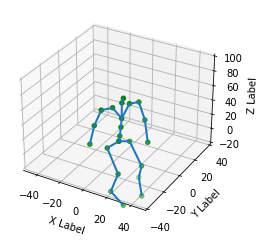

Epoch :  60
Batch : 0, Discriminator loss: 0.03358568996191025, Generator loss : 44.59077835083008
Batch : 25, Discriminator loss: 3.816404387180228e-06, Generator loss : 26.71157455444336
Batch : 50, Discriminator loss: 7.172399818955455e-06, Generator loss : 21.36393928527832
Batch : 75, Discriminator loss: 7.210913736344082e-06, Generator loss : 25.135265350341797
Batch : 100, Discriminator loss: 1.8326938516111113e-05, Generator loss : 21.4656982421875
Epoch 60 complete, cumulated Discriminator loss : 0.16410329937934875, cumulated Generator loss : 2285.113525390625


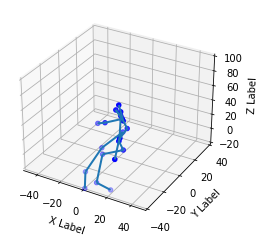

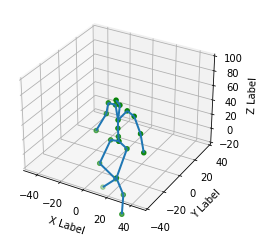

Epoch :  61
Batch : 0, Discriminator loss: 0.0029093774501234293, Generator loss : 16.87291145324707
Batch : 25, Discriminator loss: 2.1532323444262147e-05, Generator loss : 26.399463653564453
Batch : 50, Discriminator loss: 2.6376319510745816e-06, Generator loss : 18.483139038085938
Batch : 75, Discriminator loss: 1.0843921245395904e-06, Generator loss : 28.987651824951172
Batch : 100, Discriminator loss: 8.030698154470883e-06, Generator loss : 19.772985458374023
Epoch 61 complete, cumulated Discriminator loss : 0.10106173902750015, cumulated Generator loss : 2194.91357421875


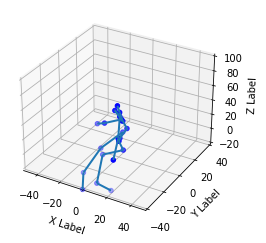

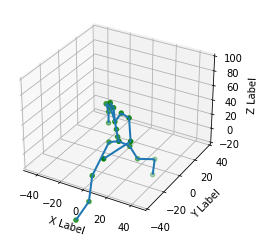

Epoch :  62
Batch : 0, Discriminator loss: 4.3000011373806046e-07, Generator loss : 16.093029022216797
Batch : 25, Discriminator loss: 5.80933119636029e-05, Generator loss : 19.667659759521484
Batch : 50, Discriminator loss: 1.4047980585019104e-05, Generator loss : 24.329315185546875
Batch : 75, Discriminator loss: 2.0788604615518125e-06, Generator loss : 10.207210540771484
Batch : 100, Discriminator loss: 6.664884608653665e-07, Generator loss : 17.081811904907227
Epoch 62 complete, cumulated Discriminator loss : 0.01927056349813938, cumulated Generator loss : 2124.927734375


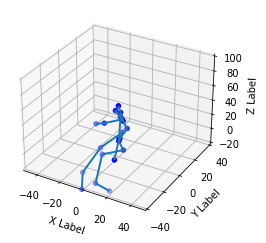

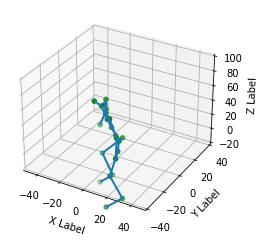

Epoch :  63
Batch : 0, Discriminator loss: 4.845322564506205e-06, Generator loss : 15.289769172668457
Batch : 25, Discriminator loss: 2.9871393962821458e-06, Generator loss : 16.83311653137207
Batch : 50, Discriminator loss: 6.672371091553941e-05, Generator loss : 19.166276931762695
Batch : 75, Discriminator loss: 4.764743550822459e-07, Generator loss : 22.799501419067383
Batch : 100, Discriminator loss: 1.0323314199922606e-05, Generator loss : 16.867048263549805
Epoch 63 complete, cumulated Discriminator loss : 0.10785746574401855, cumulated Generator loss : 2107.10595703125


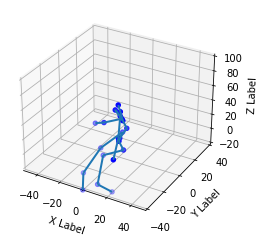

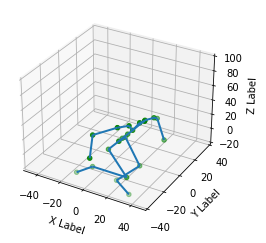

Epoch :  64
Batch : 0, Discriminator loss: 0.00012682647502515465, Generator loss : 20.21683692932129
Batch : 25, Discriminator loss: 5.005537786928471e-06, Generator loss : 19.579208374023438
Batch : 50, Discriminator loss: 4.274718605756789e-07, Generator loss : 13.099526405334473
Batch : 75, Discriminator loss: 1.0235056834062561e-05, Generator loss : 16.709754943847656
Batch : 100, Discriminator loss: 1.6836684153531678e-06, Generator loss : 18.128477096557617
Epoch 64 complete, cumulated Discriminator loss : 0.09057563543319702, cumulated Generator loss : 2000.3333740234375


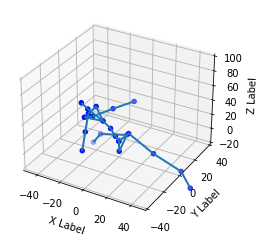

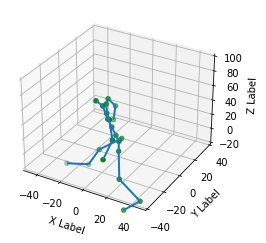

Epoch :  65
Batch : 0, Discriminator loss: 0.0005945421289652586, Generator loss : 16.68245506286621
Batch : 25, Discriminator loss: 8.256030241682311e-07, Generator loss : 10.061336517333984
Batch : 50, Discriminator loss: 2.4288665372296236e-06, Generator loss : 23.29759979248047
Batch : 75, Discriminator loss: 0.0015710184816271067, Generator loss : 18.853328704833984
Batch : 100, Discriminator loss: 3.0091736334725283e-05, Generator loss : 12.047102928161621
Epoch 65 complete, cumulated Discriminator loss : 0.25961998105049133, cumulated Generator loss : 1969.5048828125


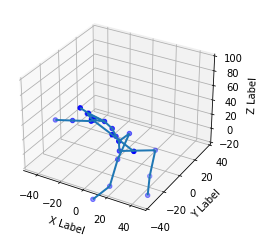

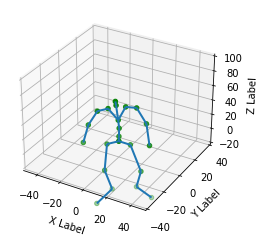

Epoch :  66
Batch : 0, Discriminator loss: 1.0273331554344622e-06, Generator loss : 16.62837791442871
Batch : 25, Discriminator loss: 0.0001154174460680224, Generator loss : 22.54115104675293
Batch : 50, Discriminator loss: 1.7368835187880904e-06, Generator loss : 39.065425872802734
Batch : 75, Discriminator loss: 0.0006964215426705778, Generator loss : 15.963701248168945
Batch : 100, Discriminator loss: 0.002140515251085162, Generator loss : 19.88900375366211
Epoch 66 complete, cumulated Discriminator loss : 0.08108589053153992, cumulated Generator loss : 1907.3406982421875


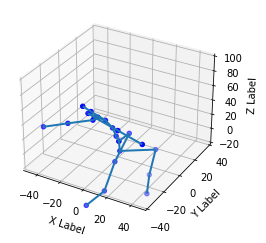

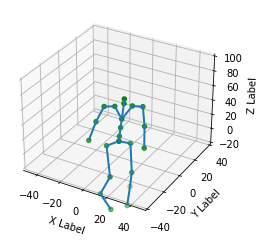

Epoch :  67
Batch : 0, Discriminator loss: 1.2478716371333576e-06, Generator loss : 23.031723022460938
Batch : 25, Discriminator loss: 8.331013668794185e-05, Generator loss : 19.843961715698242
Batch : 50, Discriminator loss: 1.7965216102311388e-05, Generator loss : 14.01453685760498
Batch : 75, Discriminator loss: 3.417244442971423e-05, Generator loss : 17.927759170532227
Batch : 100, Discriminator loss: 2.0303871224314207e-06, Generator loss : 14.03930377960205
Epoch 67 complete, cumulated Discriminator loss : 0.04848826304078102, cumulated Generator loss : 1875.2022705078125


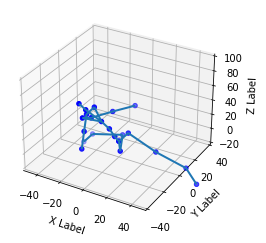

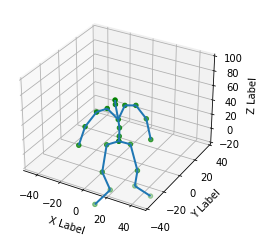

Epoch :  68
Batch : 0, Discriminator loss: 2.9158669349271804e-05, Generator loss : 13.864858627319336
Batch : 25, Discriminator loss: 5.092691139907402e-07, Generator loss : 11.986629486083984
Batch : 50, Discriminator loss: 8.431460400970536e-07, Generator loss : 10.382068634033203
Batch : 75, Discriminator loss: 4.1884754864440765e-06, Generator loss : 11.998249053955078
Batch : 100, Discriminator loss: 2.495180979167344e-06, Generator loss : 33.00580978393555
Epoch 68 complete, cumulated Discriminator loss : 0.013644066639244556, cumulated Generator loss : 1819.3363037109375


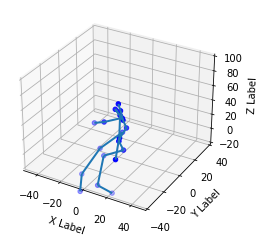

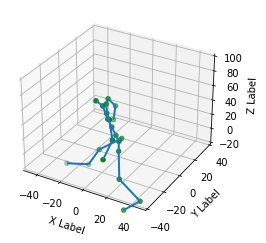

Epoch :  69
Batch : 0, Discriminator loss: 1.4108670143286872e-07, Generator loss : 16.67364501953125
Batch : 25, Discriminator loss: 5.64416905035614e-06, Generator loss : 15.053878784179688
Batch : 50, Discriminator loss: 2.4116937424878415e-07, Generator loss : 13.257680892944336
Batch : 75, Discriminator loss: 4.434302525169187e-07, Generator loss : 11.922528266906738
Batch : 100, Discriminator loss: 4.021981658297591e-05, Generator loss : 19.588172912597656
Epoch 69 complete, cumulated Discriminator loss : 0.09855664521455765, cumulated Generator loss : 1731.4332275390625


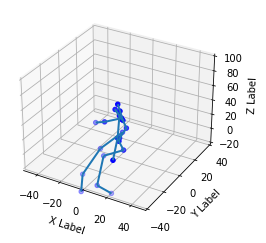

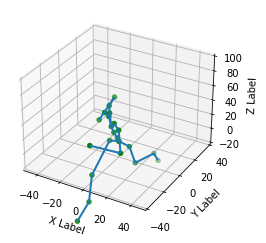

Epoch :  70
Batch : 0, Discriminator loss: 8.862512913765386e-06, Generator loss : 11.790424346923828
Batch : 25, Discriminator loss: 6.166677053442982e-07, Generator loss : 12.676074981689453
Batch : 50, Discriminator loss: 8.09326593298465e-07, Generator loss : 12.680904388427734
Batch : 75, Discriminator loss: 7.403541530948132e-06, Generator loss : 11.295247077941895
Batch : 100, Discriminator loss: 9.31745489651803e-06, Generator loss : 11.982495307922363
Epoch 70 complete, cumulated Discriminator loss : 0.027295274659991264, cumulated Generator loss : 1744.700439453125


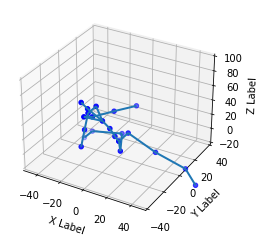

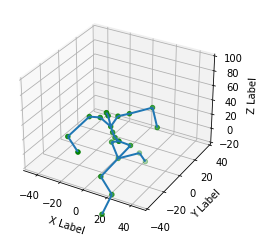

Epoch :  71
Batch : 0, Discriminator loss: 1.2382347449602094e-06, Generator loss : 15.790657997131348
Batch : 25, Discriminator loss: 3.7451941352628637e-06, Generator loss : 9.750372886657715
Batch : 50, Discriminator loss: 7.056855793052819e-07, Generator loss : 13.923684120178223
Batch : 75, Discriminator loss: 0.00203637033700943, Generator loss : 23.66633415222168
Batch : 100, Discriminator loss: 2.816771484503988e-06, Generator loss : 13.43421745300293
Epoch 71 complete, cumulated Discriminator loss : 0.04204435646533966, cumulated Generator loss : 1668.966796875


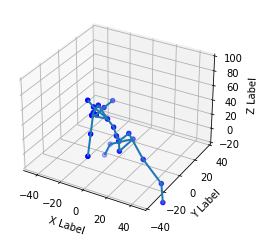

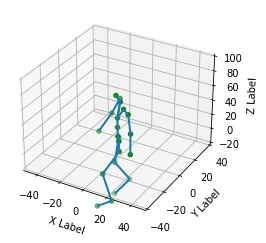

Epoch :  72
Batch : 0, Discriminator loss: 3.0802581818534236e-07, Generator loss : 11.62695598602295
Batch : 25, Discriminator loss: 2.842838512151502e-05, Generator loss : 15.638912200927734
Batch : 50, Discriminator loss: 4.175644335191464e-06, Generator loss : 9.992018699645996
Batch : 75, Discriminator loss: 9.127934958996775e-07, Generator loss : 12.601031303405762
Batch : 100, Discriminator loss: 0.00016338563000317663, Generator loss : 14.28565502166748
Epoch 72 complete, cumulated Discriminator loss : 0.2217872142791748, cumulated Generator loss : 1629.5330810546875


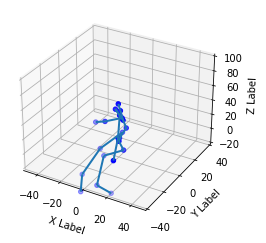

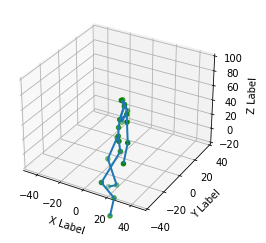

Epoch :  73
Batch : 0, Discriminator loss: 0.0001269055501325056, Generator loss : 11.127890586853027
Batch : 25, Discriminator loss: 8.051400754993665e-07, Generator loss : 14.160638809204102
Batch : 50, Discriminator loss: 4.47822060323233e-07, Generator loss : 13.100197792053223
Batch : 75, Discriminator loss: 6.93236943334341e-05, Generator loss : 11.079869270324707
Batch : 100, Discriminator loss: 9.301889804191887e-06, Generator loss : 15.871949195861816
Epoch 73 complete, cumulated Discriminator loss : 0.16608214378356934, cumulated Generator loss : 1638.4500732421875


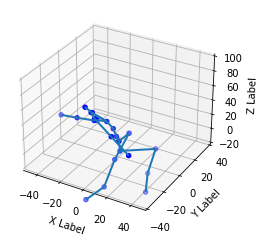

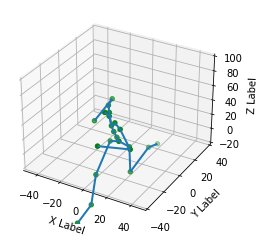

Epoch :  74
Batch : 0, Discriminator loss: 2.8933338853676105e-06, Generator loss : 17.18984031677246
Batch : 25, Discriminator loss: 4.941994484397583e-05, Generator loss : 15.539204597473145
Batch : 50, Discriminator loss: 0.0009866802720353007, Generator loss : 11.703944206237793
Batch : 75, Discriminator loss: 2.81005810620627e-07, Generator loss : 11.757156372070312
Batch : 100, Discriminator loss: 0.00016745548055041581, Generator loss : 10.641698837280273
Epoch 74 complete, cumulated Discriminator loss : 0.027747876942157745, cumulated Generator loss : 1563.8133544921875


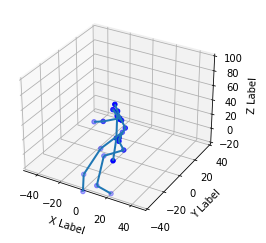

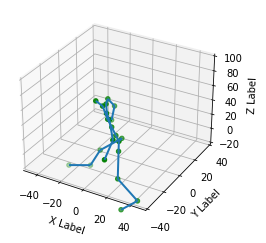

Epoch :  75
Batch : 0, Discriminator loss: 1.1954249202972278e-05, Generator loss : 16.455825805664062
Batch : 25, Discriminator loss: 2.519607505746535e-06, Generator loss : 12.413207054138184
Batch : 50, Discriminator loss: 6.973417043809604e-07, Generator loss : 16.250614166259766
Batch : 75, Discriminator loss: 0.0012831364292651415, Generator loss : 23.30018424987793
Batch : 100, Discriminator loss: 1.0334877515560947e-05, Generator loss : 11.789155960083008
Epoch 75 complete, cumulated Discriminator loss : 0.016550425440073013, cumulated Generator loss : 1568.1845703125


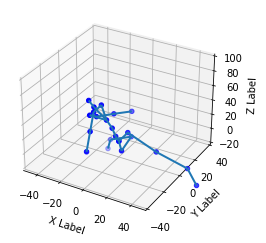

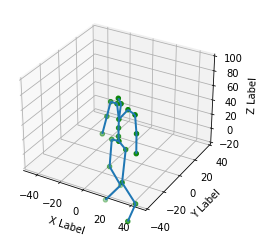

Epoch :  76
Batch : 0, Discriminator loss: 0.0008568066987209022, Generator loss : 12.50346565246582
Batch : 25, Discriminator loss: 1.207172499562148e-05, Generator loss : 9.682646751403809
Batch : 50, Discriminator loss: 1.387196152791148e-05, Generator loss : 9.724552154541016
Batch : 75, Discriminator loss: 0.0015682635130360723, Generator loss : 10.668855667114258
Batch : 100, Discriminator loss: 6.559084340551635e-06, Generator loss : 11.567367553710938
Epoch 76 complete, cumulated Discriminator loss : 0.014028281904757023, cumulated Generator loss : 1535.5242919921875


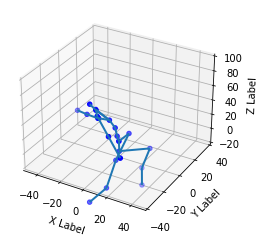

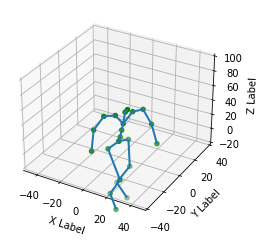

Epoch :  77
Batch : 0, Discriminator loss: 0.00010551377636147663, Generator loss : 20.514835357666016
Batch : 25, Discriminator loss: 1.911034996737726e-05, Generator loss : 16.217464447021484
Batch : 50, Discriminator loss: 4.839806138079439e-07, Generator loss : 16.703012466430664
Batch : 75, Discriminator loss: 5.010465429222677e-06, Generator loss : 13.054234504699707
Batch : 100, Discriminator loss: 0.00015898309356998652, Generator loss : 18.846981048583984
Epoch 77 complete, cumulated Discriminator loss : 0.005344754084944725, cumulated Generator loss : 1551.1610107421875


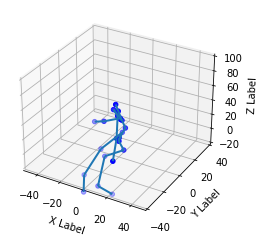

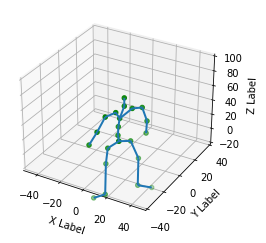

Epoch :  78
Batch : 0, Discriminator loss: 2.22584617404209e-06, Generator loss : 11.532670021057129
Batch : 25, Discriminator loss: 0.0014708054950460792, Generator loss : 11.877599716186523
Batch : 50, Discriminator loss: 0.00010460835619596764, Generator loss : 12.668025016784668
Batch : 75, Discriminator loss: 4.329137937020278e-06, Generator loss : 12.43838119506836
Batch : 100, Discriminator loss: 2.9356557206483558e-05, Generator loss : 19.245738983154297
Epoch 78 complete, cumulated Discriminator loss : 0.017302263528108597, cumulated Generator loss : 1545.286865234375


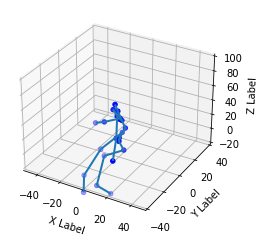

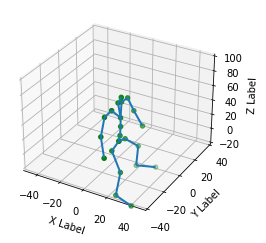

Epoch :  79
Batch : 0, Discriminator loss: 1.866769525804557e-05, Generator loss : 8.338627815246582
Batch : 25, Discriminator loss: 3.670138539746404e-05, Generator loss : 11.701935768127441
Batch : 50, Discriminator loss: 1.104647799365921e-05, Generator loss : 14.46771240234375
Batch : 75, Discriminator loss: 5.856290954397991e-07, Generator loss : 12.370585441589355
Batch : 100, Discriminator loss: 1.3829473743953713e-07, Generator loss : 9.06132984161377
Epoch 79 complete, cumulated Discriminator loss : 0.2419685572385788, cumulated Generator loss : 1448.881103515625


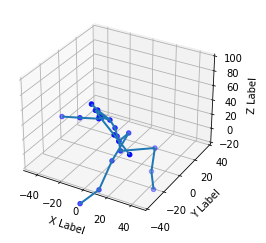

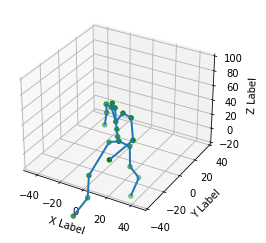

Epoch :  80
Batch : 0, Discriminator loss: 2.755423338385299e-06, Generator loss : 10.510062217712402
Batch : 25, Discriminator loss: 1.005926719699346e-06, Generator loss : 13.930042266845703
Batch : 50, Discriminator loss: 9.879836682102905e-08, Generator loss : 18.49990463256836
Batch : 75, Discriminator loss: 2.6944354658553493e-07, Generator loss : 10.238750457763672
Batch : 100, Discriminator loss: 0.00052715337369591, Generator loss : 15.788725852966309
Epoch 80 complete, cumulated Discriminator loss : 0.06745599955320358, cumulated Generator loss : 1465.0201416015625


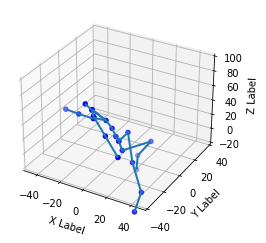

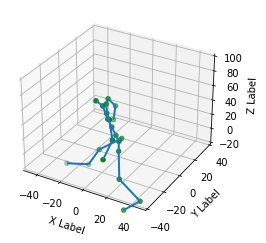

Epoch :  81
Batch : 0, Discriminator loss: 1.7527148088447575e-07, Generator loss : 13.675287246704102
Batch : 25, Discriminator loss: 2.893480814236682e-05, Generator loss : 12.245640754699707
Batch : 50, Discriminator loss: 2.6510917905397946e-07, Generator loss : 9.959291458129883
Batch : 75, Discriminator loss: 1.895301647891756e-05, Generator loss : 15.917342185974121
Batch : 100, Discriminator loss: 0.00010632906196406111, Generator loss : 17.14027976989746
Epoch 81 complete, cumulated Discriminator loss : 0.005343151278793812, cumulated Generator loss : 1459.011474609375


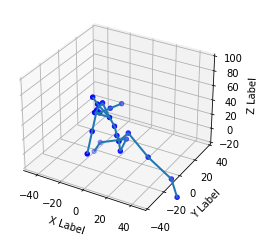

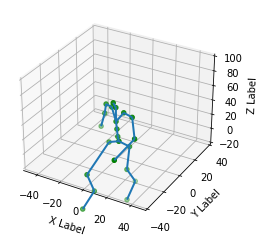

Epoch :  82
Batch : 0, Discriminator loss: 0.0074195037595927715, Generator loss : 16.188745498657227
Batch : 25, Discriminator loss: 7.017610187176615e-06, Generator loss : 12.426806449890137
Batch : 50, Discriminator loss: 1.8762528952720459e-06, Generator loss : 10.69991683959961
Batch : 75, Discriminator loss: 7.170309800130781e-06, Generator loss : 7.333843231201172
Batch : 100, Discriminator loss: 0.002749747596681118, Generator loss : 9.608838081359863
Epoch 82 complete, cumulated Discriminator loss : 0.053167253732681274, cumulated Generator loss : 1382.143798828125


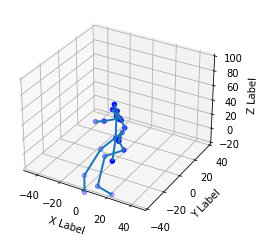

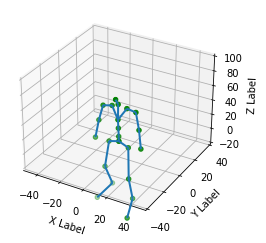

Epoch :  83
Batch : 0, Discriminator loss: 2.6365873054601252e-05, Generator loss : 14.90131950378418
Batch : 25, Discriminator loss: 3.0952874112699647e-06, Generator loss : 14.410218238830566
Batch : 50, Discriminator loss: 2.451395630487241e-05, Generator loss : 9.208380699157715
Batch : 75, Discriminator loss: 6.386384825418645e-07, Generator loss : 10.326245307922363
Batch : 100, Discriminator loss: 7.211442039078975e-07, Generator loss : 9.467999458312988
Epoch 83 complete, cumulated Discriminator loss : 0.03656940162181854, cumulated Generator loss : 1378.7147216796875


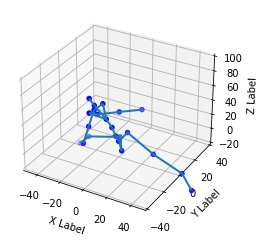

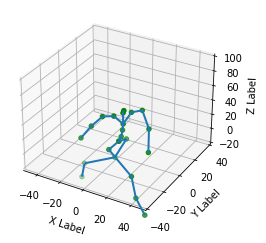

Epoch :  84
Batch : 0, Discriminator loss: 2.276636450915248e-06, Generator loss : 13.64451789855957
Batch : 25, Discriminator loss: 8.666054895911657e-07, Generator loss : 12.279367446899414
Batch : 50, Discriminator loss: 8.716612001080648e-07, Generator loss : 6.928757190704346
Batch : 75, Discriminator loss: 6.737684998370241e-06, Generator loss : 10.16507339477539
Batch : 100, Discriminator loss: 1.6044613175836275e-06, Generator loss : 10.159457206726074
Epoch 84 complete, cumulated Discriminator loss : 0.009867825545370579, cumulated Generator loss : 1364.026611328125


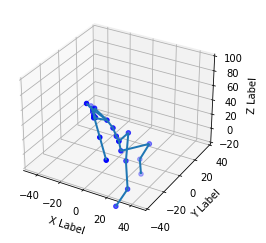

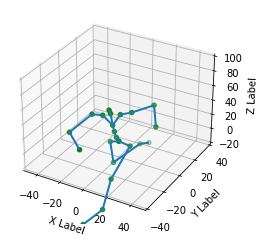

Epoch :  85
Batch : 0, Discriminator loss: 1.4967491779316333e-07, Generator loss : 10.289022445678711
Batch : 25, Discriminator loss: 0.00012781417171936482, Generator loss : 11.178491592407227
Batch : 50, Discriminator loss: 2.6291670565115055e-06, Generator loss : 8.735586166381836
Batch : 75, Discriminator loss: 0.00033100880682468414, Generator loss : 33.70752716064453
Batch : 100, Discriminator loss: 2.334770942979958e-05, Generator loss : 17.698638916015625
Epoch 85 complete, cumulated Discriminator loss : 0.2855193018913269, cumulated Generator loss : 1377.69140625


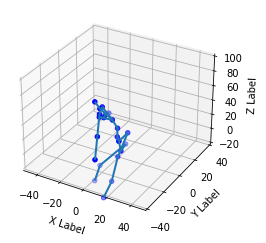

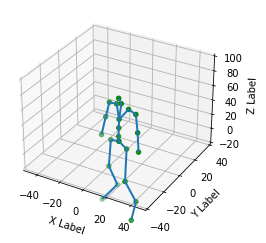

Epoch :  86
Batch : 0, Discriminator loss: 2.7445217710919678e-05, Generator loss : 25.960012435913086
Batch : 25, Discriminator loss: 1.388890495945816e-06, Generator loss : 13.041903495788574
Batch : 50, Discriminator loss: 0.0007889489643275738, Generator loss : 9.85033130645752
Batch : 75, Discriminator loss: 5.828061148349661e-06, Generator loss : 13.803057670593262
Batch : 100, Discriminator loss: 2.9753609851468354e-06, Generator loss : 9.668638229370117
Epoch 86 complete, cumulated Discriminator loss : 0.10711897164583206, cumulated Generator loss : 1405.865966796875


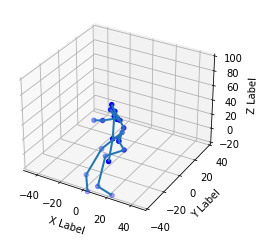

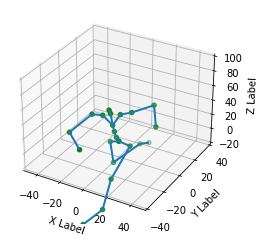

Epoch :  87
Batch : 0, Discriminator loss: 4.334956975071691e-05, Generator loss : 13.998979568481445
Batch : 25, Discriminator loss: 0.0002155697875423357, Generator loss : 15.42166805267334
Batch : 50, Discriminator loss: 5.323949153535068e-06, Generator loss : 10.854825973510742
Batch : 75, Discriminator loss: 3.6158920124762517e-07, Generator loss : 9.982024192810059
Batch : 100, Discriminator loss: 5.081963900011033e-05, Generator loss : 13.034008026123047
Epoch 87 complete, cumulated Discriminator loss : 0.03586043789982796, cumulated Generator loss : 1375.3304443359375


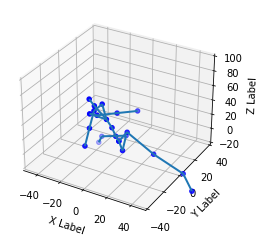

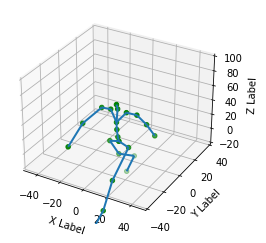

Epoch :  88
Batch : 0, Discriminator loss: 5.039672714701737e-07, Generator loss : 14.138318061828613
Batch : 25, Discriminator loss: 1.5413837900268845e-05, Generator loss : 14.548222541809082
Batch : 50, Discriminator loss: 7.210072112684429e-07, Generator loss : 10.026422500610352
Batch : 75, Discriminator loss: 3.650995950010838e-06, Generator loss : 10.184459686279297
Batch : 100, Discriminator loss: 2.802149083436234e-06, Generator loss : 7.539554119110107
Epoch 88 complete, cumulated Discriminator loss : 0.03972262144088745, cumulated Generator loss : 1318.6441650390625


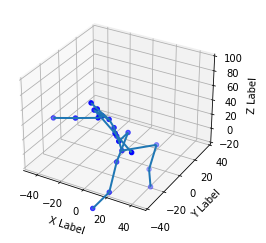

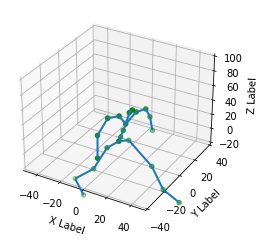

Epoch :  89
Batch : 0, Discriminator loss: 1.8481607185094617e-05, Generator loss : 8.84830379486084
Batch : 25, Discriminator loss: 6.550673248284511e-08, Generator loss : 7.579234600067139
Batch : 50, Discriminator loss: 3.989177002949873e-06, Generator loss : 9.444637298583984
Batch : 75, Discriminator loss: 1.0212232155026868e-05, Generator loss : 11.101496696472168
Batch : 100, Discriminator loss: 5.4158736020326614e-05, Generator loss : 14.322930335998535
Epoch 89 complete, cumulated Discriminator loss : 0.1641407608985901, cumulated Generator loss : 1265.5452880859375


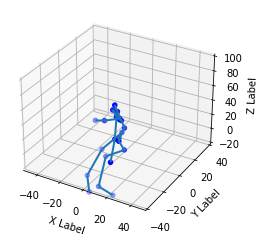

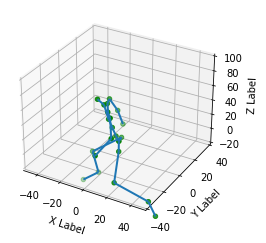

Epoch :  90
Batch : 0, Discriminator loss: 6.232362181890494e-08, Generator loss : 10.689952850341797
Batch : 25, Discriminator loss: 0.026552502065896988, Generator loss : 12.012374877929688
Batch : 50, Discriminator loss: 0.0001153807679656893, Generator loss : 14.350956916809082
Batch : 75, Discriminator loss: 5.801580300612841e-07, Generator loss : 11.264547348022461
Batch : 100, Discriminator loss: 2.2892452761880122e-05, Generator loss : 11.491840362548828
Epoch 90 complete, cumulated Discriminator loss : 0.06123052537441254, cumulated Generator loss : 1361.378173828125


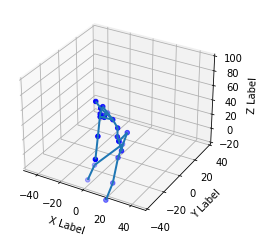

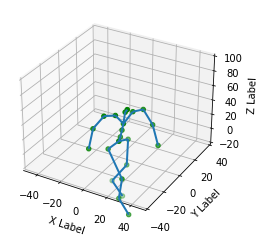

Epoch :  91
Batch : 0, Discriminator loss: 6.098395033404813e-07, Generator loss : 8.886045455932617
Batch : 25, Discriminator loss: 8.480243423036882e-07, Generator loss : 11.563371658325195
Batch : 50, Discriminator loss: 4.34703724749852e-06, Generator loss : 13.255363464355469
Batch : 75, Discriminator loss: 5.601376429353877e-08, Generator loss : 9.018839836120605
Batch : 100, Discriminator loss: 1.178353699060608e-07, Generator loss : 7.008713245391846
Epoch 91 complete, cumulated Discriminator loss : 0.022454382851719856, cumulated Generator loss : 1229.023193359375


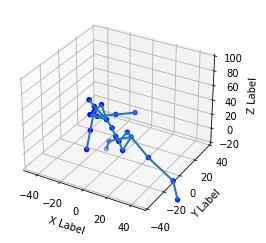

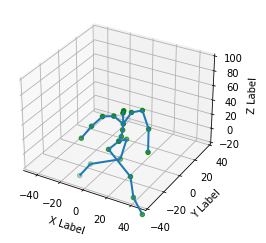

Epoch :  92
Batch : 0, Discriminator loss: 6.428635401789506e-07, Generator loss : 16.35770606994629
Batch : 25, Discriminator loss: 1.202736712002661e-06, Generator loss : 8.602348327636719
Batch : 50, Discriminator loss: 2.096644493576605e-05, Generator loss : 7.351302623748779
Batch : 75, Discriminator loss: 6.492291049653431e-06, Generator loss : 6.294907093048096
Batch : 100, Discriminator loss: 2.2998568738330505e-07, Generator loss : 15.363336563110352
Epoch 92 complete, cumulated Discriminator loss : 0.04283032566308975, cumulated Generator loss : 1210.669677734375


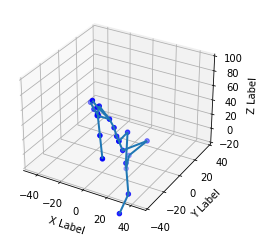

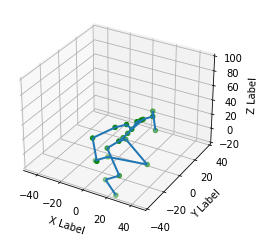

Epoch :  93
Batch : 0, Discriminator loss: 1.19388835173595e-06, Generator loss : 13.405158996582031
Batch : 25, Discriminator loss: 2.8836956289524096e-07, Generator loss : 10.668648719787598
Batch : 50, Discriminator loss: 2.7567261895455886e-06, Generator loss : 9.115570068359375
Batch : 75, Discriminator loss: 2.1137498862344728e-08, Generator loss : 9.232892990112305
Batch : 100, Discriminator loss: 2.6928725560537714e-07, Generator loss : 12.061999320983887
Epoch 93 complete, cumulated Discriminator loss : 0.01887931302189827, cumulated Generator loss : 1218.316650390625


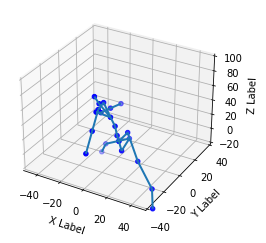

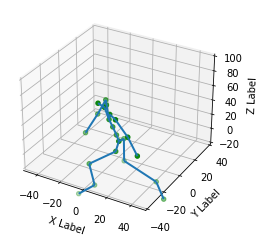

Epoch :  94
Batch : 0, Discriminator loss: 5.238544417807134e-06, Generator loss : 10.919767379760742
Batch : 25, Discriminator loss: 1.3151247912901454e-06, Generator loss : 9.457792282104492
Batch : 50, Discriminator loss: 2.2662824505914614e-07, Generator loss : 12.818482398986816
Batch : 75, Discriminator loss: 0.0003208841080777347, Generator loss : 10.126972198486328
Batch : 100, Discriminator loss: 2.7841102223646885e-07, Generator loss : 9.975014686584473
Epoch 94 complete, cumulated Discriminator loss : 0.02161294035613537, cumulated Generator loss : 1162.9931640625


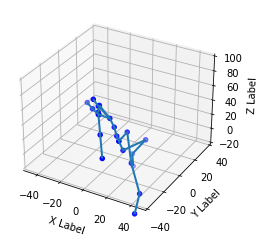

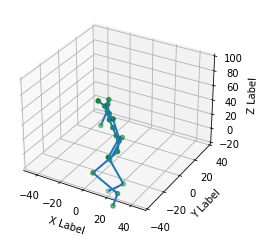

Epoch :  95
Batch : 0, Discriminator loss: 3.1324868814408546e-06, Generator loss : 16.10308074951172
Batch : 25, Discriminator loss: 3.2626189749862533e-07, Generator loss : 12.58215618133545
Batch : 50, Discriminator loss: 0.000308815244352445, Generator loss : 10.07710075378418
Batch : 75, Discriminator loss: 3.9292481233133e-06, Generator loss : 10.671873092651367
Batch : 100, Discriminator loss: 5.434691274786019e-07, Generator loss : 9.510909080505371
Epoch 95 complete, cumulated Discriminator loss : 0.31434303522109985, cumulated Generator loss : 1222.2825927734375


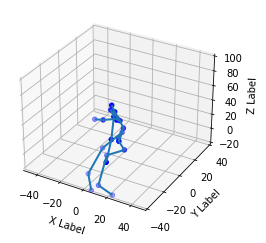

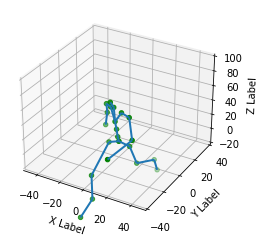

Epoch :  96
Batch : 0, Discriminator loss: 9.141255219446975e-08, Generator loss : 6.922098159790039
Batch : 25, Discriminator loss: 2.1942914827377535e-05, Generator loss : 9.990767478942871
Batch : 50, Discriminator loss: 1.0960832696582656e-05, Generator loss : 6.93241024017334
Batch : 75, Discriminator loss: 1.2331959453604213e-07, Generator loss : 7.478740215301514
Batch : 100, Discriminator loss: 5.7593395467847586e-05, Generator loss : 9.677183151245117
Epoch 96 complete, cumulated Discriminator loss : 0.16710373759269714, cumulated Generator loss : 1193.8792724609375


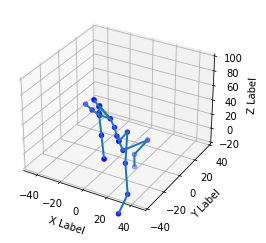

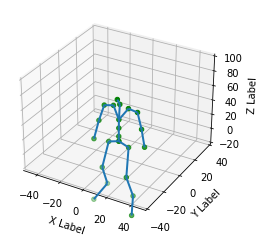

Epoch :  97
Batch : 0, Discriminator loss: 2.8246927286090795e-06, Generator loss : 9.135603904724121
Batch : 25, Discriminator loss: 1.5006347098278638e-07, Generator loss : 8.646623611450195
Batch : 50, Discriminator loss: 5.732670729230449e-07, Generator loss : 12.134590148925781
Batch : 75, Discriminator loss: 0.00012511987006291747, Generator loss : 8.761442184448242
Batch : 100, Discriminator loss: 7.973791070980951e-06, Generator loss : 12.589999198913574
Epoch 97 complete, cumulated Discriminator loss : 0.5900282859802246, cumulated Generator loss : 1162.0654296875


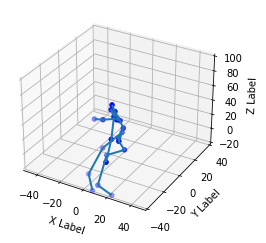

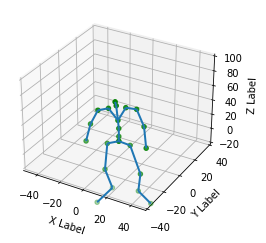

Epoch :  98
Batch : 0, Discriminator loss: 5.047606828156859e-05, Generator loss : 9.916428565979004
Batch : 25, Discriminator loss: 2.0752921045641415e-05, Generator loss : 16.427236557006836
Batch : 50, Discriminator loss: 4.34724007902787e-08, Generator loss : 13.542391777038574
Batch : 75, Discriminator loss: 1.8576884031062946e-05, Generator loss : 8.32966423034668
Batch : 100, Discriminator loss: 0.00032781314803287387, Generator loss : 6.408322334289551
Epoch 98 complete, cumulated Discriminator loss : 0.014356859028339386, cumulated Generator loss : 1141.74755859375


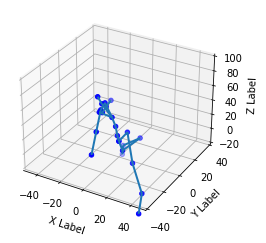

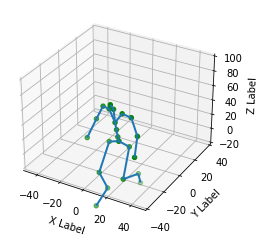

Epoch :  99
Batch : 0, Discriminator loss: 2.5841694650807767e-07, Generator loss : 8.617622375488281
Batch : 25, Discriminator loss: 7.496823286601284e-07, Generator loss : 7.26111364364624
Batch : 50, Discriminator loss: 7.98645578470314e-06, Generator loss : 10.372597694396973
Batch : 75, Discriminator loss: 1.32585382743855e-05, Generator loss : 11.544858932495117
Batch : 100, Discriminator loss: 1.3784163854779763e-07, Generator loss : 9.572013854980469
Epoch 99 complete, cumulated Discriminator loss : 0.026287756860256195, cumulated Generator loss : 1115.686767578125


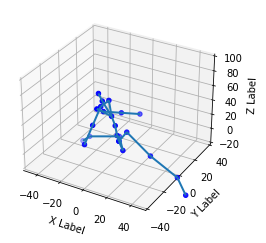

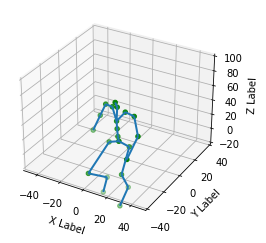

Epoch :  100
Batch : 0, Discriminator loss: 6.004863098496571e-05, Generator loss : 13.254253387451172
Batch : 25, Discriminator loss: 1.4757223652850371e-05, Generator loss : 10.961926460266113
Batch : 50, Discriminator loss: 7.342637786678097e-08, Generator loss : 19.880212783813477
Batch : 75, Discriminator loss: 1.540480809580913e-07, Generator loss : 12.361519813537598
Batch : 100, Discriminator loss: 0.00024798381491564214, Generator loss : 10.931783676147461
Epoch 100 complete, cumulated Discriminator loss : 0.010353237390518188, cumulated Generator loss : 1153.64404296875


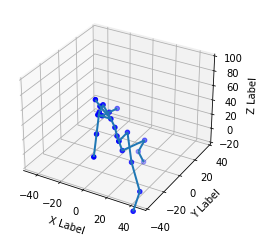

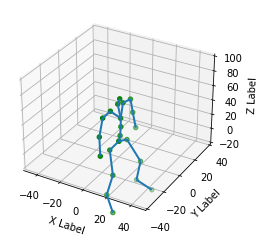

Epoch :  101
Batch : 0, Discriminator loss: 1.5660588132959674e-06, Generator loss : 6.662439346313477
Batch : 25, Discriminator loss: 2.6302694095647894e-05, Generator loss : 9.190632820129395
Batch : 50, Discriminator loss: 1.9825913113891147e-05, Generator loss : 7.538240909576416
Batch : 75, Discriminator loss: 2.229431288469641e-07, Generator loss : 8.748026847839355
Batch : 100, Discriminator loss: 5.83963337703608e-05, Generator loss : 8.011280059814453
Epoch 101 complete, cumulated Discriminator loss : 0.13232363760471344, cumulated Generator loss : 1108.501220703125


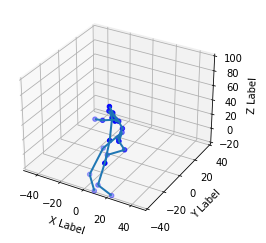

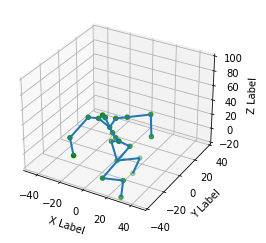

Epoch :  102
Batch : 0, Discriminator loss: 1.785732251846639e-06, Generator loss : 8.670817375183105
Batch : 25, Discriminator loss: 7.215602408905397e-07, Generator loss : 9.043415069580078
Batch : 50, Discriminator loss: 3.8195375964278355e-06, Generator loss : 13.185005187988281
Batch : 75, Discriminator loss: 8.418321158387698e-06, Generator loss : 12.917781829833984
Batch : 100, Discriminator loss: 8.606966002844274e-05, Generator loss : 9.576783180236816
Epoch 102 complete, cumulated Discriminator loss : 0.24899862706661224, cumulated Generator loss : 1173.3131103515625


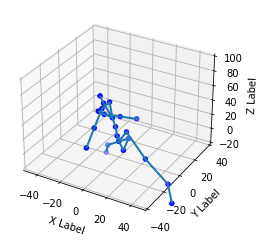

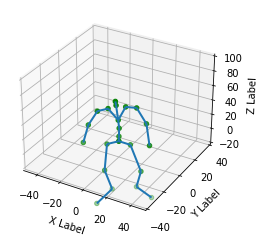

Epoch :  103
Batch : 0, Discriminator loss: 3.0490514291159343e-06, Generator loss : 9.6397123336792
Batch : 25, Discriminator loss: 1.3058622982953239e-07, Generator loss : 9.973111152648926
Batch : 50, Discriminator loss: 1.3233002391643822e-06, Generator loss : 8.1439208984375
Batch : 75, Discriminator loss: 5.227986548561603e-06, Generator loss : 8.146523475646973
Batch : 100, Discriminator loss: 3.2044936233432963e-06, Generator loss : 7.68459939956665
Epoch 103 complete, cumulated Discriminator loss : 0.262630820274353, cumulated Generator loss : 1110.6217041015625


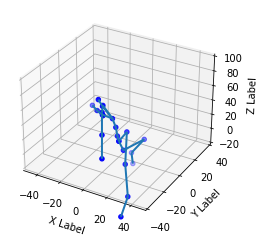

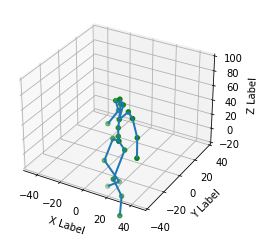

Epoch :  104
Batch : 0, Discriminator loss: 8.929495720622072e-08, Generator loss : 6.8074774742126465
Batch : 25, Discriminator loss: 0.0023854714818298817, Generator loss : 10.359052658081055
Batch : 50, Discriminator loss: 4.715541763289366e-06, Generator loss : 8.5145263671875
Batch : 75, Discriminator loss: 9.509294613962993e-06, Generator loss : 14.912393569946289
Batch : 100, Discriminator loss: 1.9167978848599887e-07, Generator loss : 7.741105556488037
Epoch 104 complete, cumulated Discriminator loss : 0.26633819937705994, cumulated Generator loss : 1129.181884765625


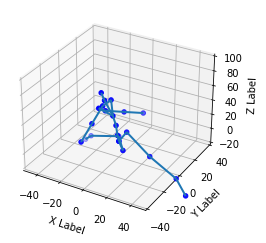

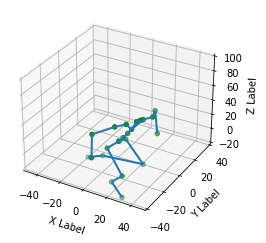

Epoch :  105
Batch : 0, Discriminator loss: 1.0886436939472333e-05, Generator loss : 12.454197883605957
Batch : 25, Discriminator loss: 3.888688127062778e-07, Generator loss : 11.80942153930664
Batch : 50, Discriminator loss: 1.7200426327690366e-07, Generator loss : 6.965786933898926
Batch : 75, Discriminator loss: 1.1084010111517273e-05, Generator loss : 8.334859848022461
Batch : 100, Discriminator loss: 5.121057711221511e-07, Generator loss : 11.726174354553223
Epoch 105 complete, cumulated Discriminator loss : 0.009945820085704327, cumulated Generator loss : 1070.2164306640625


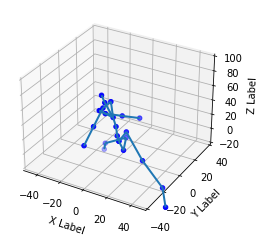

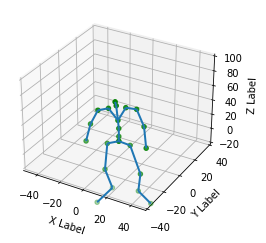

Epoch :  106
Batch : 0, Discriminator loss: 5.053717814007541e-06, Generator loss : 12.047233581542969
Batch : 25, Discriminator loss: 1.6757734556449577e-05, Generator loss : 28.48805046081543
Batch : 50, Discriminator loss: 0.00019113410962745547, Generator loss : 10.012036323547363
Batch : 75, Discriminator loss: 1.569982117644031e-07, Generator loss : 6.177541255950928
Batch : 100, Discriminator loss: 4.0197955968324095e-05, Generator loss : 6.829561233520508
Epoch 106 complete, cumulated Discriminator loss : 0.06688947975635529, cumulated Generator loss : 1022.4115600585938


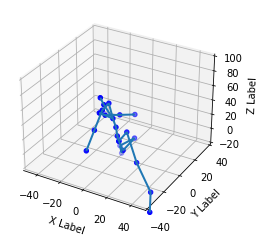

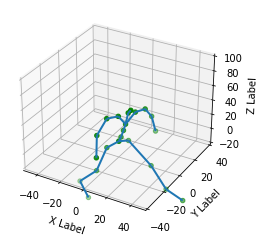

Epoch :  107
Batch : 0, Discriminator loss: 3.4077777399943443e-07, Generator loss : 9.312499046325684
Batch : 25, Discriminator loss: 6.044997746812442e-08, Generator loss : 8.197493553161621
Batch : 50, Discriminator loss: 1.7062833990166837e-07, Generator loss : 5.618015766143799
Batch : 75, Discriminator loss: 1.8540696089530684e-08, Generator loss : 6.438735008239746
Batch : 100, Discriminator loss: 0.0004172138578724116, Generator loss : 8.146405220031738
Epoch 107 complete, cumulated Discriminator loss : 0.013930805027484894, cumulated Generator loss : 1007.0222778320312


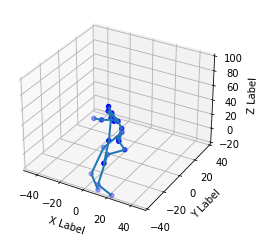

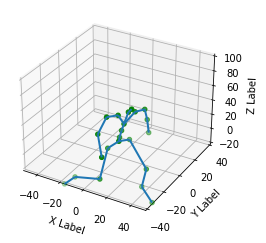

Epoch :  108
Batch : 0, Discriminator loss: 3.5751421023633156e-07, Generator loss : 4.68133020401001
Batch : 25, Discriminator loss: 6.058333838154795e-06, Generator loss : 8.327173233032227
Batch : 50, Discriminator loss: 1.3854040048499883e-07, Generator loss : 7.859398365020752
Batch : 75, Discriminator loss: 7.155813364079222e-07, Generator loss : 10.087971687316895
Batch : 100, Discriminator loss: 0.0005344334058463573, Generator loss : 22.41852378845215
Epoch 108 complete, cumulated Discriminator loss : 0.016260255128145218, cumulated Generator loss : 996.6967163085938


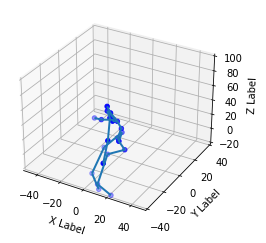

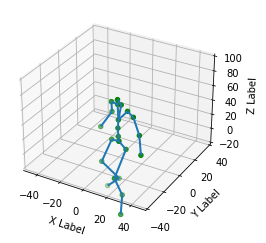

Epoch :  109
Batch : 0, Discriminator loss: 6.256582855712622e-05, Generator loss : 15.88247013092041
Batch : 25, Discriminator loss: 0.0005141961737535894, Generator loss : 7.333528995513916
Batch : 50, Discriminator loss: 7.1359095272782724e-06, Generator loss : 14.221626281738281
Batch : 75, Discriminator loss: 0.00011127229663543403, Generator loss : 7.757026672363281
Batch : 100, Discriminator loss: 3.9098281945371127e-07, Generator loss : 9.887931823730469
Epoch 109 complete, cumulated Discriminator loss : 0.32252898812294006, cumulated Generator loss : 1072.9937744140625


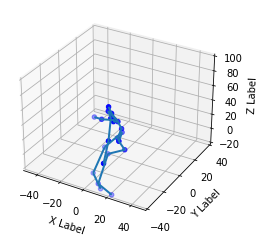

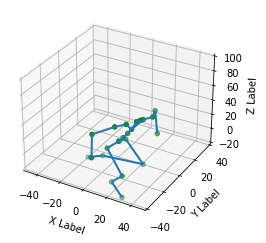

Epoch :  110
Batch : 0, Discriminator loss: 7.608436192185764e-08, Generator loss : 7.272150039672852
Batch : 25, Discriminator loss: 2.8400219889590517e-05, Generator loss : 9.656675338745117
Batch : 50, Discriminator loss: 0.00028039258904755116, Generator loss : 6.941023826599121
Batch : 75, Discriminator loss: 3.743231718544848e-05, Generator loss : 7.3839945793151855
Batch : 100, Discriminator loss: 7.5138391366635915e-06, Generator loss : 7.009764194488525
Epoch 110 complete, cumulated Discriminator loss : 0.00881793163716793, cumulated Generator loss : 996.5289916992188


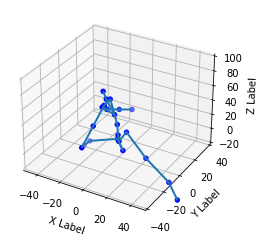

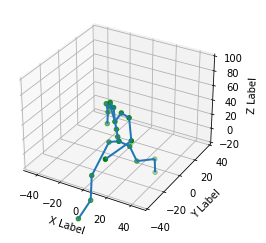

Epoch :  111
Batch : 0, Discriminator loss: 4.55904142881991e-07, Generator loss : 11.057412147521973
Batch : 25, Discriminator loss: 1.3291364098222402e-07, Generator loss : 12.695882797241211
Batch : 50, Discriminator loss: 0.00025494754663668573, Generator loss : 5.476531028747559
Batch : 75, Discriminator loss: 1.930634198288317e-06, Generator loss : 6.891592979431152
Batch : 100, Discriminator loss: 1.8312515237539628e-07, Generator loss : 6.627713203430176
Epoch 111 complete, cumulated Discriminator loss : 0.1993105262517929, cumulated Generator loss : 978.5576171875


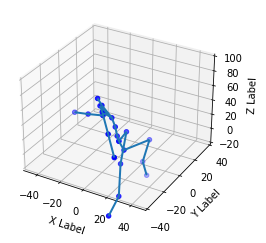

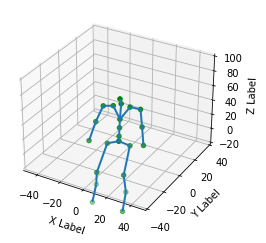

Epoch :  112
Batch : 0, Discriminator loss: 2.1780872430099407e-06, Generator loss : 6.965720176696777
Batch : 25, Discriminator loss: 2.8300269150349777e-06, Generator loss : 12.139262199401855
Batch : 50, Discriminator loss: 1.2035989129799418e-05, Generator loss : 10.369210243225098
Batch : 75, Discriminator loss: 0.00031198852229863405, Generator loss : 8.622420310974121
Batch : 100, Discriminator loss: 2.192064357586787e-06, Generator loss : 7.318108081817627
Epoch 112 complete, cumulated Discriminator loss : 0.12654688954353333, cumulated Generator loss : 985.2174682617188


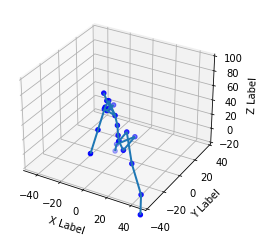

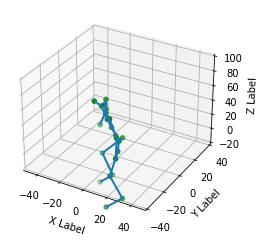

Epoch :  113
Batch : 0, Discriminator loss: 2.3073760075931204e-06, Generator loss : 11.64271068572998
Batch : 25, Discriminator loss: 0.00034489267272874713, Generator loss : 5.927239418029785
Batch : 50, Discriminator loss: 7.431898438881035e-07, Generator loss : 7.835382461547852
Batch : 75, Discriminator loss: 4.4252644215703185e-07, Generator loss : 5.5633392333984375
Batch : 100, Discriminator loss: 6.302508609223878e-06, Generator loss : 10.405144691467285
Epoch 113 complete, cumulated Discriminator loss : 0.010978770442306995, cumulated Generator loss : 927.3041381835938


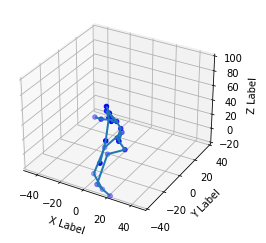

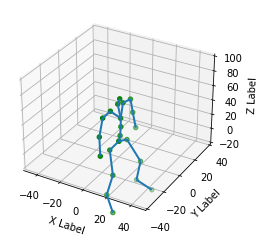

Epoch :  114
Batch : 0, Discriminator loss: 4.227771114528878e-06, Generator loss : 5.524576663970947
Batch : 25, Discriminator loss: 1.751674716388152e-08, Generator loss : 6.0536675453186035
Batch : 50, Discriminator loss: 4.700055342254927e-06, Generator loss : 11.503728866577148
Batch : 75, Discriminator loss: 9.449320259591332e-07, Generator loss : 9.40341854095459
Batch : 100, Discriminator loss: 9.380505048284249e-07, Generator loss : 8.774097442626953
Epoch 114 complete, cumulated Discriminator loss : 0.028584903106093407, cumulated Generator loss : 1009.6661987304688


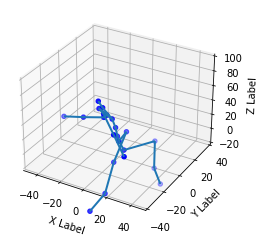

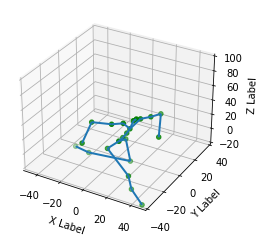

Epoch :  115
Batch : 0, Discriminator loss: 2.2735130187356845e-06, Generator loss : 4.72845983505249
Batch : 25, Discriminator loss: 1.8921463151855278e-06, Generator loss : 7.179172039031982
Batch : 50, Discriminator loss: 6.472372149346484e-08, Generator loss : 6.352169990539551
Batch : 75, Discriminator loss: 6.807913450757042e-07, Generator loss : 9.834489822387695
Batch : 100, Discriminator loss: 6.975418500587693e-07, Generator loss : 13.27645206451416
Epoch 115 complete, cumulated Discriminator loss : 0.0061506060883402824, cumulated Generator loss : 934.6607055664062


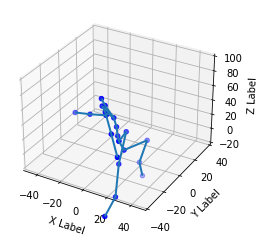

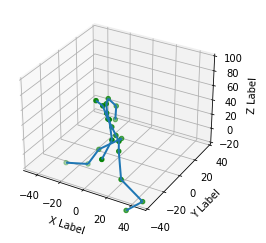

Epoch :  116
Batch : 0, Discriminator loss: 1.0218121133220848e-05, Generator loss : 7.545009136199951
Batch : 25, Discriminator loss: 1.7758222384145483e-05, Generator loss : 12.565025329589844
Batch : 50, Discriminator loss: 6.029547705566074e-08, Generator loss : 8.806151390075684
Batch : 75, Discriminator loss: 3.811776991824445e-07, Generator loss : 7.084597587585449
Batch : 100, Discriminator loss: 7.774831465212628e-05, Generator loss : 8.330066680908203
Epoch 116 complete, cumulated Discriminator loss : 0.13402122259140015, cumulated Generator loss : 965.250732421875


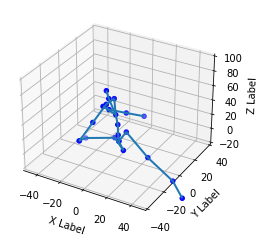

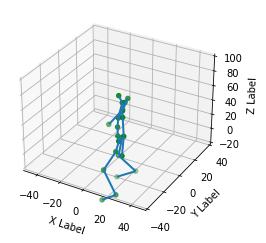

Epoch :  117
Batch : 0, Discriminator loss: 2.2637195229435747e-07, Generator loss : 7.898046970367432
Batch : 25, Discriminator loss: 2.5479141186224297e-05, Generator loss : 6.09630823135376
Batch : 50, Discriminator loss: 6.11606310485513e-07, Generator loss : 5.8646368980407715
Batch : 75, Discriminator loss: 8.292452548630536e-06, Generator loss : 5.571521282196045
Batch : 100, Discriminator loss: 9.92522018350428e-07, Generator loss : 10.656184196472168
Epoch 117 complete, cumulated Discriminator loss : 0.03766646236181259, cumulated Generator loss : 921.05322265625


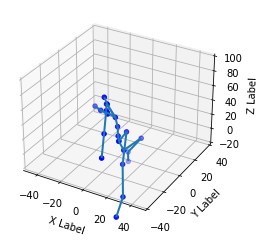

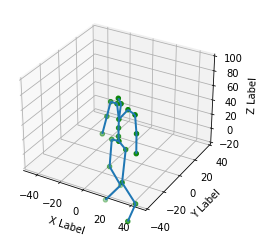

Epoch :  118
Batch : 0, Discriminator loss: 1.917124450301344e-07, Generator loss : 5.184757232666016
Batch : 25, Discriminator loss: 1.9935054297093302e-05, Generator loss : 6.033154487609863
Batch : 50, Discriminator loss: 4.489796992857009e-05, Generator loss : 9.417198181152344
Batch : 75, Discriminator loss: 2.1204561562626623e-05, Generator loss : 7.056839466094971
Batch : 100, Discriminator loss: 5.690536454494577e-06, Generator loss : 11.008707046508789
Epoch 118 complete, cumulated Discriminator loss : 0.009003098122775555, cumulated Generator loss : 901.5143432617188


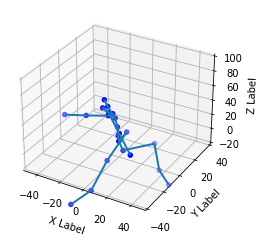

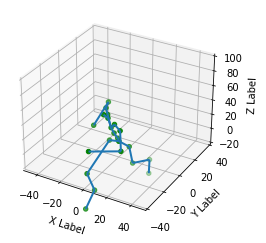

Epoch :  119
Batch : 0, Discriminator loss: 0.0001447469840059057, Generator loss : 8.143045425415039
Batch : 25, Discriminator loss: 5.7718236348591745e-05, Generator loss : 7.689032554626465
Batch : 50, Discriminator loss: 2.3819529815227725e-06, Generator loss : 6.788593769073486
Batch : 75, Discriminator loss: 0.000685328443069011, Generator loss : 13.902031898498535
Batch : 100, Discriminator loss: 6.745996756762906e-07, Generator loss : 6.11586332321167
Epoch 119 complete, cumulated Discriminator loss : 0.017867492511868477, cumulated Generator loss : 908.3761596679688


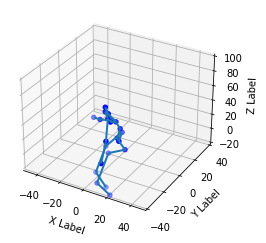

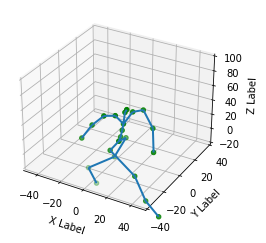

Epoch :  120
Batch : 0, Discriminator loss: 4.8226773685655644e-08, Generator loss : 24.04206657409668
Batch : 25, Discriminator loss: 5.5635773605899885e-06, Generator loss : 7.771515369415283
Batch : 50, Discriminator loss: 2.3094260541256517e-05, Generator loss : 5.860646724700928
Batch : 75, Discriminator loss: 4.497020654525841e-06, Generator loss : 5.710148811340332
Batch : 100, Discriminator loss: 9.384830264025368e-07, Generator loss : 6.8715691566467285
Epoch 120 complete, cumulated Discriminator loss : 0.005610171239823103, cumulated Generator loss : 864.8850708007812


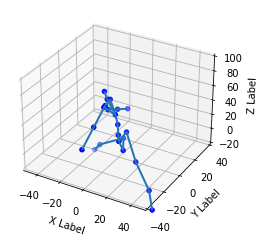

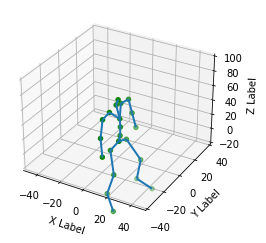

Epoch :  121
Batch : 0, Discriminator loss: 0.000603663909714669, Generator loss : 9.750319480895996
Batch : 25, Discriminator loss: 2.052457404033703e-08, Generator loss : 8.687898635864258
Batch : 50, Discriminator loss: 1.996166247408837e-06, Generator loss : 6.6895751953125
Batch : 75, Discriminator loss: 5.8373618827545215e-08, Generator loss : 4.808778762817383
Batch : 100, Discriminator loss: 4.7428311518160626e-05, Generator loss : 14.481292724609375
Epoch 121 complete, cumulated Discriminator loss : 0.0035726488567888737, cumulated Generator loss : 913.7509765625


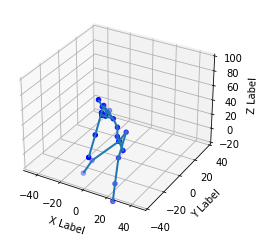

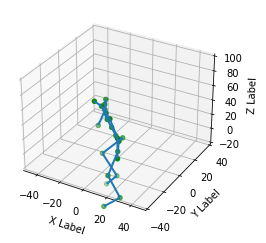

Epoch :  122
Batch : 0, Discriminator loss: 5.232082571637875e-07, Generator loss : 4.494570255279541
Batch : 25, Discriminator loss: 1.4256345821195282e-05, Generator loss : 10.056653022766113
Batch : 50, Discriminator loss: 2.100965957652079e-06, Generator loss : 4.841552257537842
Batch : 75, Discriminator loss: 5.264315404929221e-06, Generator loss : 5.410447597503662
Batch : 100, Discriminator loss: 8.47911678647506e-08, Generator loss : 11.62095832824707
Epoch 122 complete, cumulated Discriminator loss : 0.010047048330307007, cumulated Generator loss : 871.1417846679688


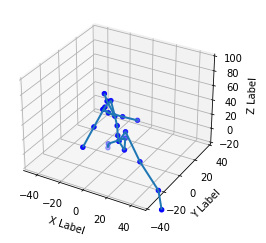

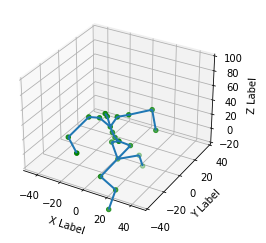

Epoch :  123
Batch : 0, Discriminator loss: 4.7330684083135566e-07, Generator loss : 6.853226184844971
Batch : 25, Discriminator loss: 1.3585314206920884e-07, Generator loss : 14.588780403137207
Batch : 50, Discriminator loss: 4.064034783368697e-06, Generator loss : 7.227510452270508
Batch : 75, Discriminator loss: 1.2808076235160115e-06, Generator loss : 5.944945812225342
Batch : 100, Discriminator loss: 1.2044987443005084e-06, Generator loss : 7.697500705718994
Epoch 123 complete, cumulated Discriminator loss : 0.0212843157351017, cumulated Generator loss : 917.2919311523438


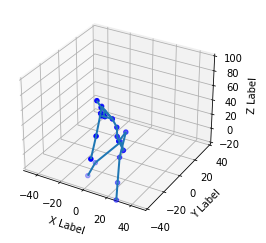

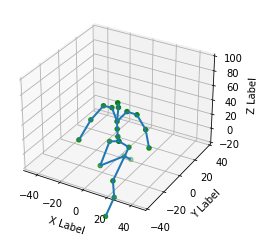

Epoch :  124
Batch : 0, Discriminator loss: 7.856131560401991e-06, Generator loss : 6.145440101623535
Batch : 25, Discriminator loss: 5.036718775386362e-08, Generator loss : 9.689188003540039
Batch : 50, Discriminator loss: 0.0003271712630521506, Generator loss : 5.776143550872803
Batch : 75, Discriminator loss: 2.9623879527207464e-05, Generator loss : 6.897998332977295
Batch : 100, Discriminator loss: 3.519959079767432e-07, Generator loss : 6.293069362640381
Epoch 124 complete, cumulated Discriminator loss : 0.008256975561380386, cumulated Generator loss : 922.24169921875


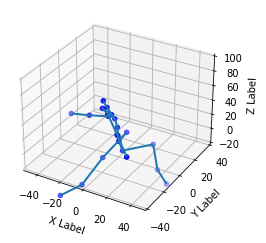

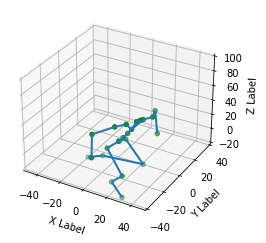

Epoch :  125
Batch : 0, Discriminator loss: 4.467946723707428e-08, Generator loss : 6.271414279937744
Batch : 25, Discriminator loss: 2.0513098206720315e-06, Generator loss : 8.12290096282959
Batch : 50, Discriminator loss: 2.554028014856158e-06, Generator loss : 7.413077354431152
Batch : 75, Discriminator loss: 3.961249817052703e-08, Generator loss : 6.124783039093018
Batch : 100, Discriminator loss: 4.662406922761875e-07, Generator loss : 6.37758207321167
Epoch 125 complete, cumulated Discriminator loss : 0.010082526132464409, cumulated Generator loss : 878.8320922851562


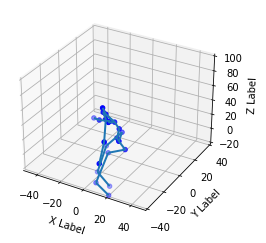

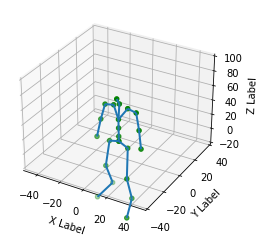

Epoch :  126
Batch : 0, Discriminator loss: 3.156501975354331e-07, Generator loss : 19.905057907104492
Batch : 25, Discriminator loss: 1.936658372869715e-05, Generator loss : 3.954496145248413
Batch : 50, Discriminator loss: 1.5165066542977002e-05, Generator loss : 5.984750747680664
Batch : 75, Discriminator loss: 1.6158128346432932e-06, Generator loss : 7.046502113342285
Batch : 100, Discriminator loss: 1.366075821351842e-06, Generator loss : 9.454383850097656
Epoch 126 complete, cumulated Discriminator loss : 0.012992260046303272, cumulated Generator loss : 900.9707641601562


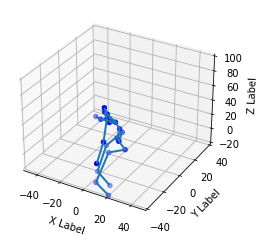

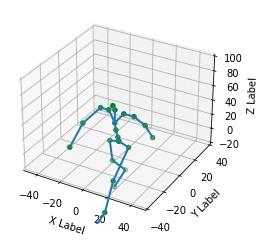

Epoch :  127
Batch : 0, Discriminator loss: 0.000868731178343296, Generator loss : 10.072657585144043
Batch : 25, Discriminator loss: 5.1678234740393236e-05, Generator loss : 33.90104675292969
Batch : 50, Discriminator loss: 6.801042218285147e-08, Generator loss : 6.597678184509277
Batch : 75, Discriminator loss: 1.2569099681059015e-06, Generator loss : 11.256505012512207
Batch : 100, Discriminator loss: 1.4013193094797316e-06, Generator loss : 7.926682949066162
Epoch 127 complete, cumulated Discriminator loss : 0.009342354722321033, cumulated Generator loss : 863.2415771484375


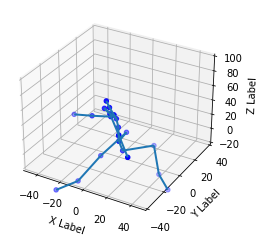

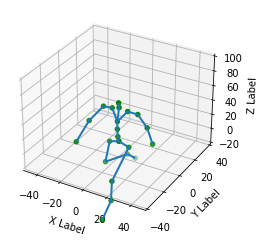

Epoch :  128
Batch : 0, Discriminator loss: 3.0016190066817217e-07, Generator loss : 5.833532810211182
Batch : 25, Discriminator loss: 1.047919795382768e-06, Generator loss : 11.352747917175293
Batch : 50, Discriminator loss: 5.414238330558874e-06, Generator loss : 7.2365827560424805
Batch : 75, Discriminator loss: 6.997534001129679e-07, Generator loss : 6.4575371742248535
Batch : 100, Discriminator loss: 2.244328243250493e-06, Generator loss : 10.849846839904785
Epoch 128 complete, cumulated Discriminator loss : 0.08722245693206787, cumulated Generator loss : 828.3036499023438


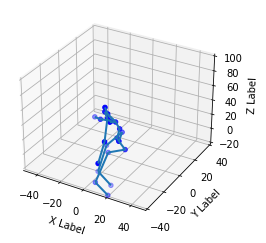

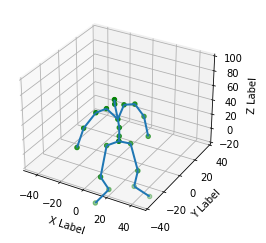

Epoch :  129
Batch : 0, Discriminator loss: 2.1505073277694464e-07, Generator loss : 14.349488258361816
Batch : 25, Discriminator loss: 6.238846026462852e-07, Generator loss : 10.866947174072266
Batch : 50, Discriminator loss: 1.3550092035075068e-06, Generator loss : 11.583572387695312
Batch : 75, Discriminator loss: 1.8682281677229184e-07, Generator loss : 4.862630367279053
Batch : 100, Discriminator loss: 9.59968602387562e-08, Generator loss : 6.730286121368408
Epoch 129 complete, cumulated Discriminator loss : 0.03506562113761902, cumulated Generator loss : 836.4798583984375


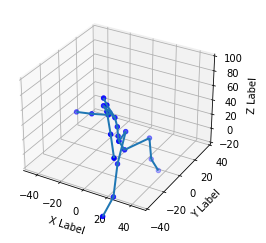

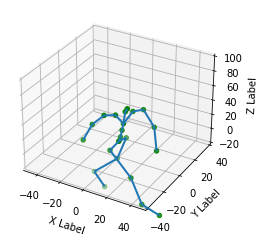

Epoch :  130
Batch : 0, Discriminator loss: 1.2775863979186397e-05, Generator loss : 5.975325107574463
Batch : 25, Discriminator loss: 2.031073563557584e-05, Generator loss : 34.447322845458984
Batch : 50, Discriminator loss: 4.6470226777728385e-08, Generator loss : 5.003088474273682
Batch : 75, Discriminator loss: 0.0001794294366845861, Generator loss : 8.796525955200195
Batch : 100, Discriminator loss: 9.752516234584618e-07, Generator loss : 7.703182220458984
Epoch 130 complete, cumulated Discriminator loss : 0.03808491304516792, cumulated Generator loss : 846.9651489257812


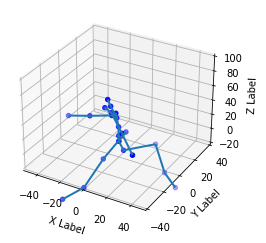

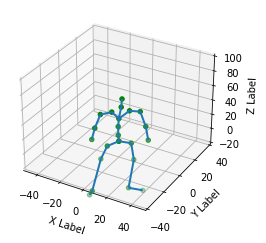

Epoch :  131
Batch : 0, Discriminator loss: 1.5015476151347684e-07, Generator loss : 5.455658912658691
Batch : 25, Discriminator loss: 1.1055560662498465e-06, Generator loss : 6.087611198425293
Batch : 50, Discriminator loss: 0.0001498477504355833, Generator loss : 5.782499313354492
Batch : 75, Discriminator loss: 1.4965729633331648e-06, Generator loss : 7.059626579284668
Batch : 100, Discriminator loss: 3.3317794532194966e-06, Generator loss : 8.497608184814453
Epoch 131 complete, cumulated Discriminator loss : 0.13205371797084808, cumulated Generator loss : 792.1953125


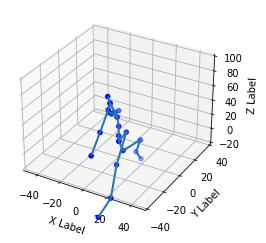

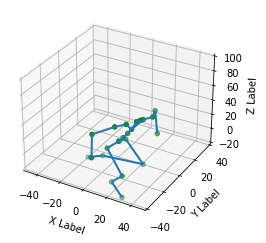

Epoch :  132
Batch : 0, Discriminator loss: 3.770322507534729e-07, Generator loss : 10.025431632995605
Batch : 25, Discriminator loss: 3.070865162158043e-08, Generator loss : 6.692005634307861
Batch : 50, Discriminator loss: 4.061321234871684e-08, Generator loss : 14.956819534301758
Batch : 75, Discriminator loss: 4.198999761229061e-07, Generator loss : 12.445816993713379
Batch : 100, Discriminator loss: 2.5101567047158824e-08, Generator loss : 5.085958003997803
Epoch 132 complete, cumulated Discriminator loss : 0.12254442274570465, cumulated Generator loss : 834.2825927734375


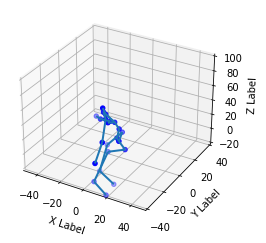

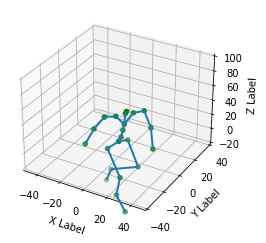

Epoch :  133
Batch : 0, Discriminator loss: 3.858116315313964e-08, Generator loss : 8.1111478805542
Batch : 25, Discriminator loss: 0.00013445017975755036, Generator loss : 5.4521164894104
Batch : 50, Discriminator loss: 1.0791161002998706e-05, Generator loss : 6.686100482940674
Batch : 75, Discriminator loss: 0.00010058446059701964, Generator loss : 6.662932872772217
Batch : 100, Discriminator loss: 0.014136589132249355, Generator loss : 17.67405128479004
Epoch 133 complete, cumulated Discriminator loss : 0.11028055846691132, cumulated Generator loss : 845.9339599609375


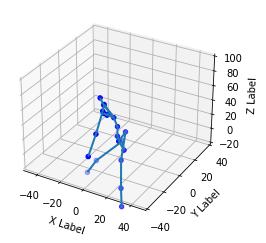

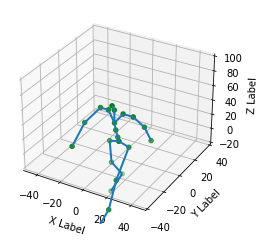

Epoch :  134
Batch : 0, Discriminator loss: 9.178117579722311e-06, Generator loss : 8.217634201049805
Batch : 25, Discriminator loss: 5.806170520372689e-05, Generator loss : 8.969109535217285
Batch : 50, Discriminator loss: 2.6951852305501234e-06, Generator loss : 11.053260803222656
Batch : 75, Discriminator loss: 1.6036383954087796e-07, Generator loss : 5.7918009757995605
Batch : 100, Discriminator loss: 1.248971670975152e-06, Generator loss : 3.2087435722351074
Epoch 134 complete, cumulated Discriminator loss : 0.016564544290304184, cumulated Generator loss : 788.9400634765625


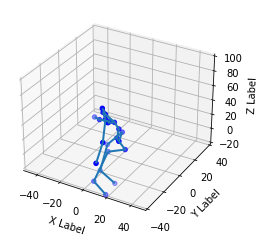

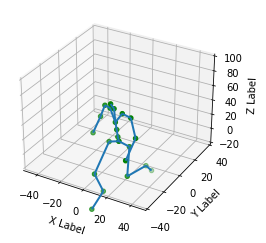

Epoch :  135
Batch : 0, Discriminator loss: 1.7143703701094637e-07, Generator loss : 5.535691738128662
Batch : 25, Discriminator loss: 1.2452885300717753e-07, Generator loss : 7.5583415031433105
Batch : 50, Discriminator loss: 2.1342168565752218e-07, Generator loss : 6.0471601486206055
Batch : 75, Discriminator loss: 6.577384283446008e-06, Generator loss : 5.072905540466309
Batch : 100, Discriminator loss: 0.006183258723467588, Generator loss : 6.030727386474609
Epoch 135 complete, cumulated Discriminator loss : 0.016964485868811607, cumulated Generator loss : 801.0043334960938


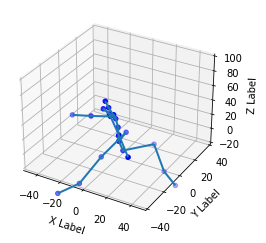

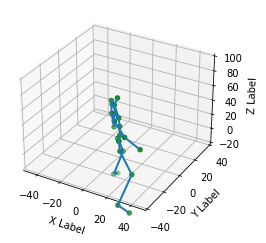

Epoch :  136
Batch : 0, Discriminator loss: 1.6855737783316727e-07, Generator loss : 9.787667274475098
Batch : 25, Discriminator loss: 2.649764428497292e-05, Generator loss : 9.038164138793945
Batch : 50, Discriminator loss: 2.50083212449681e-06, Generator loss : 9.96644115447998
Batch : 75, Discriminator loss: 6.829664926044643e-05, Generator loss : 9.17052936553955
Batch : 100, Discriminator loss: 0.00012320000678300858, Generator loss : 5.068929195404053
Epoch 136 complete, cumulated Discriminator loss : 0.005576838739216328, cumulated Generator loss : 844.3445434570312


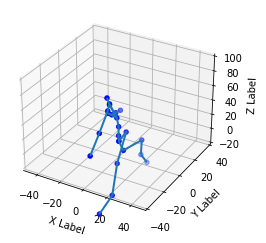

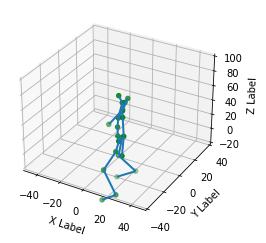

Epoch :  137
Batch : 0, Discriminator loss: 3.058937636524206e-08, Generator loss : 7.236321449279785
Batch : 25, Discriminator loss: 0.00588779803365469, Generator loss : 8.9554443359375
Batch : 50, Discriminator loss: 1.029289614962181e-05, Generator loss : 5.081233978271484
Batch : 75, Discriminator loss: 6.949817907297984e-05, Generator loss : 9.752435684204102
Batch : 100, Discriminator loss: 1.5842169887037016e-06, Generator loss : 5.515599727630615
Epoch 137 complete, cumulated Discriminator loss : 0.013799411244690418, cumulated Generator loss : 781.1502075195312


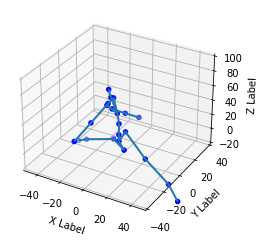

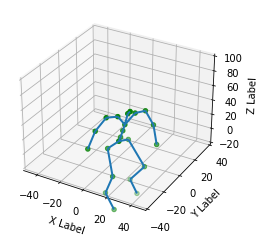

Epoch :  138
Batch : 0, Discriminator loss: 4.277054358681198e-06, Generator loss : 7.552336692810059
Batch : 25, Discriminator loss: 4.9848701166865794e-08, Generator loss : 5.60940408706665
Batch : 50, Discriminator loss: 1.8392627680441365e-05, Generator loss : 10.673158645629883
Batch : 75, Discriminator loss: 3.327351549842206e-08, Generator loss : 10.275469779968262
Batch : 100, Discriminator loss: 1.4161864783091005e-05, Generator loss : 6.151156902313232
Epoch 138 complete, cumulated Discriminator loss : 0.007447549607604742, cumulated Generator loss : 743.7135009765625


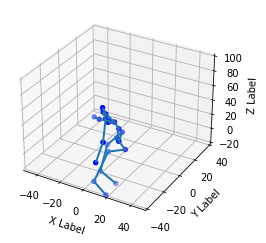

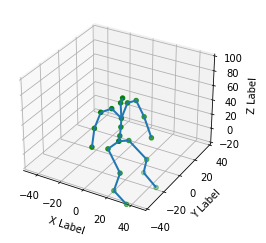

Epoch :  139
Batch : 0, Discriminator loss: 4.999957923246257e-07, Generator loss : 7.753473281860352
Batch : 25, Discriminator loss: 1.3281166388878773e-07, Generator loss : 7.464573383331299
Batch : 50, Discriminator loss: 5.935486768748888e-09, Generator loss : 5.350696563720703
Batch : 75, Discriminator loss: 0.00040997692849487066, Generator loss : 4.41901969909668
Batch : 100, Discriminator loss: 1.4466098946286365e-05, Generator loss : 4.613800525665283
Epoch 139 complete, cumulated Discriminator loss : 0.008385228924453259, cumulated Generator loss : 726.258056640625


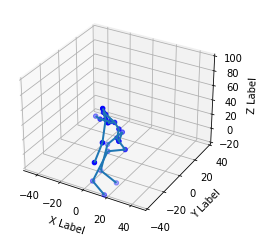

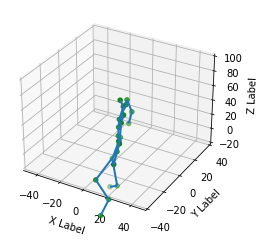

Epoch :  140
Batch : 0, Discriminator loss: 8.75408829870139e-08, Generator loss : 7.622676849365234
Batch : 25, Discriminator loss: 9.671911982422898e-08, Generator loss : 4.9398064613342285
Batch : 50, Discriminator loss: 1.6960256061793189e-06, Generator loss : 4.615084171295166
Batch : 75, Discriminator loss: 1.3831918010964728e-07, Generator loss : 12.969779014587402
Batch : 100, Discriminator loss: 1.5676046132284682e-06, Generator loss : 9.534757614135742
Epoch 140 complete, cumulated Discriminator loss : 0.005046074278652668, cumulated Generator loss : 723.5188598632812


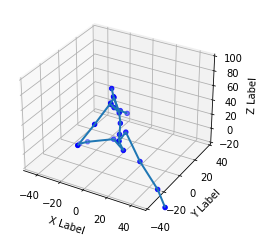

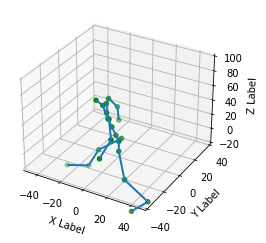

Epoch :  141
Batch : 0, Discriminator loss: 4.241105955316016e-07, Generator loss : 6.04330587387085
Batch : 25, Discriminator loss: 1.9569529285945464e-07, Generator loss : 5.577878952026367
Batch : 50, Discriminator loss: 6.886875212330779e-07, Generator loss : 4.142918109893799
Batch : 75, Discriminator loss: 1.1876091576823455e-07, Generator loss : 6.755858898162842
Batch : 100, Discriminator loss: 1.9571672282836516e-07, Generator loss : 7.858639717102051
Epoch 141 complete, cumulated Discriminator loss : 0.0039070406928658485, cumulated Generator loss : 774.932861328125


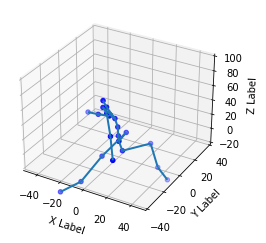

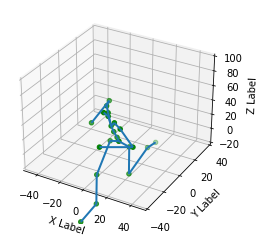

Epoch :  142
Batch : 0, Discriminator loss: 9.911588705335816e-08, Generator loss : 3.614433526992798
Batch : 25, Discriminator loss: 4.3570426555561426e-07, Generator loss : 4.869697093963623
Batch : 50, Discriminator loss: 4.671456963478704e-07, Generator loss : 6.003056049346924
Batch : 75, Discriminator loss: 3.0289469577837735e-05, Generator loss : 5.066504001617432
Batch : 100, Discriminator loss: 2.822627642729003e-08, Generator loss : 3.5383963584899902
Epoch 142 complete, cumulated Discriminator loss : 0.3652852773666382, cumulated Generator loss : 731.5021362304688


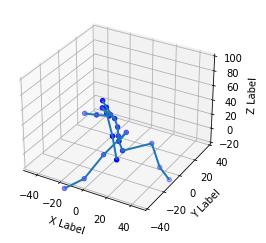

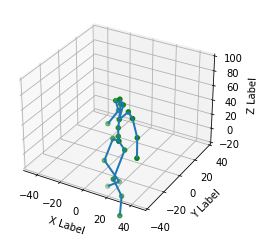

Epoch :  143
Batch : 0, Discriminator loss: 1.7770494196156505e-06, Generator loss : 5.379613399505615
Batch : 25, Discriminator loss: 1.4019782611285336e-05, Generator loss : 6.124030590057373
Batch : 50, Discriminator loss: 2.6002467166108545e-06, Generator loss : 5.503506183624268
Batch : 75, Discriminator loss: 5.841684469487518e-06, Generator loss : 7.971240520477295
Batch : 100, Discriminator loss: 2.0517329630820313e-06, Generator loss : 6.536209583282471
Epoch 143 complete, cumulated Discriminator loss : 0.08830121159553528, cumulated Generator loss : 740.6326293945312


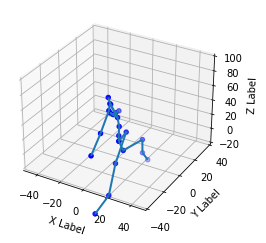

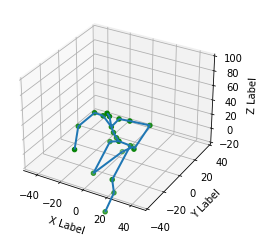

Epoch :  144
Batch : 0, Discriminator loss: 9.957848767783162e-09, Generator loss : 4.042936325073242
Batch : 25, Discriminator loss: 9.389862498210277e-06, Generator loss : 5.8757805824279785
Batch : 50, Discriminator loss: 3.1102795219339896e-06, Generator loss : 4.619320869445801
Batch : 75, Discriminator loss: 4.940710240930457e-08, Generator loss : 9.904683113098145
Batch : 100, Discriminator loss: 5.025564746574673e-07, Generator loss : 9.623196601867676
Epoch 144 complete, cumulated Discriminator loss : 0.0036342074163258076, cumulated Generator loss : 739.409912109375


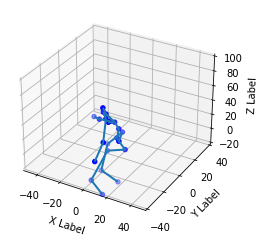

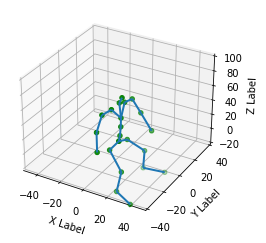

Epoch :  145
Batch : 0, Discriminator loss: 2.1329501578293275e-06, Generator loss : 8.11182975769043
Batch : 25, Discriminator loss: 3.069269212119252e-07, Generator loss : 5.876897811889648
Batch : 50, Discriminator loss: 0.0006212699227035046, Generator loss : 5.80123233795166
Batch : 75, Discriminator loss: 1.6636541033676622e-07, Generator loss : 6.008978366851807
Batch : 100, Discriminator loss: 1.2538844202936161e-06, Generator loss : 7.477676868438721
Epoch 145 complete, cumulated Discriminator loss : 0.019762955605983734, cumulated Generator loss : 699.1273803710938


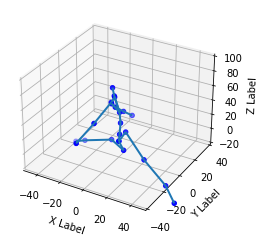

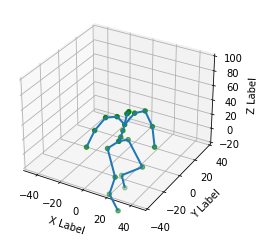

Epoch :  146
Batch : 0, Discriminator loss: 1.2736394694456976e-07, Generator loss : 3.4265270233154297
Batch : 25, Discriminator loss: 1.8718947103479877e-07, Generator loss : 3.334338903427124
Batch : 50, Discriminator loss: 3.120227631825401e-07, Generator loss : 6.512154579162598
Batch : 75, Discriminator loss: 4.699861051449261e-07, Generator loss : 7.773870468139648
Batch : 100, Discriminator loss: 0.0009401902207173407, Generator loss : 3.8145134449005127
Epoch 146 complete, cumulated Discriminator loss : 0.03597734868526459, cumulated Generator loss : 675.7937622070312


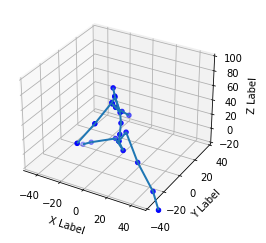

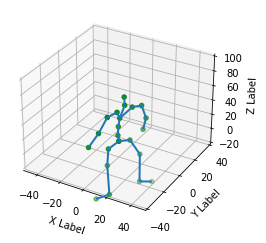

Epoch :  147
Batch : 0, Discriminator loss: 3.253989416407421e-05, Generator loss : 5.042387008666992
Batch : 25, Discriminator loss: 2.231789864026723e-07, Generator loss : 4.9120588302612305
Batch : 50, Discriminator loss: 0.0002110032073687762, Generator loss : 9.595398902893066
Batch : 75, Discriminator loss: 3.7335645686198404e-08, Generator loss : 9.210227966308594
Batch : 100, Discriminator loss: 0.0004460026684682816, Generator loss : 4.290249824523926
Epoch 147 complete, cumulated Discriminator loss : 0.006889264099299908, cumulated Generator loss : 733.8948364257812


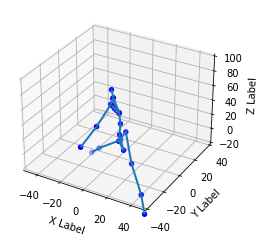

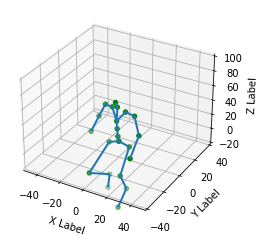

Epoch :  148
Batch : 0, Discriminator loss: 1.1307674867566675e-05, Generator loss : 6.721189498901367
Batch : 25, Discriminator loss: 5.5011085350997746e-05, Generator loss : 7.0295257568359375
Batch : 50, Discriminator loss: 6.049932380847167e-06, Generator loss : 5.836614608764648
Batch : 75, Discriminator loss: 1.1366300611825864e-07, Generator loss : 4.694216251373291
Batch : 100, Discriminator loss: 1.8026489101430343e-07, Generator loss : 7.093235969543457
Epoch 148 complete, cumulated Discriminator loss : 0.007008188869804144, cumulated Generator loss : 683.4501342773438


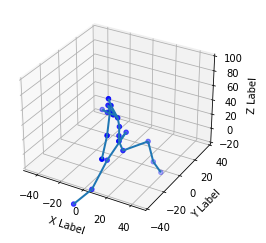

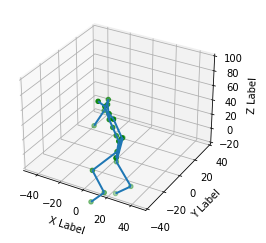

Epoch :  149
Batch : 0, Discriminator loss: 1.804865590315785e-08, Generator loss : 2.8147835731506348
Batch : 25, Discriminator loss: 8.285212516057072e-09, Generator loss : 4.281118392944336
Batch : 50, Discriminator loss: 1.1346466635586694e-05, Generator loss : 5.303509712219238
Batch : 75, Discriminator loss: 8.559060006518848e-06, Generator loss : 5.650505065917969
Batch : 100, Discriminator loss: 2.0464881345105823e-06, Generator loss : 8.556068420410156
Epoch 149 complete, cumulated Discriminator loss : 0.0029781220946460962, cumulated Generator loss : 704.83935546875


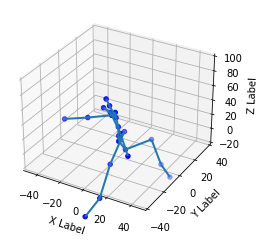

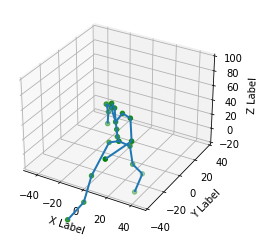

Epoch :  150
Batch : 0, Discriminator loss: 1.2834446749820927e-07, Generator loss : 5.730766773223877
Batch : 25, Discriminator loss: 4.912352551400545e-07, Generator loss : 11.69880199432373
Batch : 50, Discriminator loss: 5.246673708825256e-07, Generator loss : 6.027204513549805
Batch : 75, Discriminator loss: 9.849295565800276e-07, Generator loss : 4.375483512878418
Batch : 100, Discriminator loss: 1.2108456758141983e-05, Generator loss : 12.591854095458984
Epoch 150 complete, cumulated Discriminator loss : 0.004429841414093971, cumulated Generator loss : 692.169189453125


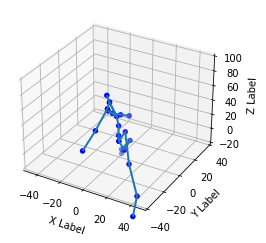

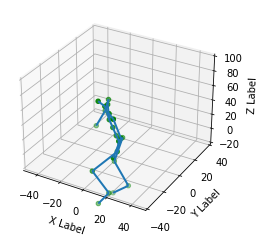

Epoch :  151
Batch : 0, Discriminator loss: 9.083739982429506e-09, Generator loss : 4.761456489562988
Batch : 25, Discriminator loss: 3.1864888114796486e-06, Generator loss : 5.674911975860596
Batch : 50, Discriminator loss: 6.7111891439708415e-06, Generator loss : 4.309192180633545
Batch : 75, Discriminator loss: 7.825563807273284e-05, Generator loss : 6.228352069854736
Batch : 100, Discriminator loss: 0.0074190194718539715, Generator loss : 3.789398670196533
Epoch 151 complete, cumulated Discriminator loss : 0.020194128155708313, cumulated Generator loss : 670.9946899414062


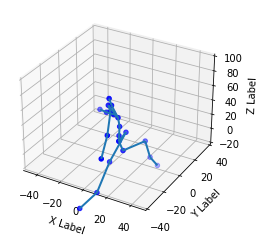

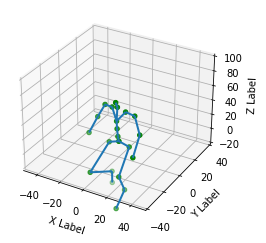

Epoch :  152
Batch : 0, Discriminator loss: 1.5323578281822847e-06, Generator loss : 12.020248413085938
Batch : 25, Discriminator loss: 3.4887943911598995e-07, Generator loss : 4.474119186401367
Batch : 50, Discriminator loss: 1.273284624403459e-06, Generator loss : 8.048491477966309
Batch : 75, Discriminator loss: 1.9290419572826067e-07, Generator loss : 6.596775054931641
Batch : 100, Discriminator loss: 4.797633437192417e-07, Generator loss : 5.001768112182617
Epoch 152 complete, cumulated Discriminator loss : 0.004167265724390745, cumulated Generator loss : 695.4013061523438


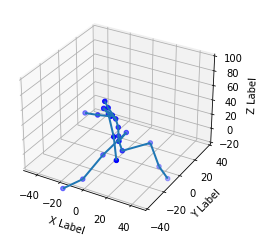

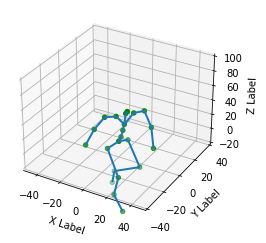

Epoch :  153
Batch : 0, Discriminator loss: 8.996591532195453e-06, Generator loss : 5.178136825561523
Batch : 25, Discriminator loss: 2.023711203946732e-06, Generator loss : 5.3060455322265625
Batch : 50, Discriminator loss: 4.212324711261317e-08, Generator loss : 4.477237701416016
Batch : 75, Discriminator loss: 1.5222435933992529e-07, Generator loss : 5.631005764007568
Batch : 100, Discriminator loss: 1.1652181086674318e-07, Generator loss : 6.4590020179748535
Epoch 153 complete, cumulated Discriminator loss : 0.0844942182302475, cumulated Generator loss : 654.8848266601562


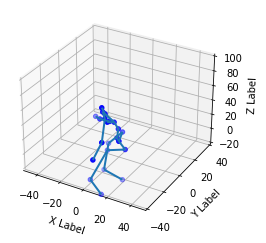

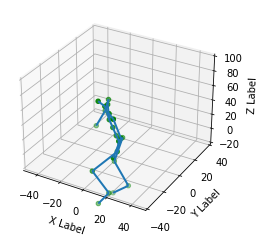

Epoch :  154
Batch : 0, Discriminator loss: 5.029527528677136e-06, Generator loss : 9.332143783569336
Batch : 25, Discriminator loss: 1.4646516888205952e-07, Generator loss : 4.206812381744385
Batch : 50, Discriminator loss: 1.3586928844233626e-06, Generator loss : 4.46068811416626
Batch : 75, Discriminator loss: 4.783203166880412e-06, Generator loss : 5.543272495269775
Batch : 100, Discriminator loss: 1.6054868865467142e-06, Generator loss : 4.472945213317871
Epoch 154 complete, cumulated Discriminator loss : 0.010552950203418732, cumulated Generator loss : 658.7462158203125


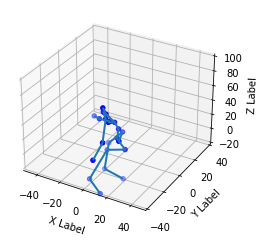

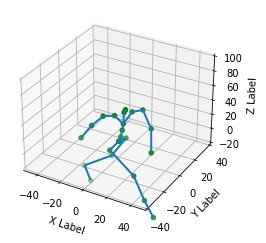

Epoch :  155
Batch : 0, Discriminator loss: 6.702275356929022e-08, Generator loss : 6.056025505065918
Batch : 25, Discriminator loss: 0.0003173927834723145, Generator loss : 7.504511833190918
Batch : 50, Discriminator loss: 1.2132588835811475e-06, Generator loss : 11.339096069335938
Batch : 75, Discriminator loss: 1.6535688018848305e-07, Generator loss : 5.661403656005859
Batch : 100, Discriminator loss: 1.1857237325330061e-07, Generator loss : 9.77988338470459
Epoch 155 complete, cumulated Discriminator loss : 0.005274883005768061, cumulated Generator loss : 654.8189086914062


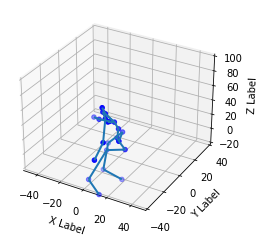

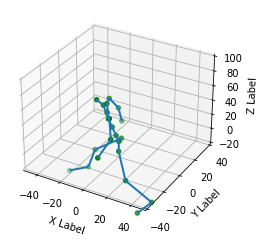

Epoch :  156
Batch : 0, Discriminator loss: 1.9655547021102393e-06, Generator loss : 33.764305114746094
Batch : 25, Discriminator loss: 6.582286573575402e-07, Generator loss : 10.092756271362305
Batch : 50, Discriminator loss: 1.6057036873462494e-06, Generator loss : 3.5116989612579346
Batch : 75, Discriminator loss: 1.4227482552087167e-06, Generator loss : 5.095429420471191
Batch : 100, Discriminator loss: 6.623978697462007e-05, Generator loss : 7.3272199630737305
Epoch 156 complete, cumulated Discriminator loss : 0.043232545256614685, cumulated Generator loss : 659.6190185546875


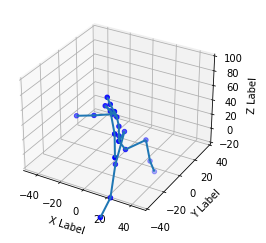

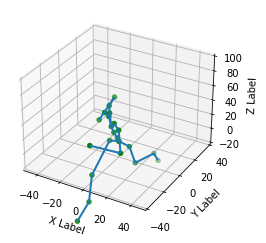

Epoch :  157
Batch : 0, Discriminator loss: 1.4180674270392046e-06, Generator loss : 8.018899917602539
Batch : 25, Discriminator loss: 8.785256255805507e-08, Generator loss : 5.721591472625732
Batch : 50, Discriminator loss: 3.7122386942201047e-08, Generator loss : 8.874053955078125
Batch : 75, Discriminator loss: 6.049014700693078e-06, Generator loss : 5.1028828620910645
Batch : 100, Discriminator loss: 8.848875950207002e-06, Generator loss : 4.356789588928223
Epoch 157 complete, cumulated Discriminator loss : 0.09418302029371262, cumulated Generator loss : 767.0191040039062


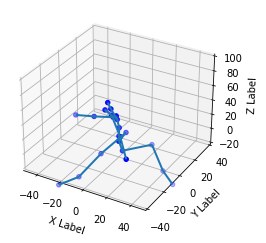

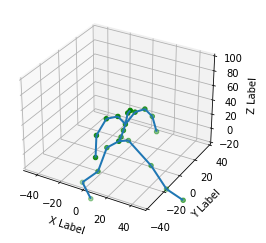

Epoch :  158
Batch : 0, Discriminator loss: 7.79468518885551e-06, Generator loss : 6.038496494293213
Batch : 25, Discriminator loss: 2.192755204077912e-07, Generator loss : 5.112310886383057
Batch : 50, Discriminator loss: 1.1667727761732749e-07, Generator loss : 2.6447670459747314
Batch : 75, Discriminator loss: 3.0348903123922355e-07, Generator loss : 10.49056625366211
Batch : 100, Discriminator loss: 1.3315806427272037e-05, Generator loss : 5.840538024902344
Epoch 158 complete, cumulated Discriminator loss : 0.027233419939875603, cumulated Generator loss : 611.1829223632812


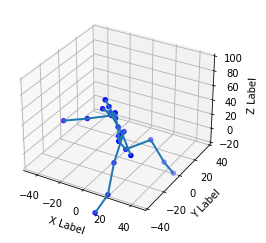

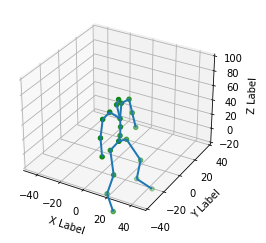

Epoch :  159
Batch : 0, Discriminator loss: 6.188211955304723e-06, Generator loss : 4.940186023712158
Batch : 25, Discriminator loss: 3.517877473768749e-07, Generator loss : 5.124090671539307
Batch : 50, Discriminator loss: 4.544269529560552e-07, Generator loss : 6.1270751953125
Batch : 75, Discriminator loss: 3.0087694540270604e-05, Generator loss : 3.230631113052368
Batch : 100, Discriminator loss: 1.7517830031010817e-07, Generator loss : 6.049768447875977
Epoch 159 complete, cumulated Discriminator loss : 0.019719086587429047, cumulated Generator loss : 663.0147094726562


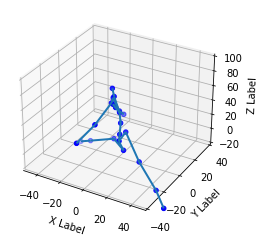

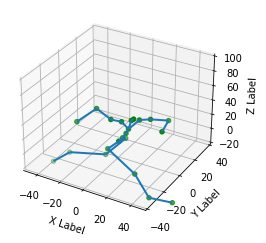

Epoch :  160
Batch : 0, Discriminator loss: 0.002596637001261115, Generator loss : 4.977481365203857
Batch : 25, Discriminator loss: 3.1443030934497074e-07, Generator loss : 4.367307662963867
Batch : 50, Discriminator loss: 1.2622521126104402e-06, Generator loss : 6.111886024475098
Batch : 75, Discriminator loss: 7.650891475918797e-09, Generator loss : 3.3006670475006104
Batch : 100, Discriminator loss: 5.68532918521214e-08, Generator loss : 5.315884113311768
Epoch 160 complete, cumulated Discriminator loss : 0.0044619012624025345, cumulated Generator loss : 616.849365234375


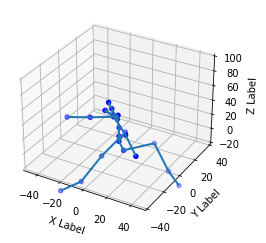

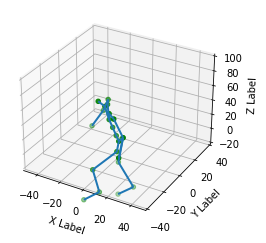

Epoch :  161
Batch : 0, Discriminator loss: 1.38807695293508e-06, Generator loss : 4.248183250427246
Batch : 25, Discriminator loss: 4.2034847069771786e-07, Generator loss : 5.590773582458496
Batch : 50, Discriminator loss: 8.441284080618061e-07, Generator loss : 7.079718589782715
Batch : 75, Discriminator loss: 3.3479373939826473e-08, Generator loss : 3.4066295623779297
Batch : 100, Discriminator loss: 3.907337031705538e-08, Generator loss : 5.354374885559082
Epoch 161 complete, cumulated Discriminator loss : 0.06293822079896927, cumulated Generator loss : 598.3843383789062


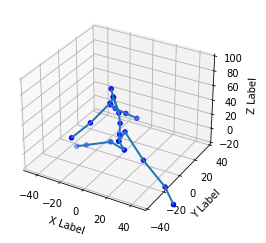

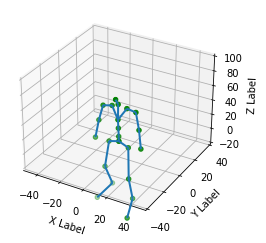

Epoch :  162
Batch : 0, Discriminator loss: 2.718049358918506e-07, Generator loss : 6.1357645988464355
Batch : 25, Discriminator loss: 5.896056336496258e-07, Generator loss : 8.869974136352539
Batch : 50, Discriminator loss: 8.768964107730426e-06, Generator loss : 3.628892183303833
Batch : 75, Discriminator loss: 1.375754834498366e-07, Generator loss : 5.20129919052124
Batch : 100, Discriminator loss: 1.0614339771564119e-06, Generator loss : 6.387197971343994
Epoch 162 complete, cumulated Discriminator loss : 0.3740138113498688, cumulated Generator loss : 594.787353515625


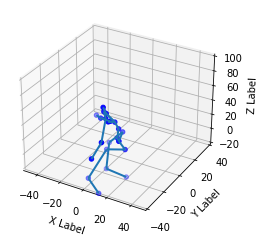

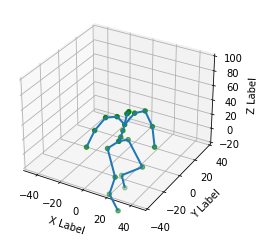

Epoch :  163
Batch : 0, Discriminator loss: 5.6599066766693795e-08, Generator loss : 4.029473781585693
Batch : 25, Discriminator loss: 7.036411989247426e-05, Generator loss : 8.790851593017578
Batch : 50, Discriminator loss: 3.620332478249111e-08, Generator loss : 3.9520931243896484
Batch : 75, Discriminator loss: 1.6354235867765965e-06, Generator loss : 7.569479942321777
Batch : 100, Discriminator loss: 1.5740663457108894e-06, Generator loss : 7.700470447540283
Epoch 163 complete, cumulated Discriminator loss : 0.057682473212480545, cumulated Generator loss : 609.5525512695312


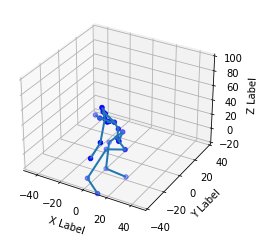

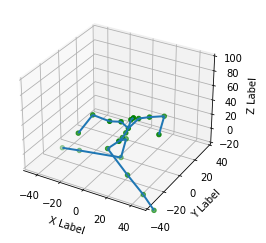

Epoch :  164
Batch : 0, Discriminator loss: 4.539763764910276e-08, Generator loss : 4.048587799072266
Batch : 25, Discriminator loss: 9.333953698842379e-07, Generator loss : 5.34989595413208
Batch : 50, Discriminator loss: 5.4087021084114895e-08, Generator loss : 3.37226939201355
Batch : 75, Discriminator loss: 6.154829179649823e-08, Generator loss : 3.504805088043213
Batch : 100, Discriminator loss: 8.540699525383388e-08, Generator loss : 5.301190376281738
Epoch 164 complete, cumulated Discriminator loss : 0.006070352159440517, cumulated Generator loss : 594.46142578125


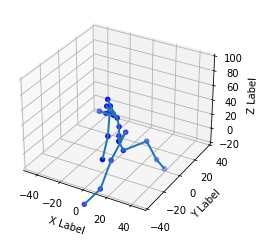

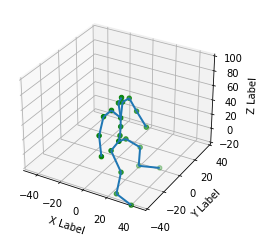

Epoch :  165
Batch : 0, Discriminator loss: 0.006283425725996494, Generator loss : 5.10801887512207
Batch : 25, Discriminator loss: 0.00022615825582761317, Generator loss : 6.599246978759766
Batch : 50, Discriminator loss: 0.0012196045136079192, Generator loss : 4.9946513175964355
Batch : 75, Discriminator loss: 1.23674425367426e-07, Generator loss : 4.819386005401611
Batch : 100, Discriminator loss: 7.891298992035445e-06, Generator loss : 8.47270679473877
Epoch 165 complete, cumulated Discriminator loss : 0.009902440011501312, cumulated Generator loss : 614.3540649414062


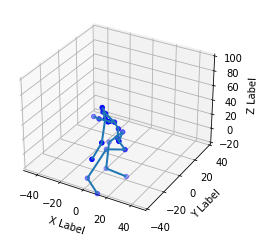

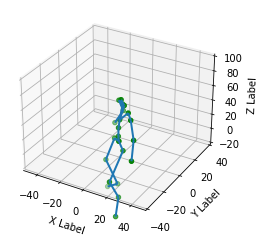

Epoch :  166
Batch : 0, Discriminator loss: 8.060545155785803e-07, Generator loss : 4.613244533538818
Batch : 25, Discriminator loss: 0.000557407271116972, Generator loss : 8.675853729248047
Batch : 50, Discriminator loss: 3.8515189260124316e-08, Generator loss : 5.739373683929443
Batch : 75, Discriminator loss: 1.5120845091587398e-06, Generator loss : 4.203766822814941
Batch : 100, Discriminator loss: 1.0378543890965375e-07, Generator loss : 10.352429389953613
Epoch 166 complete, cumulated Discriminator loss : 0.05480511114001274, cumulated Generator loss : 554.6703491210938


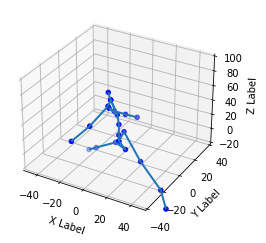

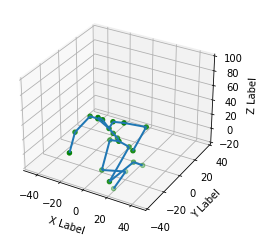

Epoch :  167
Batch : 0, Discriminator loss: 0.006563887465745211, Generator loss : 3.1605594158172607
Batch : 25, Discriminator loss: 1.0341621958787073e-07, Generator loss : 3.7658748626708984
Batch : 50, Discriminator loss: 7.268830017892469e-07, Generator loss : 5.355995178222656
Batch : 75, Discriminator loss: 0.00031568450503982604, Generator loss : 3.4810941219329834
Batch : 100, Discriminator loss: 6.112930162061048e-10, Generator loss : 3.2537076473236084
Epoch 167 complete, cumulated Discriminator loss : 0.06985465437173843, cumulated Generator loss : 589.32568359375


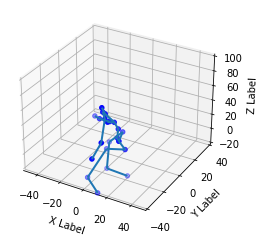

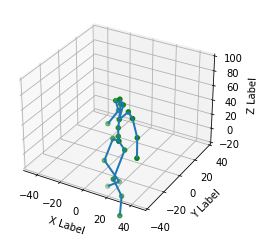

Epoch :  168
Batch : 0, Discriminator loss: 2.4989341795844666e-07, Generator loss : 16.016447067260742
Batch : 25, Discriminator loss: 0.001022429671138525, Generator loss : 6.785120010375977
Batch : 50, Discriminator loss: 4.10535249102395e-05, Generator loss : 9.446087837219238
Batch : 75, Discriminator loss: 6.662488658548682e-07, Generator loss : 4.3299736976623535
Batch : 100, Discriminator loss: 4.880141446506059e-08, Generator loss : 5.639427185058594
Epoch 168 complete, cumulated Discriminator loss : 0.31746652722358704, cumulated Generator loss : 592.3140258789062


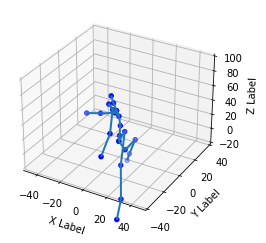

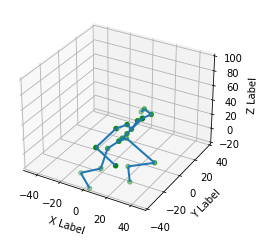

Epoch :  169
Batch : 0, Discriminator loss: 4.730743796699244e-08, Generator loss : 4.501124382019043
Batch : 25, Discriminator loss: 3.2229622775048483e-06, Generator loss : 8.232134819030762
Batch : 50, Discriminator loss: 2.534131908760173e-07, Generator loss : 4.027853488922119
Batch : 75, Discriminator loss: 4.992194249098247e-07, Generator loss : 10.099721908569336
Batch : 100, Discriminator loss: 1.9741473806789145e-06, Generator loss : 3.7663257122039795
Epoch 169 complete, cumulated Discriminator loss : 0.015566491521894932, cumulated Generator loss : 591.8400268554688


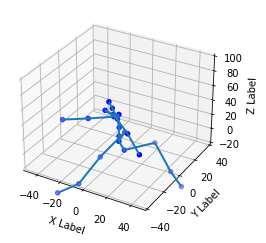

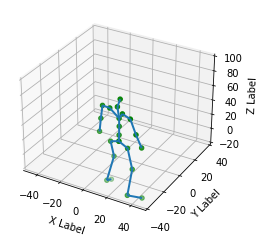

Epoch :  170
Batch : 0, Discriminator loss: 1.4309298421721905e-05, Generator loss : 4.375016689300537
Batch : 25, Discriminator loss: 4.5980101504028426e-07, Generator loss : 31.597978591918945
Batch : 50, Discriminator loss: 9.302129183197394e-05, Generator loss : 4.096663951873779
Batch : 75, Discriminator loss: 1.6129876030390733e-06, Generator loss : 5.557739734649658
Batch : 100, Discriminator loss: 4.7177411488519283e-07, Generator loss : 9.465104103088379
Epoch 170 complete, cumulated Discriminator loss : 0.014670411124825478, cumulated Generator loss : 617.8423461914062


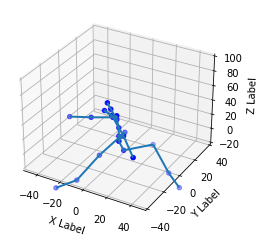

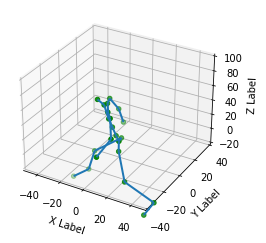

Epoch :  171
Batch : 0, Discriminator loss: 1.3550914445659146e-05, Generator loss : 5.889253616333008
Batch : 25, Discriminator loss: 1.234484329870611e-06, Generator loss : 9.360042572021484
Batch : 50, Discriminator loss: 0.0003650367434602231, Generator loss : 4.878512859344482
Batch : 75, Discriminator loss: 2.402140489721205e-05, Generator loss : 3.0061123371124268
Batch : 100, Discriminator loss: 7.511845012686535e-08, Generator loss : 3.6369330883026123
Epoch 171 complete, cumulated Discriminator loss : 0.005918846931308508, cumulated Generator loss : 580.769287109375


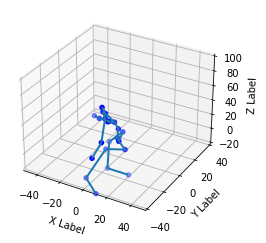

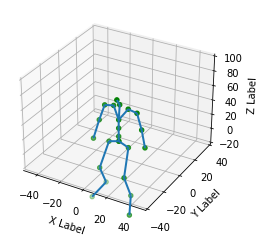

Epoch :  172
Batch : 0, Discriminator loss: 0.009360251948237419, Generator loss : 4.207221508026123
Batch : 25, Discriminator loss: 2.594308625702979e-07, Generator loss : 8.869163513183594
Batch : 50, Discriminator loss: 3.038383340481232e-07, Generator loss : 3.474118709564209
Batch : 75, Discriminator loss: 2.0183526885375613e-06, Generator loss : 8.305766105651855
Batch : 100, Discriminator loss: 1.3632516129291616e-06, Generator loss : 4.633686065673828
Epoch 172 complete, cumulated Discriminator loss : 0.15163367986679077, cumulated Generator loss : 551.474853515625


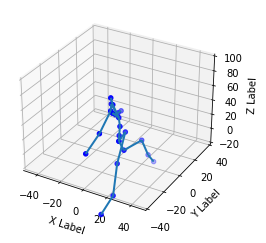

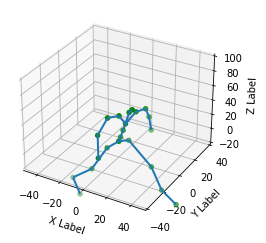

Epoch :  173
Batch : 0, Discriminator loss: 0.0028740433044731617, Generator loss : 7.340960502624512
Batch : 25, Discriminator loss: 5.4362708112876135e-08, Generator loss : 4.865387439727783
Batch : 50, Discriminator loss: 1.3957851763279905e-08, Generator loss : 3.391101598739624
Batch : 75, Discriminator loss: 0.0009049428626894951, Generator loss : 6.010149002075195
Batch : 100, Discriminator loss: 1.8038589360003243e-06, Generator loss : 5.881042957305908
Epoch 173 complete, cumulated Discriminator loss : 0.034309547394514084, cumulated Generator loss : 563.633056640625


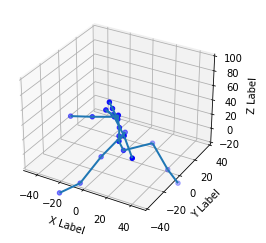

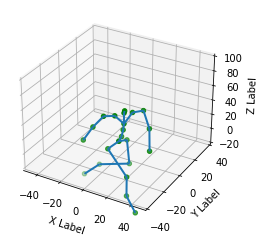

Epoch :  174
Batch : 0, Discriminator loss: 8.027949149891356e-08, Generator loss : 5.099874019622803
Batch : 25, Discriminator loss: 1.7385602291142277e-07, Generator loss : 4.791421890258789
Batch : 50, Discriminator loss: 2.060841666207125e-07, Generator loss : 4.055960178375244
Batch : 75, Discriminator loss: 3.145090659018024e-07, Generator loss : 4.56927490234375
Batch : 100, Discriminator loss: 0.0002959101111628115, Generator loss : 4.472085952758789
Epoch 174 complete, cumulated Discriminator loss : 0.058055002242326736, cumulated Generator loss : 553.6033325195312


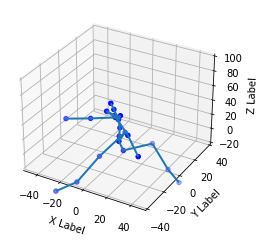

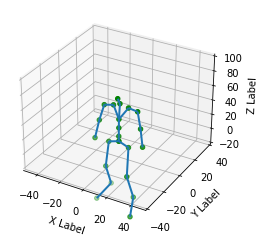

Epoch :  175
Batch : 0, Discriminator loss: 2.3086778355718707e-07, Generator loss : 6.723154067993164
Batch : 25, Discriminator loss: 4.2823223338928074e-05, Generator loss : 4.162200927734375
Batch : 50, Discriminator loss: 6.8246110984659936e-09, Generator loss : 4.591822624206543
Batch : 75, Discriminator loss: 0.009202334098517895, Generator loss : 4.043837547302246
Batch : 100, Discriminator loss: 4.8910364967014175e-06, Generator loss : 6.6283793449401855
Epoch 175 complete, cumulated Discriminator loss : 0.0247747041285038, cumulated Generator loss : 557.7279663085938


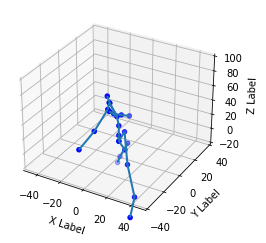

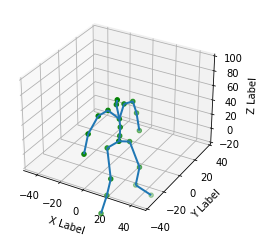

Epoch :  176
Batch : 0, Discriminator loss: 3.434953157466225e-07, Generator loss : 7.757232666015625
Batch : 25, Discriminator loss: 1.2048672033415642e-06, Generator loss : 2.797851085662842
Batch : 50, Discriminator loss: 1.8346669605762145e-07, Generator loss : 6.704624176025391
Batch : 75, Discriminator loss: 1.6048912243604718e-07, Generator loss : 9.347256660461426
Batch : 100, Discriminator loss: 2.893686996685574e-06, Generator loss : 3.745375871658325
Epoch 176 complete, cumulated Discriminator loss : 0.005341581534594297, cumulated Generator loss : 569.9627075195312


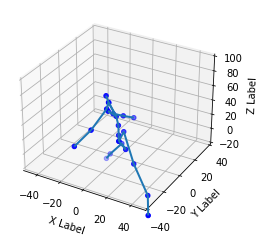

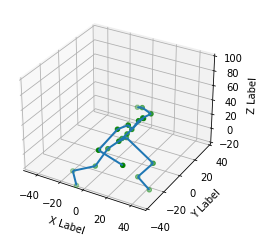

Epoch :  177
Batch : 0, Discriminator loss: 1.1557243624338298e-06, Generator loss : 3.9095852375030518
Batch : 25, Discriminator loss: 4.135291220563886e-08, Generator loss : 3.562330722808838
Batch : 50, Discriminator loss: 2.9470643312379252e-06, Generator loss : 6.92086124420166
Batch : 75, Discriminator loss: 6.795949616389407e-07, Generator loss : 3.692840814590454
Batch : 100, Discriminator loss: 3.837116310023703e-06, Generator loss : 3.948441743850708
Epoch 177 complete, cumulated Discriminator loss : 0.002900784369558096, cumulated Generator loss : 526.5946655273438


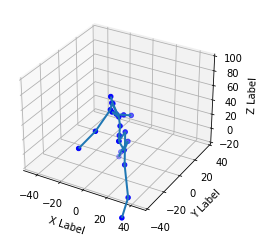

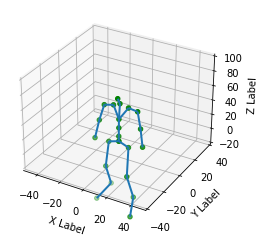

Epoch :  178
Batch : 0, Discriminator loss: 1.2127339132916859e-08, Generator loss : 4.169957637786865
Batch : 25, Discriminator loss: 7.029971271776958e-08, Generator loss : 4.3638715744018555
Batch : 50, Discriminator loss: 3.630333722526302e-08, Generator loss : 5.622225284576416
Batch : 75, Discriminator loss: 6.039178515493404e-06, Generator loss : 3.3013155460357666
Batch : 100, Discriminator loss: 3.65694994286514e-08, Generator loss : 7.814846038818359
Epoch 178 complete, cumulated Discriminator loss : 0.004406759049743414, cumulated Generator loss : 575.1246948242188


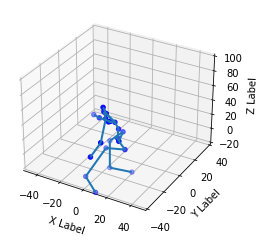

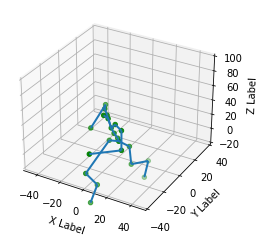

Epoch :  179
Batch : 0, Discriminator loss: 8.608649295638315e-07, Generator loss : 3.6216466426849365
Batch : 25, Discriminator loss: 2.2161966626299545e-06, Generator loss : 6.504158973693848
Batch : 50, Discriminator loss: 1.6543705214644433e-06, Generator loss : 4.3834333419799805
Batch : 75, Discriminator loss: 8.407247378272587e-07, Generator loss : 2.6047565937042236
Batch : 100, Discriminator loss: 1.6614691844551999e-07, Generator loss : 3.9289889335632324
Epoch 179 complete, cumulated Discriminator loss : 0.013266410678625107, cumulated Generator loss : 516.324462890625


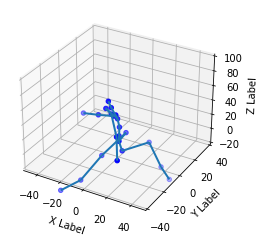

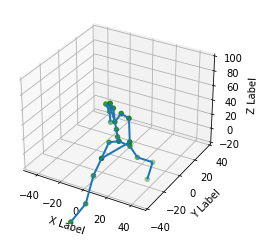

Epoch :  180
Batch : 0, Discriminator loss: 1.6556750779272988e-06, Generator loss : 3.5896153450012207
Batch : 25, Discriminator loss: 9.896717756419093e-08, Generator loss : 5.454735279083252
Batch : 50, Discriminator loss: 1.0978582309917329e-07, Generator loss : 3.536560297012329
Batch : 75, Discriminator loss: 6.4221376305795275e-06, Generator loss : 5.005480766296387
Batch : 100, Discriminator loss: 3.4963963457812497e-07, Generator loss : 5.070660591125488
Epoch 180 complete, cumulated Discriminator loss : 0.001564652076922357, cumulated Generator loss : 543.7747192382812


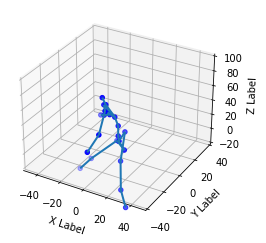

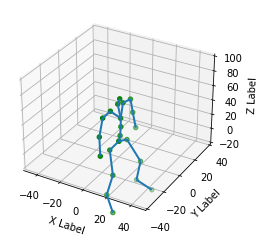

Epoch :  181
Batch : 0, Discriminator loss: 2.0109441720705945e-06, Generator loss : 5.5726118087768555
Batch : 25, Discriminator loss: 1.8467321893922417e-08, Generator loss : 3.6191372871398926
Batch : 50, Discriminator loss: 1.8251503206556663e-05, Generator loss : 3.7653605937957764
Batch : 75, Discriminator loss: 2.78786296803446e-06, Generator loss : 4.966981410980225
Batch : 100, Discriminator loss: 1.2509010502981255e-06, Generator loss : 3.7940165996551514
Epoch 181 complete, cumulated Discriminator loss : 0.0035613318905234337, cumulated Generator loss : 552.3353271484375


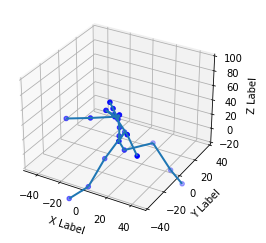

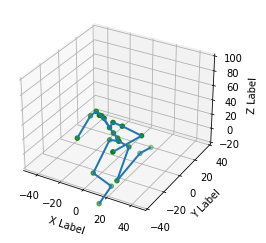

Epoch :  182
Batch : 0, Discriminator loss: 4.137666564929532e-08, Generator loss : 4.160380840301514
Batch : 25, Discriminator loss: 4.985449209016224e-07, Generator loss : 4.408746242523193
Batch : 50, Discriminator loss: 1.147231358800127e-07, Generator loss : 6.690243721008301
Batch : 75, Discriminator loss: 1.536235686216969e-06, Generator loss : 3.4796230792999268
Batch : 100, Discriminator loss: 1.538104015708086e-06, Generator loss : 3.52533221244812
Epoch 182 complete, cumulated Discriminator loss : 0.04053281247615814, cumulated Generator loss : 510.48529052734375


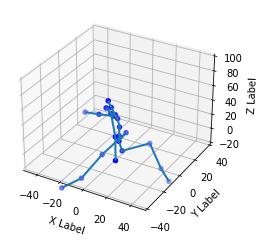

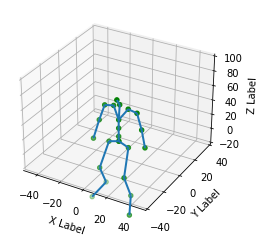

Epoch :  183
Batch : 0, Discriminator loss: 1.062567207554821e-05, Generator loss : 4.3090925216674805
Batch : 25, Discriminator loss: 1.3597983752333676e-06, Generator loss : 2.8696000576019287
Batch : 50, Discriminator loss: 2.662959559529554e-07, Generator loss : 2.806992769241333
Batch : 75, Discriminator loss: 1.7062735651052208e-06, Generator loss : 2.6652932167053223
Batch : 100, Discriminator loss: 1.479669151649432e-07, Generator loss : 4.823655128479004
Epoch 183 complete, cumulated Discriminator loss : 0.04675564169883728, cumulated Generator loss : 513.3452758789062


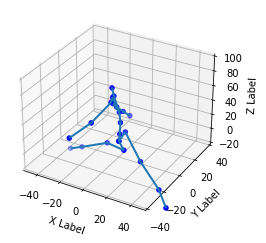

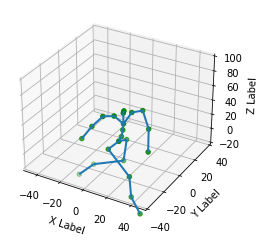

Epoch :  184
Batch : 0, Discriminator loss: 2.591028533061035e-05, Generator loss : 4.308483600616455
Batch : 25, Discriminator loss: 1.0257576832373161e-05, Generator loss : 3.3649423122406006
Batch : 50, Discriminator loss: 4.436699185816906e-08, Generator loss : 4.5447678565979
Batch : 75, Discriminator loss: 1.9944691302953288e-05, Generator loss : 11.076047897338867
Batch : 100, Discriminator loss: 2.408903583273059e-07, Generator loss : 7.890350341796875
Epoch 184 complete, cumulated Discriminator loss : 0.0009965932695195079, cumulated Generator loss : 666.6239624023438


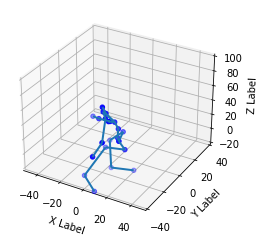

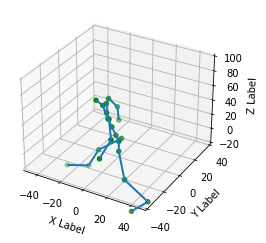

Epoch :  185
Batch : 0, Discriminator loss: 5.210124243149039e-08, Generator loss : 8.907028198242188
Batch : 25, Discriminator loss: 8.642167870220874e-09, Generator loss : 3.7955751419067383
Batch : 50, Discriminator loss: 1.4669974746084335e-07, Generator loss : 4.639089107513428
Batch : 75, Discriminator loss: 4.8060407209504774e-08, Generator loss : 3.3569400310516357
Batch : 100, Discriminator loss: 5.671611233992735e-06, Generator loss : 4.5030083656311035
Epoch 185 complete, cumulated Discriminator loss : 0.028858352452516556, cumulated Generator loss : 518.5521240234375


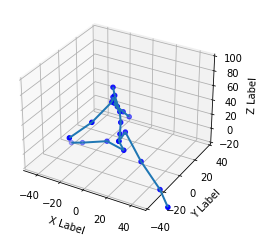

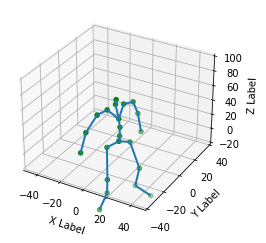

Epoch :  186
Batch : 0, Discriminator loss: 4.6752592197663034e-07, Generator loss : 4.214722633361816
Batch : 25, Discriminator loss: 1.3855923519656699e-08, Generator loss : 3.8753058910369873
Batch : 50, Discriminator loss: 0.06338221579790115, Generator loss : 7.440550327301025
Batch : 75, Discriminator loss: 9.995118688266302e-08, Generator loss : 3.528388261795044
Batch : 100, Discriminator loss: 1.3102406626330776e-07, Generator loss : 2.668959140777588
Epoch 186 complete, cumulated Discriminator loss : 0.08250932395458221, cumulated Generator loss : 510.5140075683594


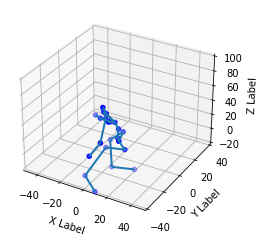

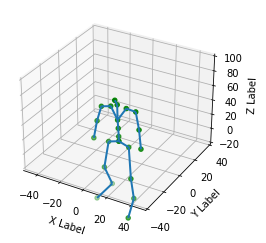

Epoch :  187
Batch : 0, Discriminator loss: 8.395441909669898e-06, Generator loss : 3.683494806289673
Batch : 25, Discriminator loss: 0.0005143091548234224, Generator loss : 6.700613975524902
Batch : 50, Discriminator loss: 1.3096938289436366e-07, Generator loss : 10.919181823730469
Batch : 75, Discriminator loss: 1.737695129122585e-06, Generator loss : 6.378781318664551
Batch : 100, Discriminator loss: 2.0338491424354288e-07, Generator loss : 5.397183895111084
Epoch 187 complete, cumulated Discriminator loss : 0.005593066103756428, cumulated Generator loss : 560.5827026367188


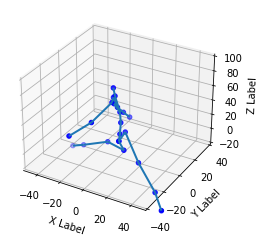

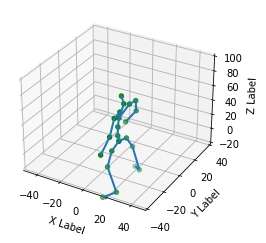

Epoch :  188
Batch : 0, Discriminator loss: 7.765576128804241e-07, Generator loss : 4.834168434143066
Batch : 25, Discriminator loss: 2.2505665242533723e-07, Generator loss : 5.3447723388671875
Batch : 50, Discriminator loss: 4.080090576508155e-08, Generator loss : 3.176828145980835
Batch : 75, Discriminator loss: 0.005311539396643639, Generator loss : 4.009491920471191
Batch : 100, Discriminator loss: 0.00023943703854456544, Generator loss : 2.518892526626587
Epoch 188 complete, cumulated Discriminator loss : 0.013777733780443668, cumulated Generator loss : 489.5959167480469


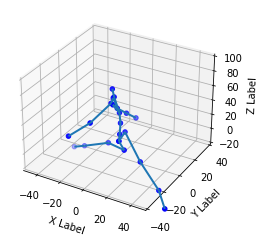

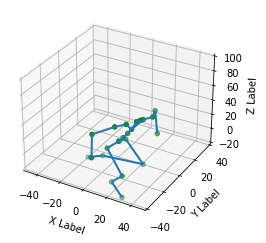

Epoch :  189
Batch : 0, Discriminator loss: 1.5624090465848894e-08, Generator loss : 3.746539831161499
Batch : 25, Discriminator loss: 9.748986684599004e-08, Generator loss : 2.9705734252929688
Batch : 50, Discriminator loss: 7.440447546969153e-08, Generator loss : 3.033569574356079
Batch : 75, Discriminator loss: 1.5186377311238175e-07, Generator loss : 4.106723308563232
Batch : 100, Discriminator loss: 5.510106007022841e-07, Generator loss : 27.96677589416504
Epoch 189 complete, cumulated Discriminator loss : 0.002739213639870286, cumulated Generator loss : 484.8074035644531


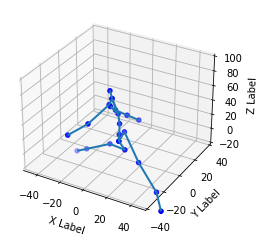

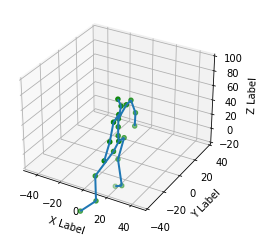

Epoch :  190
Batch : 0, Discriminator loss: 0.0009942224714905024, Generator loss : 6.261703968048096
Batch : 25, Discriminator loss: 6.212454195519967e-07, Generator loss : 2.890176296234131
Batch : 50, Discriminator loss: 2.452423723298125e-05, Generator loss : 3.4091556072235107
Batch : 75, Discriminator loss: 0.00019004101341124624, Generator loss : 9.097996711730957
Batch : 100, Discriminator loss: 4.256956565029668e-09, Generator loss : 3.3275952339172363
Epoch 190 complete, cumulated Discriminator loss : 0.008100579492747784, cumulated Generator loss : 513.715087890625


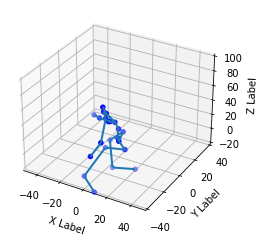

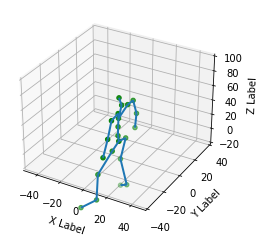

Epoch :  191
Batch : 0, Discriminator loss: 5.980301587271697e-09, Generator loss : 2.9802298545837402
Batch : 25, Discriminator loss: 1.3779732626062469e-06, Generator loss : 3.144505262374878
Batch : 50, Discriminator loss: 2.026951733569149e-06, Generator loss : 3.4739298820495605
Batch : 75, Discriminator loss: 6.709282018846352e-08, Generator loss : 4.272058010101318
Batch : 100, Discriminator loss: 2.0023821889481042e-07, Generator loss : 3.067228317260742
Epoch 191 complete, cumulated Discriminator loss : 0.0028070895932614803, cumulated Generator loss : 467.6814880371094


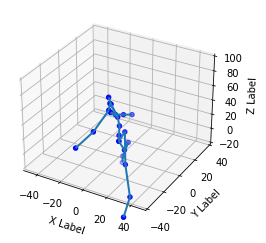

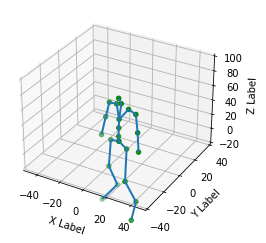

Epoch :  192
Batch : 0, Discriminator loss: 7.368994374701288e-07, Generator loss : 2.9767115116119385
Batch : 25, Discriminator loss: 7.979361953402986e-07, Generator loss : 5.405313491821289
Batch : 50, Discriminator loss: 5.610696121038927e-07, Generator loss : 4.708027362823486
Batch : 75, Discriminator loss: 3.2146581929737295e-07, Generator loss : 3.5767476558685303
Batch : 100, Discriminator loss: 1.265528482008449e-07, Generator loss : 5.604809284210205
Epoch 192 complete, cumulated Discriminator loss : 0.0006714123301208019, cumulated Generator loss : 479.1562194824219


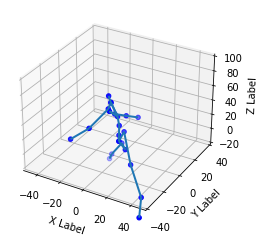

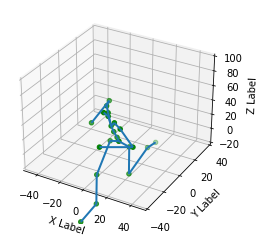

Epoch :  193
Batch : 0, Discriminator loss: 5.498820883076405e-07, Generator loss : 3.9543373584747314
Batch : 25, Discriminator loss: 2.7113685518997954e-08, Generator loss : 2.5606462955474854
Batch : 50, Discriminator loss: 4.7322906482349936e-08, Generator loss : 4.592296600341797
Batch : 75, Discriminator loss: 2.9376545640502627e-08, Generator loss : 3.759373188018799
Batch : 100, Discriminator loss: 1.5952696230669972e-07, Generator loss : 4.054471969604492
Epoch 193 complete, cumulated Discriminator loss : 0.0018941240850836039, cumulated Generator loss : 470.21844482421875


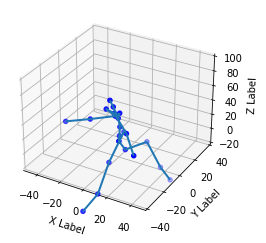

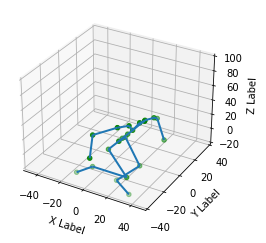

Epoch :  194
Batch : 0, Discriminator loss: 4.6250313801010634e-08, Generator loss : 3.9341917037963867
Batch : 25, Discriminator loss: 7.172457117121667e-05, Generator loss : 2.6751599311828613
Batch : 50, Discriminator loss: 5.2426422314511e-08, Generator loss : 3.522304058074951
Batch : 75, Discriminator loss: 1.2193927432235796e-05, Generator loss : 12.783576011657715
Batch : 100, Discriminator loss: 4.27648592449259e-06, Generator loss : 5.004572868347168
Epoch 194 complete, cumulated Discriminator loss : 0.07982070744037628, cumulated Generator loss : 536.5382080078125


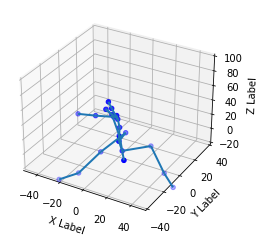

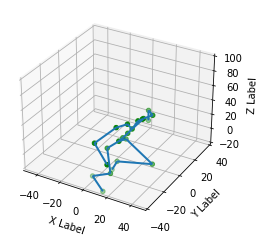

Epoch :  195
Batch : 0, Discriminator loss: 1.2562834399432177e-06, Generator loss : 27.105653762817383
Batch : 25, Discriminator loss: 9.687102647149004e-06, Generator loss : 4.009851932525635
Batch : 50, Discriminator loss: 5.724438324250514e-06, Generator loss : 3.107841968536377
Batch : 75, Discriminator loss: 8.78418650245294e-05, Generator loss : 3.008596420288086
Batch : 100, Discriminator loss: 1.9955118446546294e-08, Generator loss : 4.992862701416016
Epoch 195 complete, cumulated Discriminator loss : 0.082852803170681, cumulated Generator loss : 492.01239013671875


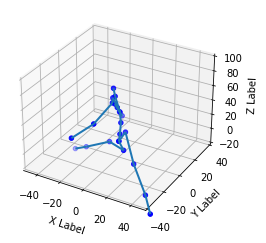

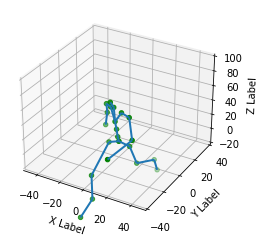

Epoch :  196
Batch : 0, Discriminator loss: 3.4576949019538006e-06, Generator loss : 4.681765079498291
Batch : 25, Discriminator loss: 2.1774361869120185e-08, Generator loss : 3.257660388946533
Batch : 50, Discriminator loss: 1.0288358609500392e-08, Generator loss : 4.829582691192627
Batch : 75, Discriminator loss: 3.1668849942434463e-07, Generator loss : 5.315201759338379
Batch : 100, Discriminator loss: 3.559063710412147e-09, Generator loss : 3.363691806793213
Epoch 196 complete, cumulated Discriminator loss : 0.04754273220896721, cumulated Generator loss : 458.036865234375


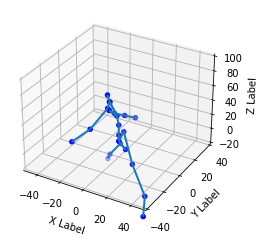

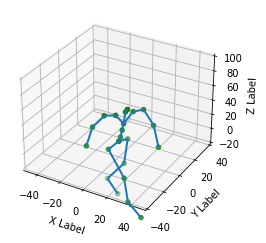

Epoch :  197
Batch : 0, Discriminator loss: 1.00594547802757e-07, Generator loss : 3.054827928543091
Batch : 25, Discriminator loss: 0.0013526846887543797, Generator loss : 2.7664339542388916
Batch : 50, Discriminator loss: 2.8006838874716777e-06, Generator loss : 2.742410182952881
Batch : 75, Discriminator loss: 1.3980073163111228e-05, Generator loss : 3.1820151805877686
Batch : 100, Discriminator loss: 5.010584118281258e-06, Generator loss : 4.2669782638549805
Epoch 197 complete, cumulated Discriminator loss : 0.0144319674000144, cumulated Generator loss : 439.1194763183594


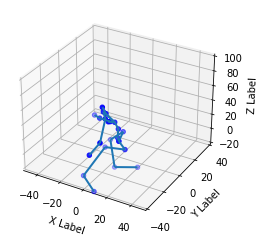

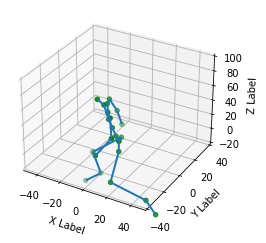

Epoch :  198
Batch : 0, Discriminator loss: 2.2586382328881882e-05, Generator loss : 2.8327910900115967
Batch : 25, Discriminator loss: 1.6793345025689632e-07, Generator loss : 2.9768261909484863
Batch : 50, Discriminator loss: 7.21232495948243e-09, Generator loss : 5.693009853363037
Batch : 75, Discriminator loss: 5.872588815236668e-08, Generator loss : 3.1368699073791504
Batch : 100, Discriminator loss: 2.9823693694197573e-05, Generator loss : 5.782177925109863
Epoch 198 complete, cumulated Discriminator loss : 0.0023563173599541187, cumulated Generator loss : 460.44573974609375


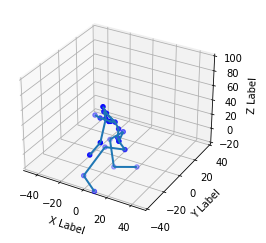

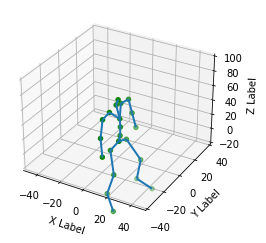

Epoch :  199
Batch : 0, Discriminator loss: 0.00022180762607604265, Generator loss : 5.921288967132568
Batch : 25, Discriminator loss: 1.6063175280578434e-05, Generator loss : 3.6826632022857666
Batch : 50, Discriminator loss: 8.419964387940126e-07, Generator loss : 4.863991737365723
Batch : 75, Discriminator loss: 3.828245809245345e-08, Generator loss : 2.759577989578247
Batch : 100, Discriminator loss: 4.688987189638283e-07, Generator loss : 3.756100654602051
Epoch 199 complete, cumulated Discriminator loss : 0.0029116524383425713, cumulated Generator loss : 440.7308044433594


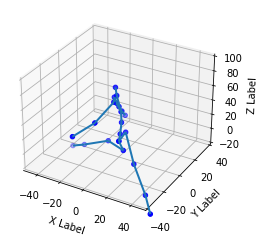

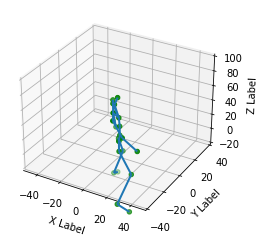

In [15]:
D_losses = []
G_losses = []
D_per_ep = []
G_per_ep = []

D_cumulative = 0
G_cumulative = 0

for ep in range(epochs):
    print('Epoch : ', ep)
    for i,motion in enumerate(train_Motion_Data):
        
        
        motion = motion.reshape(-1,motion.shape[-1]).float()
        
        curr_batch_size = motion.shape[0]
        offsets = torch.tensor(np.tile(anim.offsets[np.newaxis, :,:],(curr_batch_size, 1, 1)), device=default_device()).float()
        
        # GENERATE AUTO ENCODED POSE
        
        # first get the offsets from the static encoder 
        deep_offsets = static_encoder(offsets)
        latent, res = auto_encoder(motion, deep_offsets)
        
        # denormalize data to get correct forward kinematics 
        if isNormalize is True:
            res = dataset.denormalize(res)
            motion = dataset.denormalize(motion)
    
        # res has the shape [batch_size, (rotations+glob_pos+1)]
        
        res_rotation = res[:,:-4]
        res_velo = res[:,-4:-1]
        motion_rotation = motion[:,:-4]
        motion_velo = motion[:,-4:-1]
        
        # the current output rotation is not necessarily a normalized quaternion
        res_rotation = res_rotation.reshape(curr_batch_size,-1,4)
        res_rotation = torch.nn.functional.normalize(res_rotation, dim=2)
        
        # apply fk on generated pos, this will be the 'fake' data in the discriminator
        _, fake_pos = lafan_utils.quat_fk(res_rotation,
                                          offsets,
                                          anim.parents)
        
        # apply fk on generated pos, this will be the 'real' data in the discriminator
        _, real_pos = lafan_utils.quat_fk(motion_rotation.reshape(curr_batch_size,-1,4),
                                          offsets,
                                          anim.parents)
        
        # the GAN update code is mostly taken from :
        #https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html#loss-functions-and-optimizers
        
        # UPDATE DISCRIMINATOR :
        # first do real data batch then fake data
#         print(real_pos)
        discriminator.zero_grad()
        label = torch.full((curr_batch_size//2,), real_label, dtype=torch.float, device=device)
        # forward pass
        output = discriminator(real_pos.float()).view(-1)
        # calculate the loss and gradients
        loss_real = criterion_gan(output,label)
        loss_real.backward()
        
        # do the same with the generated position
        label.fill_(fake_label)
        # forward pass
        output = discriminator(fake_pos.float().detach()).view(-1)
        # calculate loss and gradients
        loss_fake = criterion_gan(output, label)
        loss_fake.backward()
        loss_discrim = loss_real + loss_fake
        
        # update discriminator gradients
        discrim_optimizer.step()
        
        # UPDATE GENERATOR NETWORK
        auto_encoder.zero_grad()
        static_encoder.zero_grad()
        
        # use real labels to maximize log(D(G(x))) instead of log(1-D(G(x)))
        label.fill_(real_label)
        # use updated discriminator
        output = discriminator(fake_pos.float()).view(-1)

        # Calculate the generator's loss and gradients
        loss_adv = criterion_gan(output,label)
        loss_ee  = criterion_ee(fake_pos[:,ee_id,:], real_pos[:,ee_id,:])
        loss_velo = criterion_velo(res_velo, motion_velo)
        loss_gen = loss_adv*mult_adv + loss_ee*mult_ee + loss_velo*mult_velo
        
        
        loss_gen.backward()
        # update the generator
        gen_optimizer.step()
        
        # record losses 
        D_cumulative += loss_discrim
        G_cumulative += loss_gen
        D_losses.append(loss_discrim)
        G_losses.append(loss_gen)
        
        if(i % 25 == 0):
            print("Batch : {}, Discriminator loss: {}, Generator loss : {}".format(i, loss_discrim, loss_gen))
        
    D_per_ep.append(D_cumulative)
    G_per_ep.append(G_cumulative)
      
    print("Epoch {} complete, cumulated Discriminator loss : {}, cumulated Generator loss : {}".format(ep, D_cumulative, G_cumulative) )
    
    D_cumulative = 0
    G_cumulative = 0
    
    # need to prepare validation data
#     for i,data in enumerate(torch_validation_celeba):
    with torch.no_grad():
        # TEST ON A RANDOM FRAME
        rand_index = np.random.randint(0,len(test_dataset))
        test_data = test_dataset[rand_index].float()
        
#         print(test_data)
        offsets = torch.tensor(np.tile(anim.offsets[np.newaxis, :,:],(2, 1, 1)), device=default_device()).float()
        # first get the offsets from the static encoder 
        deep_offsets = static_encoder(offsets)
        # print('offset shape : ', offsets.shape)
        latent, res = auto_encoder(test_data, deep_offsets)
        
#         print("latent code: \n", latent)
        
        if isNormalize is True:
            # denormalize data to get correct forward kinematics 
            res = dataset.denormalize(res)
            motion = dataset.denormalize(test_data)
        
        # res has the shape [batch_size, (rotations+glob_pos+1)]
        res_rotation = res[:,:-4]
        motion_rotation = motion[:,:-4]
        
        # the current output rotation is not necessarily a normalized quaternion
        res_rotation = res_rotation.reshape(2,-1,4)
        res_rotation = torch.nn.functional.normalize(res_rotation, dim=2)
        
#         print('unormalized rotations:', res)
#         print('normalized rotations :', res_rotation)
        
        # apply fk on generated pos, this will be the 'fake' data in the discriminator
        _, fake_pos = lafan_utils.quat_fk(res_rotation,
                                          offsets,
                                          anim.parents)
        
        # apply fk on generated pos, this will be the 'real' data in the discriminator
        _, real_pos = lafan_utils.quat_fk(motion_rotation.reshape(2,-1,4),
                                          offsets,
                                          anim.parents)
        
        skeleton_plot(fake_pos[0].cpu().detach(),edges, 'b')
        skeleton_plot(real_pos[0].cpu().detach(),edges, 'g')
